In [1]:
import os
import tensorflow
import tensorflow.keras
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.layers import Dense, Conv1D, Conv2D, Conv2DTranspose, Flatten, Dropout, ReLU, Input, MaxPooling1D, Reshape
from tensorflow.keras.models import Sequential, Model
import tensorflow.keras.backend as K

import numpy as np

/usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorf

LOAD DATABASES, CONCATENATE AND MIX THEM

In [2]:
rv = [54.]
nr = len(rv)



def load_and_shuffle_dbs(rv):
    paths = []
    for r in rv:
        paths.append(f"/scratch/scarpolini/databases/db_lorenz_{r:.1f}.npy")
    
    n_traj = 50000
    db = np.ndarray(shape=(nr*n_traj,2000,1))
    labels = []
    for path,r,i in zip(paths,rv,range(nr)):
        db1 = np.load(path)
        for j in range(n_traj):
            db[i*n_traj + j,:,0] = db1[j,0,:]
            labels.append(r)
    
    labels = np.array(labels)
    
    def unison_shuffled_copies(a, b):
        assert len(a) == len(b)
        p = np.random.permutation(len(a))
        return a[p], b[p]
    
    db, labels = unison_shuffled_copies(db, labels)
    return db, labels




db, labels = load_and_shuffle_dbs(rv)

PREPROCESSING

In [3]:
validation_split = 0.0

sig_len = len(db[0,:,0])
print(f"siglen: {sig_len}")
channels = 1 #len(db[0,0,:])
print(f"channels: {channels}")
n_traj = len(db[:,0,0])
print((f"n_traj: {n_traj}"))
# numero della prima traiettoria usata come validation
first_validation = n_traj #   round((1. - validation_split)*n_traj)
#  print(f"first_validation: {first_validation}")
db_train = np.ndarray(shape=(first_validation,sig_len,channels))
#db_test = np.ndarray(shape=(n_traj-first_validation,sig_len,channels))
db_train = db[:first_validation,:,0:channels]
#db_test = db[first_validation:,:,0:channels]
del db

print(db_train.shape)
#M = np.max(np.append(db_train, db_test))
#m = np.min(np.append(db_train, db_test))
M = np.max(db_train)
m = np.min(db_train)
print(M,m)
db_train = (db_train - m)/(M - m)
#db_test = (db_test - m)/(M - m)
M = np.max(db_train)
m = np.min(db_train)
print(M,m)

siglen: 2000
channels: 1
n_traj: 50000
(50000, 2000, 1)
31.27666666957781 -31.28223237314301
1.0 0.0


VISUALIZE DATA

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import numpy as np
%matplotlib inline

def plot_trajs(noise, real_trajs=None, epoch=None):
    import matplotlib.pyplot as plt
    gen_trajs = gen.predict(noise)
    
    try:
        if real_trajs==None:
            plt.figure(figsize=(18, 2))
            for i, traj in enumerate(gen_trajs):
                plt.subplot(1, 1, i+1)
                plt.plot(traj)
                #plt.axis('off')
    except:
        plt.figure(figsize=(18, 4))
        for i, traj in enumerate(gen_trajs):
            plt.subplot(2, 1, i+1)
            plt.plot(traj)
            #plt.axis('off')
        for i in range(len(gen_trajs)):
            plt.subplot(2, 1, len(gen_trajs)+i+1)
            n = round(np.random.uniform(0,len(real_trajs[:,0,0])))
            plt.plot(real_trajs[n,:,:])
            #plt.axis('off')
    plt.tight_layout()
    plt.show()
    

def plot_disc_predictions(disc, gen, batch_size, noise_dim, db):
    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
    plt.plot(disc.predict(gen.predict(noise)), label='fake')
    plt.plot(disc.predict(db[np.random.randint(len(db[:,0,0]),size=batch_size)]), label='real')
    plt.legend()
    plt.show()

ARCHITETTURA RETE NEURALE

# Losses

In [5]:
def wasserstein_loss(y_true, y_pred):
    return K.mean(y_true * y_pred)

def metric_1(y_true, y_pred):
    return K.mean(y_true) - K.mean(y_pred)

##  -1 vera
##  +1 falsa

# Generator

In [6]:
noise_dim = 100
sig_len, channels = len(db_train[0,:,0]), len(db_train[0,0,:])
fs = (20,1) # dimensione filtro
fm = 4 # numero filtri
init_sigma = 0.2 # varianza distribuzione parametri iniziali dei kernel
mean_init = 0.03
alpha = 0.3

def create_gen():
    generator = Sequential()
    # Starting size
    d = 5
    #4x1
    generator.add(Dense(d*fm, kernel_initializer=RandomNormal(mean_init, init_sigma), input_dim=noise_dim))
    generator.add(ReLU(negative_slope=alpha))
    #20x1
    generator.add(Reshape((d, 1, fm)))
    #5x4
    generator.add(Conv2DTranspose(fm, fs, strides=(5,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #50x4
    generator.add(Conv2DTranspose(fm, fs, strides=(5,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #250x4
    generator.add(Conv2DTranspose(fm, fs, strides=(4,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #2000x1
    generator.add(Conv2DTranspose(1, fs, strides=(4,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(Reshape((2000, 1)))
    return generator

gen = create_gen()
gen.summary()

W0429 16:37:00.729204 47197116378624 deprecation.py:506] From /usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorflow/python/keras/initializers.py:143: calling RandomNormal.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 20)                2020      
_________________________________________________________________
re_lu (ReLU)                 (None, 20)                0         
_________________________________________________________________
reshape (Reshape)            (None, 5, 1, 4)           0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 25, 1, 4)          324       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 25, 1, 4)          0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 125, 1, 4)         324       
_________________________________________________________________
re_lu_2 (ReLU)               (None, 125, 1, 4)         0

# Discriminatore

In [7]:
sig_len, channels = len(db_train[0,:,0]), len(db_train[0,0,:])
fs = 20 # dimensione filtro
fm = 4 # numero filtri
sigma_init = 0.2 # varianza distribuzione parametri iniziali dei kernel
mean_init = 0.0

def create_disc():
    discriminator = Sequential()
    #2000x1
    discriminator.add(Conv1D(fm, fs, strides=4, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init), input_shape=(sig_len, channels)))
    discriminator.add(ReLU())
    #250x4
    discriminator.add(Conv1D(fm, fs, strides=4, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init)))    
    discriminator.add(ReLU())
    #50x4
    discriminator.add(Conv1D(fm, fs, strides=5, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init))) 
    discriminator.add(ReLU())
    #25x4
    discriminator.add(Conv1D(fm, fs, strides=5, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init))) 
    discriminator.add(ReLU())
    #5x4
    discriminator.add(Flatten())
    #20x1
    #discriminator.add(Dense(4*fm, activation='relu'))
    #64x1
    discriminator.add(Dense(1))
    #1x1
    opt = RMSprop()
    discriminator.compile(loss=wasserstein_loss, optimizer=opt, metrics=['accuracy'])
    return discriminator

disc = create_disc()

disc.summary()

W0429 16:37:03.542527 47197116378624 deprecation.py:506] From /usr/local/tensorflow/1.14-0/lib/python3.6/site-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 500, 4)            84        
_________________________________________________________________
re_lu_4 (ReLU)               (None, 500, 4)            0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 125, 4)            324       
_________________________________________________________________
re_lu_5 (ReLU)               (None, 125, 4)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 25, 4)             324       
_________________________________________________________________
re_lu_6 (ReLU)               (None, 25, 4)             0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 5, 4)             

### Gan

In [8]:
# Make the discriminator untrainable when we are training the generator.  This doesn't effect the discriminator by itself
disc.trainable = False

# Link the two models to create the GAN
gan_input = Input(shape=(noise_dim,))
fake_traj = gen(gan_input)
gan_output = disc(fake_traj)
gan = Model(gan_input, gan_output)
optimizer = RMSprop(lr=0.00005)
gan.compile(loss=wasserstein_loss, optimizer=optimizer)

disc.trainable = True

# Training

In [9]:
disc_losses = [0]
gen_losses = [0]

W0429 16:37:15.194615 47197116378624 training.py:2197] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?


Epoch: 0 	 Discriminator Loss: [-14.867842, 0.0] 		 Generator Loss: 31.688365936279297


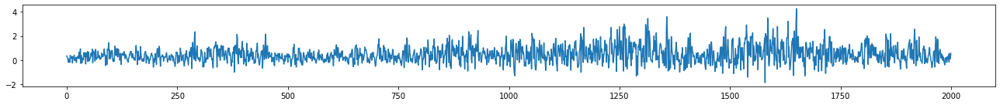

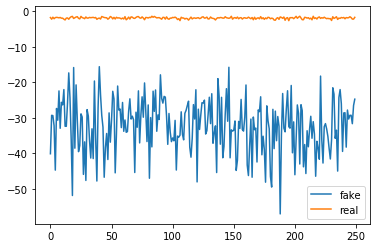

Epoch: 1 	 Discriminator Loss: [-19.682646, 0.0] 		 Generator Loss: 30.02899169921875
Epoch: 2 	 Discriminator Loss: [-17.282448, 0.0] 		 Generator Loss: 24.802770614624023
Epoch: 3 	 Discriminator Loss: [-14.556497, 0.0] 		 Generator Loss: 19.52773094177246
Epoch: 4 	 Discriminator Loss: [-13.795135, 0.0] 		 Generator Loss: 17.69737434387207
Epoch: 5 	 Discriminator Loss: [-13.6702385, 0.0] 		 Generator Loss: 15.58804988861084


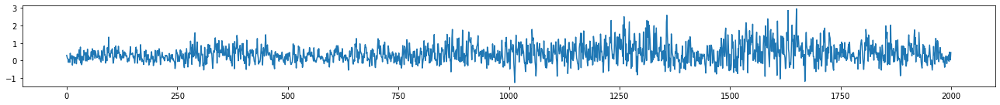

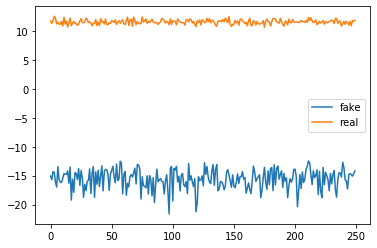

Epoch: 6 	 Discriminator Loss: [-13.955882, 0.0] 		 Generator Loss: 15.307577133178711
Epoch: 7 	 Discriminator Loss: [-13.42867, 0.0] 		 Generator Loss: 13.360095024108887
Epoch: 8 	 Discriminator Loss: [-13.018065, 0.0] 		 Generator Loss: 12.773613929748535
Epoch: 9 	 Discriminator Loss: [-12.071015, 0.0] 		 Generator Loss: 11.468896865844727
Epoch: 10 	 Discriminator Loss: [-11.018259, 0.0] 		 Generator Loss: 10.45675277709961


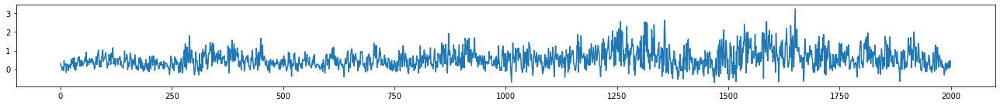

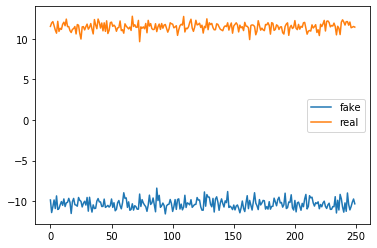

In [ ]:
def train_gan(epochs, batch_size, gen, disc, gan, train_ratio, disc_losses, gen_losses):
    clip_value = 0.1
    static_noise = np.random.normal(0, 1, size=(1, noise_dim))
    mini_batch_size = batch_size * train_ratio
    steps_per_epoch = len(db_train[:,0,0]) // batch_size
    valid = np.array([-1.]*batch_size)
    fake = np.array([1.]*batch_size)
    disc_labels = np.concatenate((valid, fake))
    for epoch in range(epochs):
            for ii in range(len(db_train[:,0,0]) // mini_batch_size):
                real_trajs = db_train[np.arange(ii*mini_batch_size, (ii+1)*mini_batch_size)]
                for jj in range(train_ratio):
                    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
                    fake_trajs = gen.predict(noise)
                    trajs = np.concatenate((real_trajs[jj*batch_size:(jj+1)*batch_size], fake_trajs))
                    disc_losses.append(disc.train_on_batch(trajs, disc_labels)) # training del discriminatore (gli dico quali sono vere e quali no)
                    # Clip critic weights
                    for l in disc.layers:
                        weights = l.get_weights()
                        weights = [np.clip(w, -clip_value, clip_value) for w in weights]
                        l.set_weights(weights)
                
                gen_labels = np.ones(batch_size)
                gen_losses.append(gan.train_on_batch(noise, valid)) # training del generatore (per imbrogliare il discrim.)
                
                print(f'Epoch:{epoch}, batch:{ii*train_ratio+jj}/{steps_per_epoch}', end="\r")
            print(f'Epoch: {epoch} \t Discriminator Loss: {disc_losses[-1]} \t\t Generator Loss: {gen_losses[-1]}')
            if epoch%5==0:
                plot_trajs(static_noise)
                plot_disc_predictions(disc, gen, batch_size, noise_dim, db_train)

batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=3, disc_losses=disc_losses, gen_losses=gen_losses)

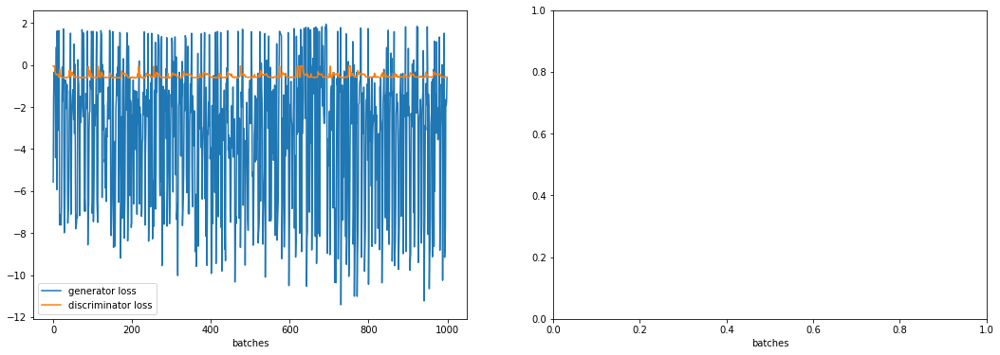

In [68]:
import matplotlib.pyplot as plt

train_ratio = 5
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(18,6))
ax1.plot(gen_losses[-1000:], label='generator loss')
ax1.plot([l[0] for l in disc_losses[-1000:]], label='discriminator loss')
ax1.set_xlabel('batches')
ax2.set_xlabel('batches')
ax1.legend()
plt.show()

Epoch: 0 	 Discriminator Loss: [-0.57274765, 0.486] 		 Generator Loss: -0.6180450320243835


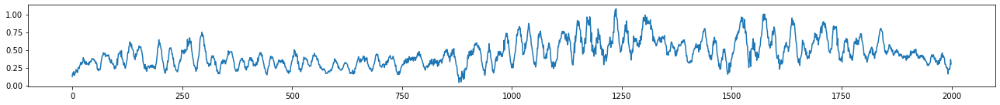

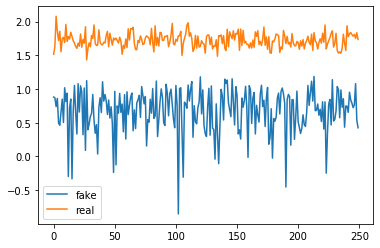

Epoch: 1 	 Discriminator Loss: [-0.3180589, 0.5] 		 Generator Loss: -4.040532112121582
Epoch: 2 	 Discriminator Loss: [-0.5707108, 0.5] 		 Generator Loss: -0.8552415370941162
Epoch: 3 	 Discriminator Loss: [-0.55952054, 0.47] 		 Generator Loss: -1.2522670030593872
Epoch: 4 	 Discriminator Loss: [-0.37604377, 0.5] 		 Generator Loss: -2.335515022277832
Epoch: 5 	 Discriminator Loss: [-0.564257, 0.5] 		 Generator Loss: -0.20305263996124268


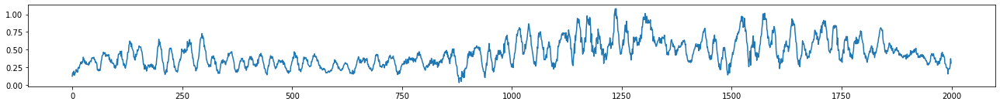

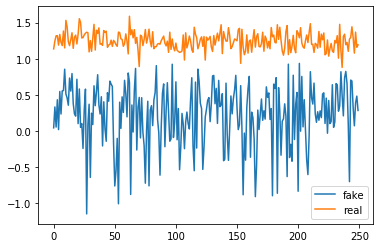

Epoch: 6 	 Discriminator Loss: [-0.6032528, 0.498] 		 Generator Loss: -0.875062108039856
Epoch: 7 	 Discriminator Loss: [-0.6625047, 0.078] 		 Generator Loss: -0.7806507349014282
Epoch: 8 	 Discriminator Loss: [-0.7201586, 0.25] 		 Generator Loss: -0.7037491202354431
Epoch: 9 	 Discriminator Loss: [-0.63837147, 0.5] 		 Generator Loss: 0.261196106672287
Epoch: 10 	 Discriminator Loss: [-0.8376659, 0.476] 		 Generator Loss: -0.5319008827209473


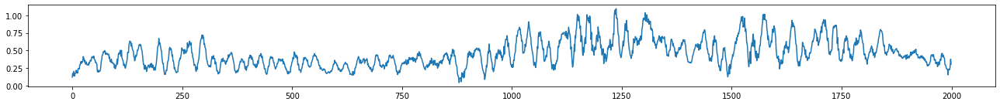

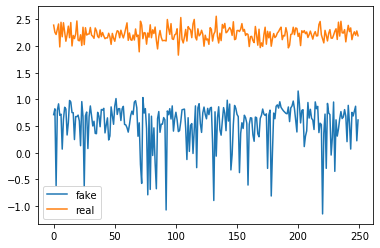

Epoch: 11 	 Discriminator Loss: [-0.8406034, 0.432] 		 Generator Loss: -0.5412701368331909
Epoch: 12 	 Discriminator Loss: [-0.85195017, 0.44] 		 Generator Loss: 0.08218026161193848
Epoch: 13 	 Discriminator Loss: [-0.8756323, 0.282] 		 Generator Loss: 0.10590676218271255
Epoch: 14 	 Discriminator Loss: [-0.83848107, 0.476] 		 Generator Loss: -0.9286088943481445
Epoch: 15 	 Discriminator Loss: [-0.8562221, 0.442] 		 Generator Loss: -0.6350931525230408


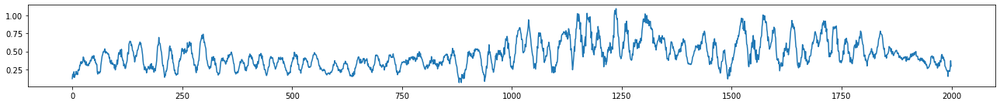

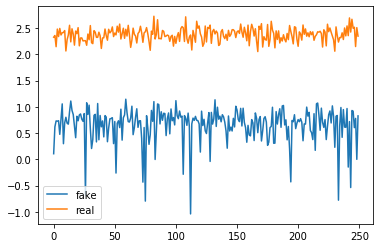

Epoch: 16 	 Discriminator Loss: [-0.60463303, 0.5] 		 Generator Loss: 0.11307846754789352
Epoch: 17 	 Discriminator Loss: [-0.3268994, 0.0] 		 Generator Loss: -5.232252597808838
Epoch: 18 	 Discriminator Loss: [-0.86734253, 0.296] 		 Generator Loss: -0.1665123701095581
Epoch: 19 	 Discriminator Loss: [-0.89228994, 0.106] 		 Generator Loss: -0.4754035770893097
Epoch: 20 	 Discriminator Loss: [-0.87823707, 0.0] 		 Generator Loss: -2.592559814453125


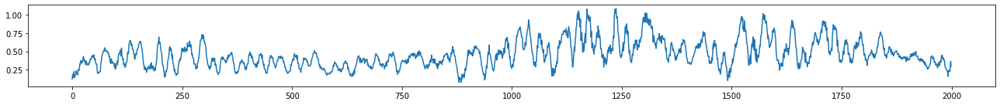

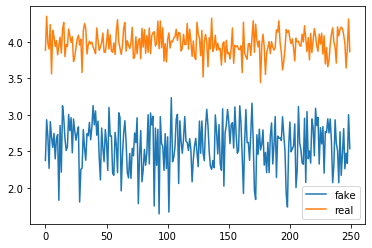

Epoch: 21 	 Discriminator Loss: [-0.5743108, 0.5] 		 Generator Loss: -3.1922359466552734
Epoch: 22 	 Discriminator Loss: [-0.82604045, 0.5] 		 Generator Loss: 0.2151135355234146
Epoch: 23 	 Discriminator Loss: [-0.8422937, 0.456] 		 Generator Loss: 0.10173383355140686
Epoch: 24 	 Discriminator Loss: [-0.82116175, 0.312] 		 Generator Loss: -0.9812564849853516
Epoch: 25 	 Discriminator Loss: [-0.78288084, 0.5] 		 Generator Loss: -1.1173065900802612


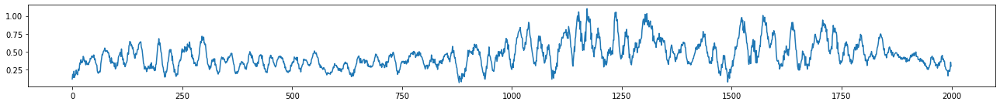

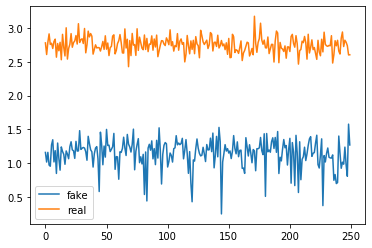

Epoch: 26 	 Discriminator Loss: [-0.7854223, 0.46] 		 Generator Loss: -1.6566768884658813
Epoch: 27 	 Discriminator Loss: [-0.78714734, 0.464] 		 Generator Loss: -0.7432576417922974
Epoch: 28 	 Discriminator Loss: [-0.7804818, 0.5] 		 Generator Loss: -0.18191193044185638
Epoch: 29 	 Discriminator Loss: [-0.7816718, 0.328] 		 Generator Loss: -0.9760748147964478
Epoch: 30 	 Discriminator Loss: [-0.7812955, 0.496] 		 Generator Loss: -0.8826191425323486


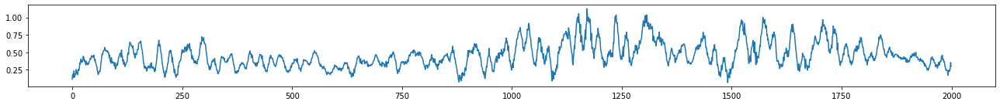

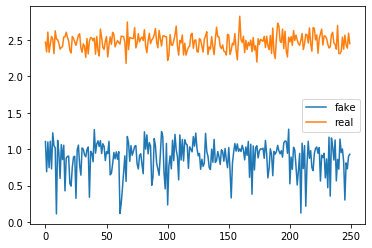

Epoch: 31 	 Discriminator Loss: [-0.77686083, 0.37] 		 Generator Loss: -1.687964916229248
Epoch: 32 	 Discriminator Loss: [-0.7859738, 0.49] 		 Generator Loss: -1.1300606727600098
Epoch: 33 	 Discriminator Loss: [-0.77436763, 0.5] 		 Generator Loss: -0.12610957026481628
Epoch: 34 	 Discriminator Loss: [-0.78284526, 0.236] 		 Generator Loss: -0.8559695482254028
Epoch: 35 	 Discriminator Loss: [-0.78942937, 0.424] 		 Generator Loss: -0.7620170712471008


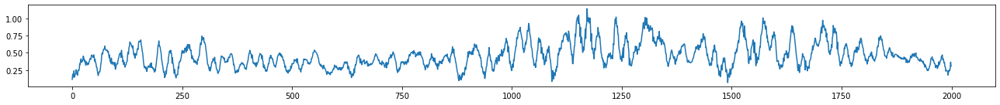

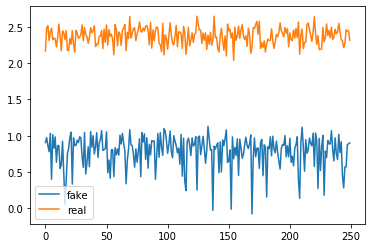

Epoch: 36 	 Discriminator Loss: [-0.80200315, 0.406] 		 Generator Loss: -0.6086583137512207
Epoch: 37 	 Discriminator Loss: [-0.80945486, 0.492] 		 Generator Loss: -0.4610513746738434
Epoch: 38 	 Discriminator Loss: [-0.29176548, 0.5] 		 Generator Loss: -5.476474761962891
Epoch: 39 	 Discriminator Loss: [-0.8031594, 0.428] 		 Generator Loss: -0.34894412755966187
Epoch: 40 	 Discriminator Loss: [-0.8211158, 0.414] 		 Generator Loss: -0.9696602821350098


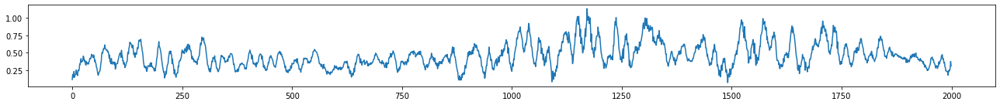

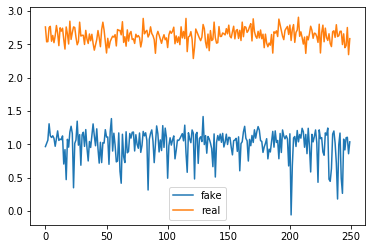

Epoch: 41 	 Discriminator Loss: [-0.79474676, 0.288] 		 Generator Loss: -1.0515434741973877
Epoch: 42 	 Discriminator Loss: [-0.79363924, 0.356] 		 Generator Loss: 0.0007227842579595745
Epoch: 43 	 Discriminator Loss: [-0.79284906, 0.386] 		 Generator Loss: -1.0070738792419434
Epoch: 44 	 Discriminator Loss: [-0.46460125, 0.5] 		 Generator Loss: -1.886716365814209
Epoch: 45 	 Discriminator Loss: [-0.7643211, 0.496] 		 Generator Loss: -1.0111024379730225


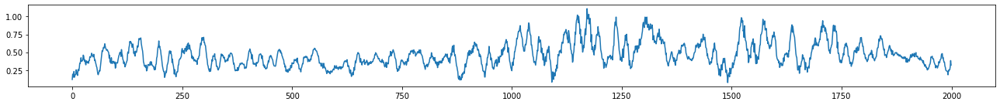

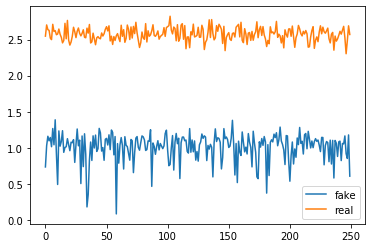

Epoch: 46 	 Discriminator Loss: [-0.6226691, 0.0] 		 Generator Loss: -5.5072126388549805
Epoch: 47 	 Discriminator Loss: [-0.6953832, 0.5] 		 Generator Loss: 0.16680990159511566
Epoch: 48 	 Discriminator Loss: [-0.7820987, 0.5] 		 Generator Loss: -0.3918534815311432
Epoch: 49 	 Discriminator Loss: [-0.79502237, 0.498] 		 Generator Loss: -0.7449522018432617
Epoch: 50 	 Discriminator Loss: [-0.7895019, 0.126] 		 Generator Loss: -1.6684801578521729


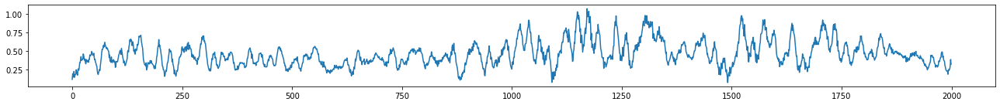

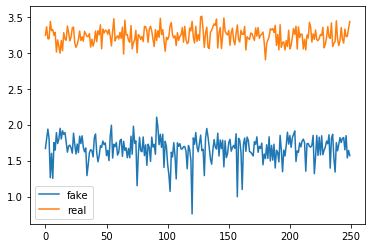

Epoch: 51 	 Discriminator Loss: [-0.8058153, 0.454] 		 Generator Loss: -0.782416582107544
Epoch: 52 	 Discriminator Loss: [-0.73837596, 0.5] 		 Generator Loss: 0.720822274684906
Epoch: 53 	 Discriminator Loss: [-0.78048676, 0.498] 		 Generator Loss: -0.9778687953948975
Epoch: 54 	 Discriminator Loss: [-0.5492462, 0.5] 		 Generator Loss: -2.195971727371216
Epoch: 55 	 Discriminator Loss: [-0.5600657, 0.0] 		 Generator Loss: -5.9846696853637695


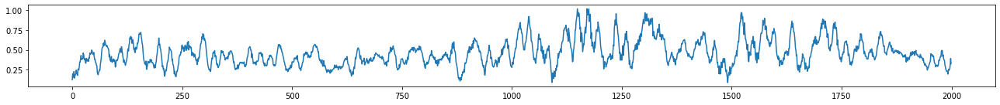

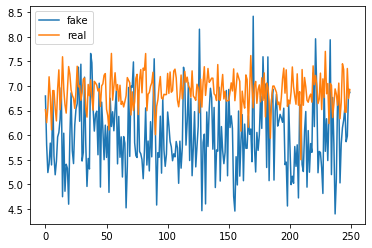

Epoch: 56 	 Discriminator Loss: [-0.58917123, 0.5] 		 Generator Loss: -2.7861719131469727
Epoch: 57 	 Discriminator Loss: [-0.7857369, 0.5] 		 Generator Loss: -0.13977432250976562
Epoch: 58 	 Discriminator Loss: [-0.7848976, 0.496] 		 Generator Loss: -0.8182793855667114
Epoch: 59 	 Discriminator Loss: [-0.23277, 0.0] 		 Generator Loss: -6.15869665145874
Epoch: 60 	 Discriminator Loss: [-0.80064696, 0.28] 		 Generator Loss: -0.9873359203338623


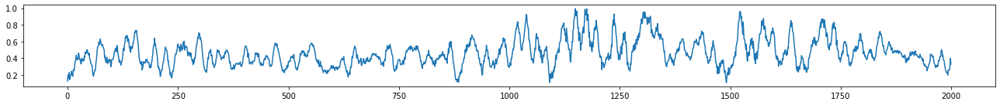

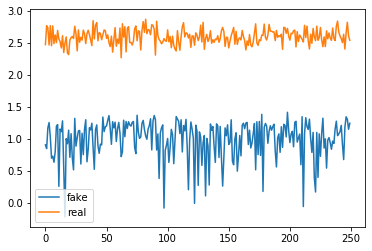

Epoch: 61 	 Discriminator Loss: [-0.55836993, 0.5] 		 Generator Loss: -3.468181610107422
Epoch: 62 	 Discriminator Loss: [-0.7567352, 0.5] 		 Generator Loss: -1.2637783288955688
Epoch: 63 	 Discriminator Loss: [-0.4914144, 0.5] 		 Generator Loss: -3.6953604221343994
Epoch: 64 	 Discriminator Loss: [-0.7420203, 0.498] 		 Generator Loss: -1.2436909675598145
Epoch: 65 	 Discriminator Loss: [-0.7389253, 0.496] 		 Generator Loss: -0.5124359130859375


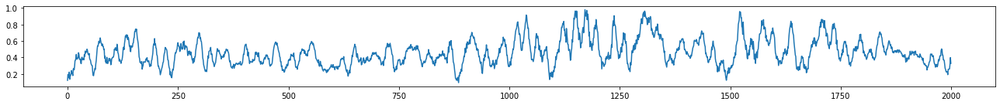

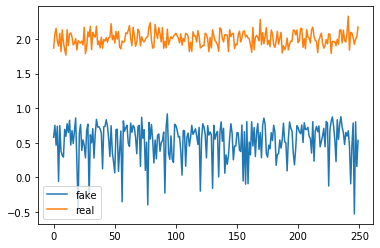

Epoch: 66 	 Discriminator Loss: [-0.4472483, 0.0] 		 Generator Loss: -6.299465179443359
Epoch: 67 	 Discriminator Loss: [-0.4489932, 0.5] 		 Generator Loss: -2.0291683673858643
Epoch: 68 	 Discriminator Loss: [-0.43039373, 0.0] 		 Generator Loss: -6.147010803222656
Epoch: 69 	 Discriminator Loss: [-0.7232489, 0.488] 		 Generator Loss: -0.6442492604255676
Epoch: 70 	 Discriminator Loss: [-0.35284925, 0.5] 		 Generator Loss: -4.074066638946533


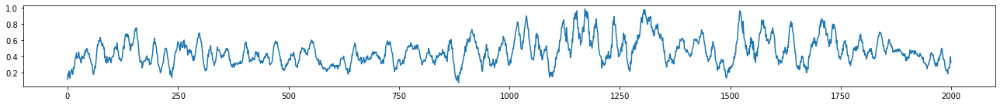

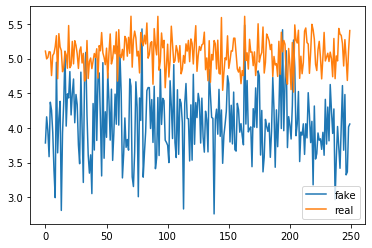

Epoch: 71 	 Discriminator Loss: [-0.62141126, 0.5] 		 Generator Loss: 0.676986575126648
Epoch: 72 	 Discriminator Loss: [-0.52502936, 0.5] 		 Generator Loss: -2.0232326984405518
Epoch: 73 	 Discriminator Loss: [-0.725781, 0.458] 		 Generator Loss: -0.7710951566696167
Epoch: 74 	 Discriminator Loss: [-0.5505373, 0.5] 		 Generator Loss: -0.7942213416099548
Epoch: 75 	 Discriminator Loss: [-0.4446997, 0.5] 		 Generator Loss: -3.6092772483825684


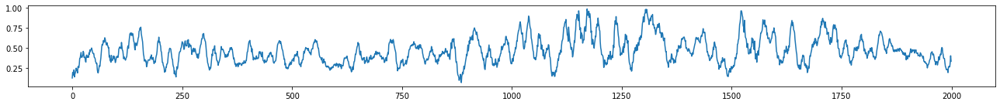

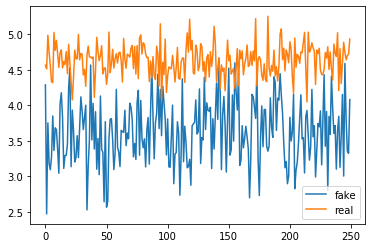

Epoch: 76 	 Discriminator Loss: [-0.7181557, 0.462] 		 Generator Loss: -0.6277828216552734
Epoch: 77 	 Discriminator Loss: [-0.7279058, 0.454] 		 Generator Loss: -0.5388381481170654
Epoch: 78 	 Discriminator Loss: [-0.69144017, 0.5] 		 Generator Loss: 0.7494584918022156
Epoch: 79 	 Discriminator Loss: [-0.7183271, 0.48] 		 Generator Loss: -0.06281066685914993
Epoch: 80 	 Discriminator Loss: [-0.7189031, 0.386] 		 Generator Loss: -0.8397392630577087


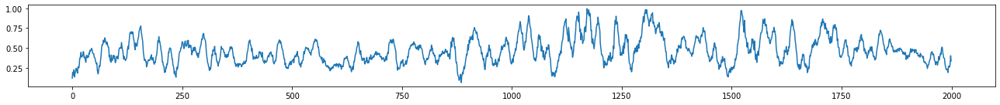

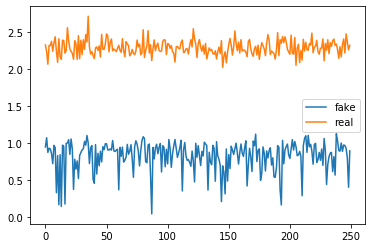

Epoch: 81 	 Discriminator Loss: [-0.7257111, 0.474] 		 Generator Loss: -0.7393820285797119
Epoch: 82 	 Discriminator Loss: [-0.697506, 0.5] 		 Generator Loss: 0.8670918941497803
Epoch: 83 	 Discriminator Loss: [-0.6496989, 0.5] 		 Generator Loss: 0.9302306771278381
Epoch: 84 	 Discriminator Loss: [-0.5874951, 0.0] 		 Generator Loss: -5.788745880126953
Epoch: 85 	 Discriminator Loss: [-0.4903891, 0.5] 		 Generator Loss: -3.3655405044555664


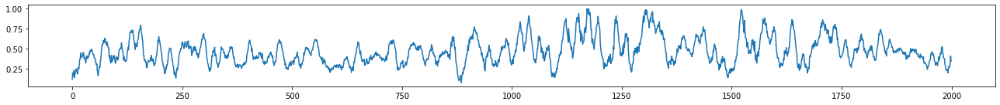

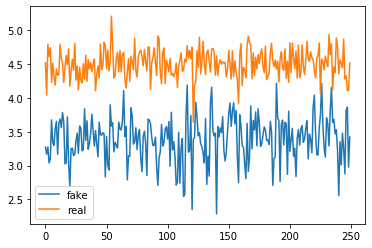

Epoch: 86 	 Discriminator Loss: [-0.68867856, 0.0] 		 Generator Loss: -3.515397310256958
Epoch: 87 	 Discriminator Loss: [-0.72158897, 0.5] 		 Generator Loss: -0.6245121359825134
Epoch: 88 	 Discriminator Loss: [-0.27019104, 0.5] 		 Generator Loss: -5.150717735290527
Epoch: 89 	 Discriminator Loss: [-0.75620204, 0.216] 		 Generator Loss: -0.5619221329689026
Epoch: 90 	 Discriminator Loss: [-0.5494207, 0.5] 		 Generator Loss: -0.8607437610626221


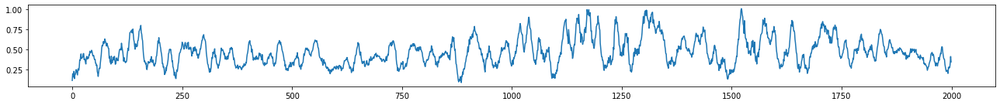

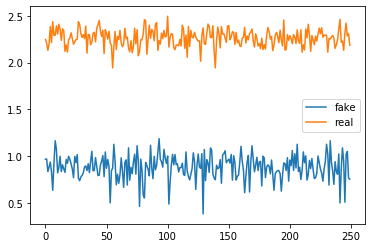

Epoch: 91 	 Discriminator Loss: [-0.7651283, 0.458] 		 Generator Loss: -1.2240302562713623
Epoch: 92 	 Discriminator Loss: [-0.3737188, 0.0] 		 Generator Loss: -6.450264930725098
Epoch: 93 	 Discriminator Loss: [-0.7652756, 0.412] 		 Generator Loss: -1.0940828323364258
Epoch: 94 	 Discriminator Loss: [-0.7340277, 0.498] 		 Generator Loss: -0.3755199909210205
Epoch: 95 	 Discriminator Loss: [-0.4962183, 0.5] 		 Generator Loss: -4.1521806716918945


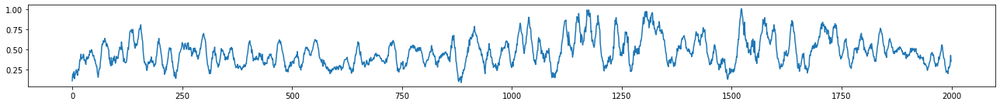

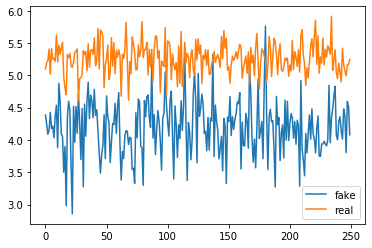

Epoch: 96 	 Discriminator Loss: [-0.7233573, 0.5] 		 Generator Loss: -0.42428383231163025
Epoch: 97 	 Discriminator Loss: [-0.73199135, 0.498] 		 Generator Loss: -0.5146867632865906
Epoch: 98 	 Discriminator Loss: [-0.69512606, 0.5] 		 Generator Loss: -1.2379131317138672
Epoch: 99 	 Discriminator Loss: [-0.512061, 0.5] 		 Generator Loss: -3.599138021469116
Epoch: 100 	 Discriminator Loss: [-0.69367164, 0.49] 		 Generator Loss: -0.4265381097793579


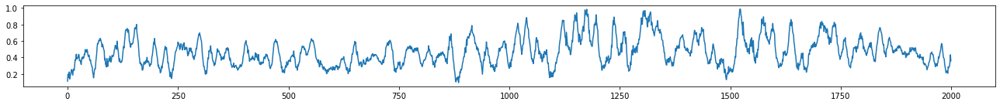

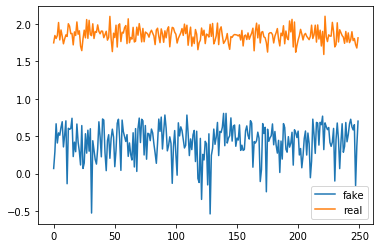

Epoch: 101 	 Discriminator Loss: [-0.703191, 0.04] 		 Generator Loss: -3.648245096206665
Epoch: 102 	 Discriminator Loss: [-0.69151235, 0.5] 		 Generator Loss: -0.883052408695221
Epoch: 103 	 Discriminator Loss: [-0.43002573, 0.5] 		 Generator Loss: -3.781257152557373
Epoch: 104 	 Discriminator Loss: [-0.68227893, 0.184] 		 Generator Loss: -2.7760307788848877
Epoch: 105 	 Discriminator Loss: [-0.70471334, 0.386] 		 Generator Loss: -1.5258249044418335


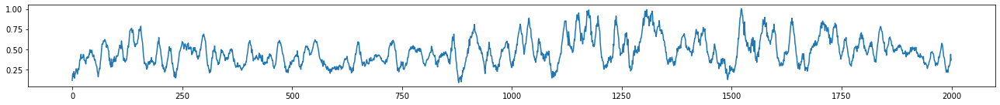

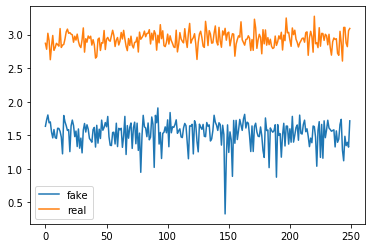

Epoch: 106 	 Discriminator Loss: [-0.6817584, 0.5] 		 Generator Loss: 0.3140670955181122
Epoch: 107 	 Discriminator Loss: [-0.50911325, 0.5] 		 Generator Loss: -1.2950745820999146
Epoch: 108 	 Discriminator Loss: [-0.7141044, 0.228] 		 Generator Loss: -1.40769362449646
Epoch: 109 	 Discriminator Loss: [-0.24304922, 0.0] 		 Generator Loss: -6.442147731781006
Epoch: 110 	 Discriminator Loss: [-0.68737686, 0.5] 		 Generator Loss: -0.7236732244491577


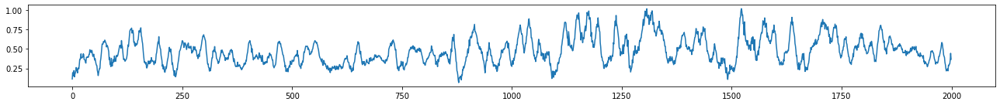

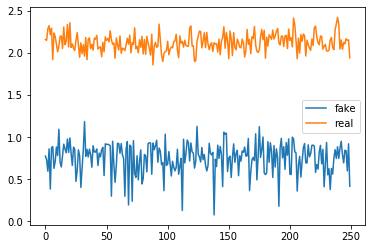

Epoch: 111 	 Discriminator Loss: [-0.6797868, 0.5] 		 Generator Loss: -1.410732388496399
Epoch: 112 	 Discriminator Loss: [-0.5327529, 0.5] 		 Generator Loss: -0.8221210837364197
Epoch: 113 	 Discriminator Loss: [-0.4627021, 0.5] 		 Generator Loss: -3.5386242866516113
Epoch: 114 	 Discriminator Loss: [-0.07939479, 0.0] 		 Generator Loss: -4.81614351272583
Epoch: 115 	 Discriminator Loss: [-0.6935842, 0.436] 		 Generator Loss: -0.05041317269206047


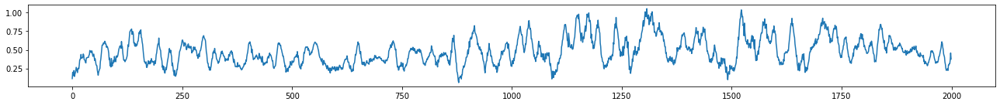

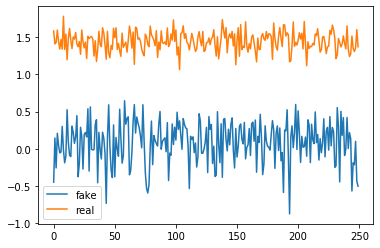

Epoch: 116 	 Discriminator Loss: [-0.5888273, 0.5] 		 Generator Loss: 0.9466328024864197
Epoch: 117 	 Discriminator Loss: [-0.7043847, 0.402] 		 Generator Loss: -0.32590267062187195
Epoch: 118 	 Discriminator Loss: [-0.6895167, 0.19] 		 Generator Loss: -0.8930486440658569
Epoch: 119 	 Discriminator Loss: [-0.68115336, 0.5] 		 Generator Loss: -0.20783008635044098
Epoch: 120 	 Discriminator Loss: [-0.60966027, 0.5] 		 Generator Loss: -1.784166693687439


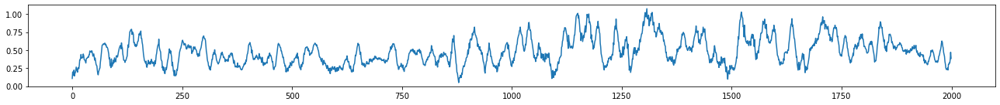

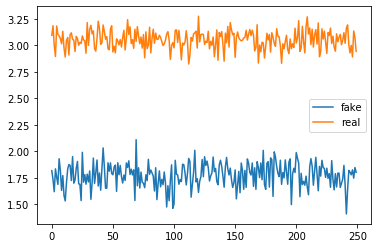

Epoch: 121 	 Discriminator Loss: [-0.6497401, 0.43] 		 Generator Loss: -0.7102289795875549
Epoch: 122 	 Discriminator Loss: [-0.6519445, 0.312] 		 Generator Loss: -0.638072669506073
Epoch: 123 	 Discriminator Loss: [-0.6196228, 0.27] 		 Generator Loss: -0.8832754492759705
Epoch: 124 	 Discriminator Loss: [-0.6227155, 0.5] 		 Generator Loss: -0.0016165304696187377
Epoch: 125 	 Discriminator Loss: [-0.64052796, 0.5] 		 Generator Loss: -0.9895281791687012


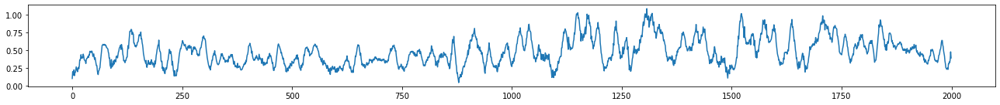

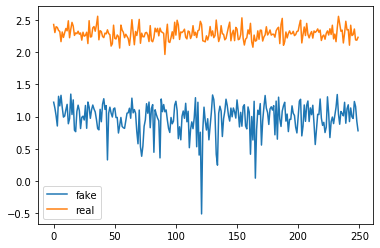

Epoch: 126 	 Discriminator Loss: [-0.540325, 0.5] 		 Generator Loss: 0.12096264958381653
Epoch: 127 	 Discriminator Loss: [-0.4675039, 0.5] 		 Generator Loss: -3.603748083114624
Epoch: 128 	 Discriminator Loss: [-0.64623797, 0.5] 		 Generator Loss: -0.3018434941768646
Epoch: 129 	 Discriminator Loss: [-0.67302024, 0.346] 		 Generator Loss: -1.8503254652023315
Epoch: 130 	 Discriminator Loss: [-0.68911695, 0.452] 		 Generator Loss: -0.2093053013086319


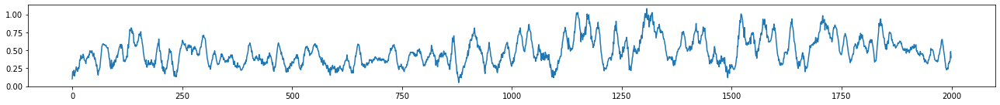

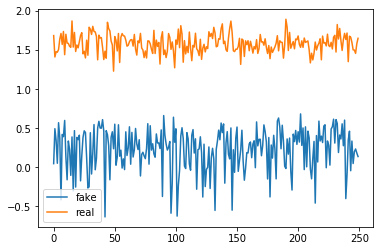

Epoch: 131 	 Discriminator Loss: [-0.57546824, 0.5] 		 Generator Loss: -0.3342147469520569
Epoch: 132 	 Discriminator Loss: [-0.439214, 0.5] 		 Generator Loss: -3.9237661361694336
Epoch: 133 	 Discriminator Loss: [-0.5431152, 0.5] 		 Generator Loss: -1.3791948556900024
Epoch: 134 	 Discriminator Loss: [-0.72207123, 0.18] 		 Generator Loss: -1.3375486135482788
Epoch: 135 	 Discriminator Loss: [-0.62947667, 0.5] 		 Generator Loss: 0.8147835731506348


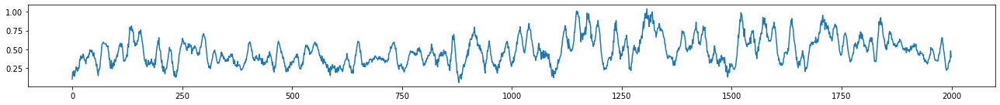

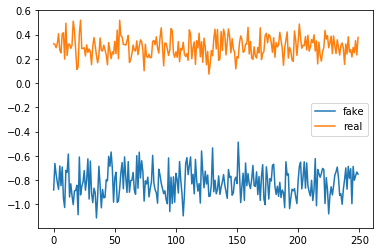

Epoch: 136 	 Discriminator Loss: [-0.63930565, 0.5] 		 Generator Loss: 0.7051478028297424
Epoch: 137 	 Discriminator Loss: [-0.71864414, 0.352] 		 Generator Loss: -0.9339842200279236
Epoch: 138 	 Discriminator Loss: [-0.67474693, 0.5] 		 Generator Loss: 0.910264790058136
Epoch: 139 	 Discriminator Loss: [-0.7143719, 0.494] 		 Generator Loss: -0.5040785670280457
Epoch: 140 	 Discriminator Loss: [-0.5537451, 0.5] 		 Generator Loss: -0.509688138961792


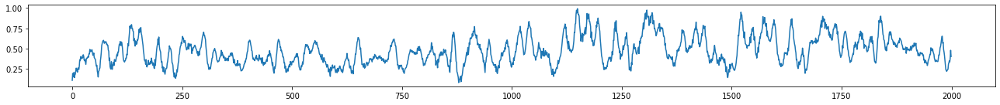

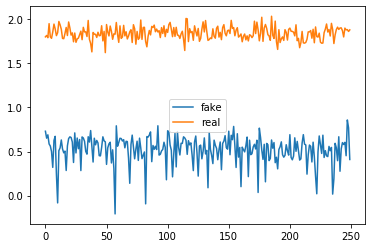

Epoch: 141 	 Discriminator Loss: [-0.65486455, 0.5] 		 Generator Loss: -1.397768497467041
Epoch: 142 	 Discriminator Loss: [-0.71598786, 0.488] 		 Generator Loss: -0.6946736574172974
Epoch: 143 	 Discriminator Loss: [-0.6714783, 0.402] 		 Generator Loss: -1.4642853736877441
Epoch: 144 	 Discriminator Loss: [-0.66647047, 0.5] 		 Generator Loss: -0.6888983249664307
Epoch: 145 	 Discriminator Loss: [-0.41507822, 0.5] 		 Generator Loss: -3.3013815879821777


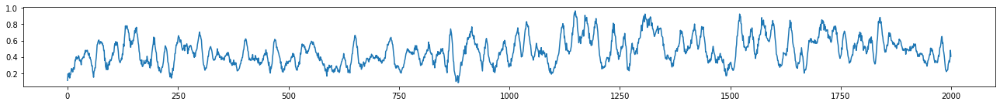

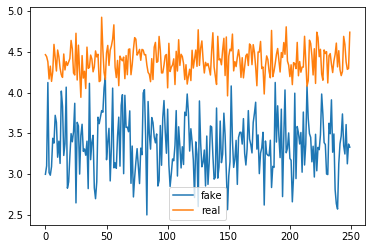

Epoch: 146 	 Discriminator Loss: [-0.662137, 0.402] 		 Generator Loss: -1.889478325843811
Epoch: 147 	 Discriminator Loss: [-0.6473618, 0.5] 		 Generator Loss: -1.242294430732727
Epoch: 148 	 Discriminator Loss: [-0.6406662, 0.5] 		 Generator Loss: -0.9112933278083801
Epoch: 149 	 Discriminator Loss: [-0.64184844, 0.5] 		 Generator Loss: -0.5174208283424377
Epoch: 150 	 Discriminator Loss: [-0.65504944, 0.314] 		 Generator Loss: -1.6211477518081665


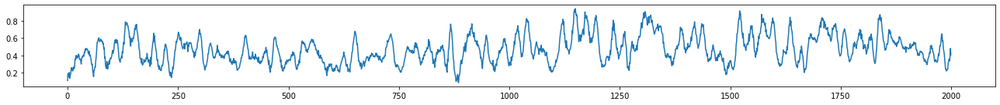

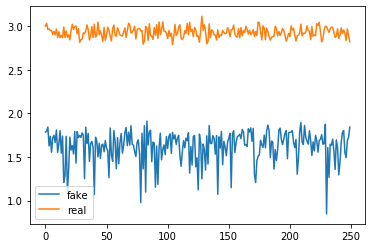

Epoch: 151 	 Discriminator Loss: [-0.6172007, 0.5] 		 Generator Loss: -1.2305113077163696
Epoch: 152 	 Discriminator Loss: [-0.65119946, 0.362] 		 Generator Loss: -1.492108941078186
Epoch: 153 	 Discriminator Loss: [-0.4673491, 0.5] 		 Generator Loss: -2.6451408863067627
Epoch: 154 	 Discriminator Loss: [-0.61308575, 0.052] 		 Generator Loss: -2.960651159286499
Epoch: 155 	 Discriminator Loss: [-0.58900416, 0.5] 		 Generator Loss: -1.99724543094635


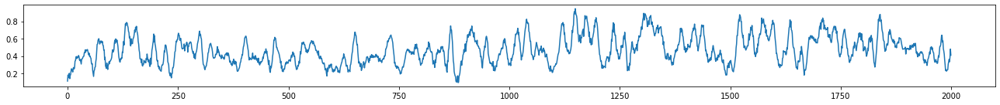

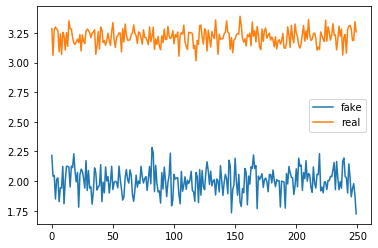

Epoch: 156 	 Discriminator Loss: [-0.52747774, 0.0] 		 Generator Loss: -5.5545654296875
Epoch: 157 	 Discriminator Loss: [-0.6178216, 0.5] 		 Generator Loss: 0.5757313966751099
Epoch: 158 	 Discriminator Loss: [-0.63645095, 0.5] 		 Generator Loss: -2.166686534881592
Epoch: 159 	 Discriminator Loss: [-0.6138342, 0.5] 		 Generator Loss: -1.9170687198638916
Epoch: 160 	 Discriminator Loss: [-0.64667773, 0.5] 		 Generator Loss: -0.933937132358551


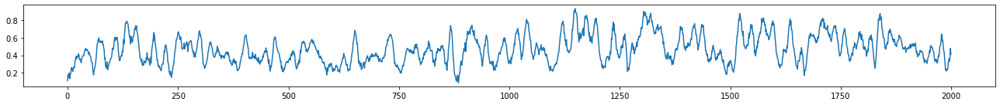

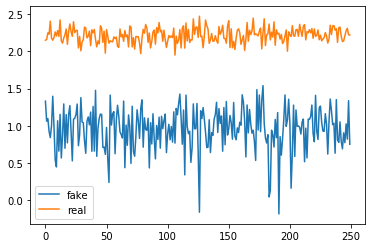

Epoch: 161 	 Discriminator Loss: [-0.60085124, 0.5] 		 Generator Loss: -1.907745122909546
Epoch: 162 	 Discriminator Loss: [-0.623856, 0.5] 		 Generator Loss: 0.878416121006012
Epoch: 163 	 Discriminator Loss: [-0.5600817, 0.006] 		 Generator Loss: -1.7274192571640015
Epoch: 164 	 Discriminator Loss: [-0.29053235, 0.5] 		 Generator Loss: -4.961129188537598
Epoch: 165 	 Discriminator Loss: [-0.64510036, 0.5] 		 Generator Loss: -1.0457154512405396


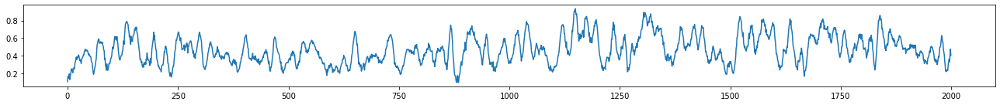

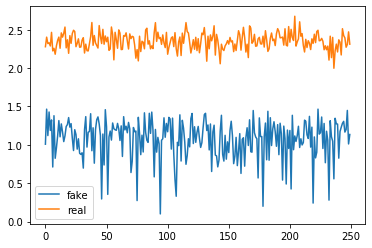

Epoch: 166 	 Discriminator Loss: [-0.6561743, 0.5] 		 Generator Loss: -0.6831780672073364
Epoch: 167 	 Discriminator Loss: [-0.6986556, 0.5] 		 Generator Loss: -1.0310665369033813
Epoch: 168 	 Discriminator Loss: [-0.71493554, 0.5] 		 Generator Loss: -0.9871317148208618
Epoch: 169 	 Discriminator Loss: [-0.43851, 0.5] 		 Generator Loss: -1.9405090808868408
Epoch: 170 	 Discriminator Loss: [-0.3599082, 0.5] 		 Generator Loss: -3.5233466625213623


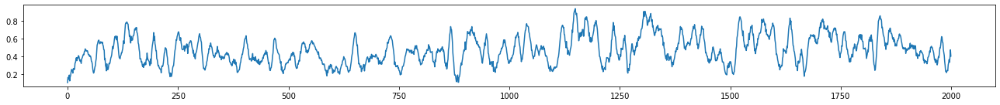

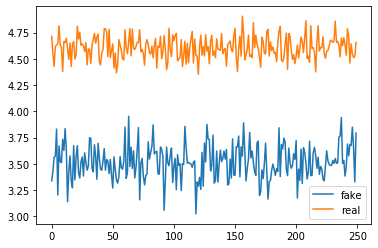

Epoch: 171 	 Discriminator Loss: [-0.6822705, 0.5] 		 Generator Loss: 0.09448099881410599
Epoch: 172 	 Discriminator Loss: [-0.43128306, 0.5] 		 Generator Loss: -2.680668830871582
Epoch: 173 	 Discriminator Loss: [-0.6524025, 0.036] 		 Generator Loss: -2.288479804992676
Epoch: 174 	 Discriminator Loss: [-0.45877528, 0.5] 		 Generator Loss: -0.27552515268325806
Epoch: 175 	 Discriminator Loss: [-0.67541486, 0.5] 		 Generator Loss: -2.253697395324707


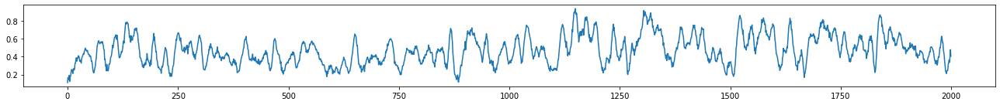

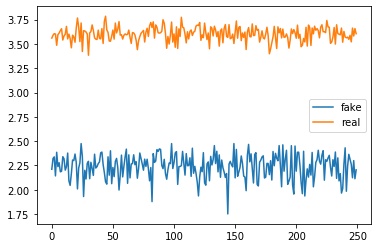

Epoch: 176 	 Discriminator Loss: [-0.65039104, 0.5] 		 Generator Loss: -2.6347973346710205
Epoch: 177 	 Discriminator Loss: [-0.64285415, 0.5] 		 Generator Loss: 0.8015300631523132
Epoch: 178 	 Discriminator Loss: [-0.65596396, 0.5] 		 Generator Loss: -1.0991891622543335
Epoch: 179 	 Discriminator Loss: [-0.64295304, 0.5] 		 Generator Loss: -1.5760891437530518
Epoch: 180 	 Discriminator Loss: [-0.571665, 0.008] 		 Generator Loss: -1.25974702835083


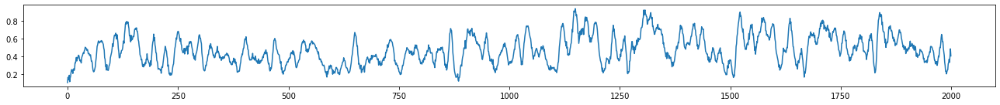

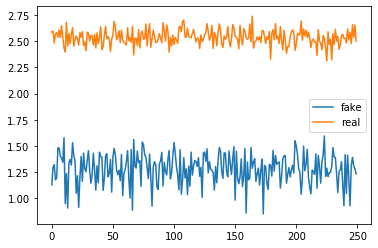

Epoch: 181 	 Discriminator Loss: [-0.6257463, 0.5] 		 Generator Loss: 0.2209576666355133
Epoch: 182 	 Discriminator Loss: [-0.35531974, 0.5] 		 Generator Loss: -3.7420620918273926
Epoch: 183 	 Discriminator Loss: [-0.5903385, 0.0] 		 Generator Loss: -3.608823537826538
Epoch: 184 	 Discriminator Loss: [-0.66917163, 0.484] 		 Generator Loss: -1.3205488920211792
Epoch: 185 	 Discriminator Loss: [-0.60920995, 0.498] 		 Generator Loss: -1.7168307304382324


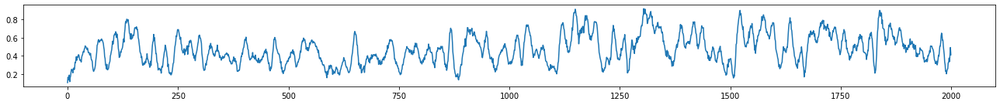

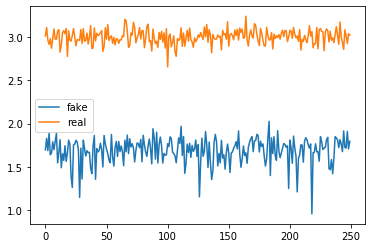

Epoch: 186 	 Discriminator Loss: [-0.6621082, 0.498] 		 Generator Loss: -1.0317795276641846
Epoch: 187 	 Discriminator Loss: [-0.665501, 0.5] 		 Generator Loss: -1.3552656173706055
Epoch: 188 	 Discriminator Loss: [-0.6352942, 0.498] 		 Generator Loss: -2.2751028537750244
Epoch: 189 	 Discriminator Loss: [-0.58718455, 0.0] 		 Generator Loss: -2.5048511028289795
Epoch: 190 	 Discriminator Loss: [-0.60100436, 0.0] 		 Generator Loss: -1.9281606674194336


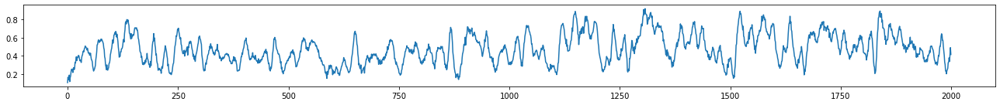

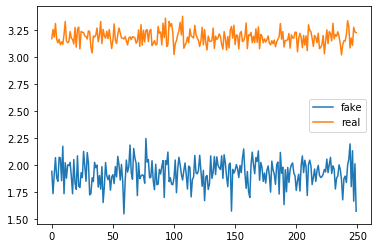

Epoch: 191 	 Discriminator Loss: [-0.2565972, 0.5] 		 Generator Loss: -5.173813343048096
Epoch: 192 	 Discriminator Loss: [-0.61846447, 0.5] 		 Generator Loss: -0.060482367873191833
Epoch: 193 	 Discriminator Loss: [-0.6343047, 0.5] 		 Generator Loss: -1.1891461610794067
Epoch: 194 	 Discriminator Loss: [-0.6066747, 0.5] 		 Generator Loss: -2.217299222946167
Epoch: 195 	 Discriminator Loss: [-0.6240577, 0.5] 		 Generator Loss: -0.7165509462356567


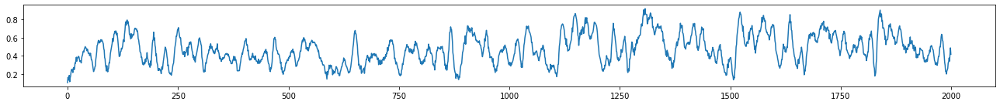

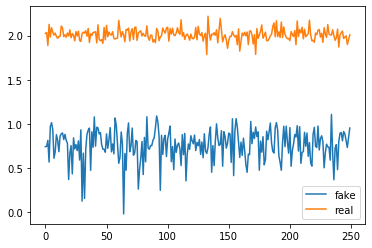

Epoch: 196 	 Discriminator Loss: [-0.20562801, 0.5] 		 Generator Loss: -5.431875705718994
Epoch: 197 	 Discriminator Loss: [-0.6289423, 0.5] 		 Generator Loss: -1.1854634284973145
Epoch: 198 	 Discriminator Loss: [-0.62047607, 0.468] 		 Generator Loss: -0.8177710175514221
Epoch: 199 	 Discriminator Loss: [-0.62564796, 0.498] 		 Generator Loss: -0.8828096985816956


In [58]:
batch_size = 250
train_gan(epochs=200, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=5, disc_losses=disc_losses, gen_losses=gen_losses)

Epoch: 0 	 Discriminator Loss: [-0.5832035, 0.124] 		 Generator Loss: -0.3457850515842438


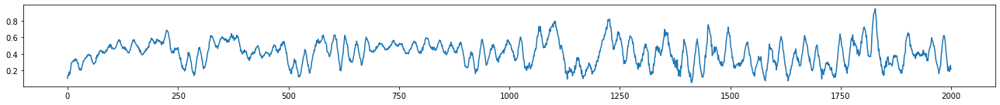

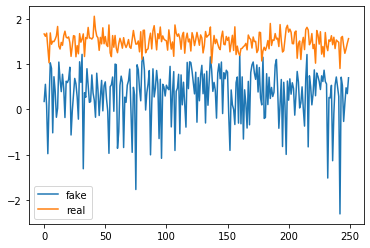

Epoch: 1 	 Discriminator Loss: [-0.55662847, 0.5] 		 Generator Loss: -2.8411757946014404
Epoch: 2 	 Discriminator Loss: [-0.5689289, 0.186] 		 Generator Loss: -0.17864078283309937
Epoch: 3 	 Discriminator Loss: [-0.42217532, 0.5] 		 Generator Loss: -4.746420860290527
Epoch: 4 	 Discriminator Loss: [-0.5063986, 0.0] 		 Generator Loss: -9.07001781463623
Epoch: 5 	 Discriminator Loss: [-0.40196282, 0.5] 		 Generator Loss: -8.822793960571289


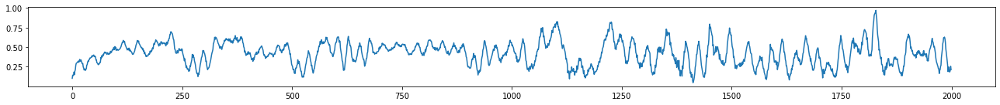

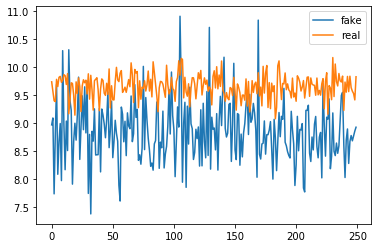

Epoch: 6 	 Discriminator Loss: [-0.526036, 0.5] 		 Generator Loss: -2.486797571182251
Epoch: 7 	 Discriminator Loss: [-0.5351039, 0.5] 		 Generator Loss: -1.4662261009216309
Epoch: 8 	 Discriminator Loss: [-0.52807975, 0.5] 		 Generator Loss: -1.9116772413253784
Epoch: 9 	 Discriminator Loss: [-0.5084536, 0.0] 		 Generator Loss: -5.908480644226074
Epoch: 10 	 Discriminator Loss: [-0.53755987, 0.39] 		 Generator Loss: -1.0764676332473755


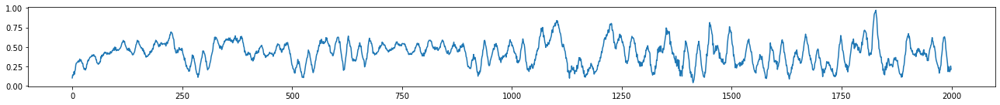

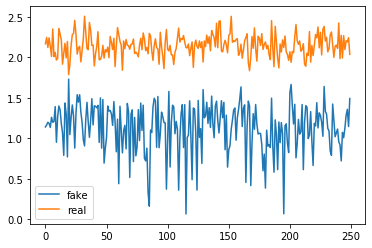

Epoch: 11 	 Discriminator Loss: [-0.5316138, 0.392] 		 Generator Loss: -0.3609561026096344
Epoch: 12 	 Discriminator Loss: [-0.49657384, 0.0] 		 Generator Loss: -6.808849334716797
Epoch: 13 	 Discriminator Loss: [-0.5432534, 0.362] 		 Generator Loss: 0.04379865154623985
Epoch: 14 	 Discriminator Loss: [-0.28976843, 0.5] 		 Generator Loss: -10.759331703186035
Epoch: 15 	 Discriminator Loss: [-0.4969604, 0.0] 		 Generator Loss: -1.5379724502563477


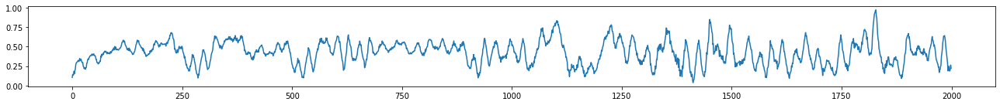

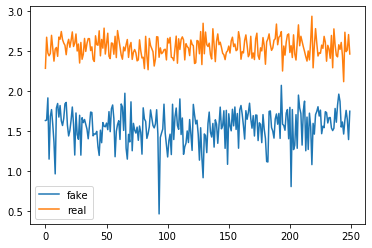

Epoch: 16 	 Discriminator Loss: [-0.5008905, 0.5] 		 Generator Loss: -1.6155232191085815
Epoch: 17 	 Discriminator Loss: [-0.5209305, 0.5] 		 Generator Loss: -0.10084456950426102
Epoch: 18 	 Discriminator Loss: [-0.5123475, 0.0] 		 Generator Loss: -5.69320821762085
Epoch: 19 	 Discriminator Loss: [-0.46539474, 0.5] 		 Generator Loss: -2.6067588329315186
Epoch: 20 	 Discriminator Loss: [-0.30492276, 0.0] 		 Generator Loss: -11.172457695007324


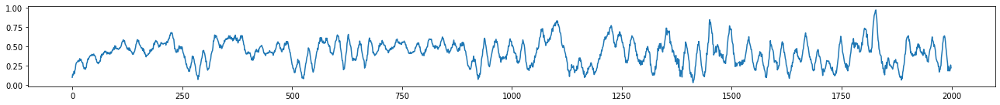

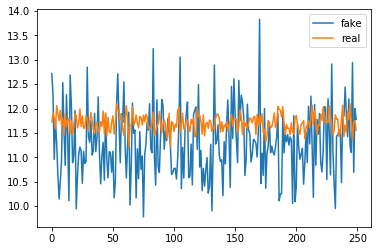

Epoch: 21 	 Discriminator Loss: [-0.4740384, 0.494] 		 Generator Loss: -2.2533159255981445
Epoch: 22 	 Discriminator Loss: [-0.4981629, 0.0] 		 Generator Loss: -1.5894355773925781
Epoch: 23 	 Discriminator Loss: [-0.497024, 0.5] 		 Generator Loss: -2.805220603942871
Epoch: 24 	 Discriminator Loss: [-0.49136788, 0.5] 		 Generator Loss: -1.3204858303070068
Epoch: 25 	 Discriminator Loss: [-0.047172617, 0.0] 		 Generator Loss: 1.8887003660202026


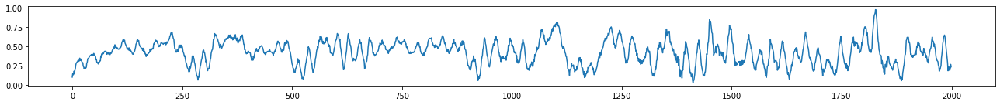

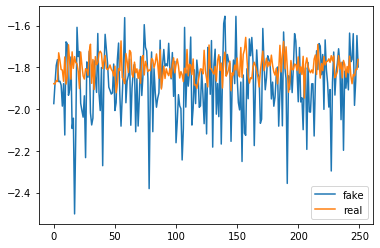

Epoch: 26 	 Discriminator Loss: [-0.39399958, 0.0] 		 Generator Loss: -10.581131935119629
Epoch: 27 	 Discriminator Loss: [-0.4996345, 0.5] 		 Generator Loss: 1.6537832021713257
Epoch: 28 	 Discriminator Loss: [-0.44302917, 0.5] 		 Generator Loss: 1.3396453857421875
Epoch: 29 	 Discriminator Loss: [-0.558676, 0.46] 		 Generator Loss: -0.9712798595428467
Epoch: 30 	 Discriminator Loss: [-0.58734435, 0.0] 		 Generator Loss: -4.694805145263672


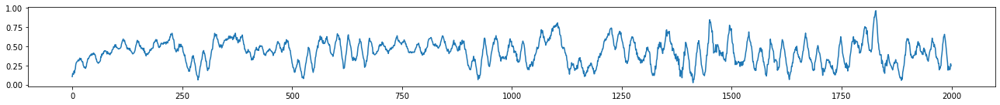

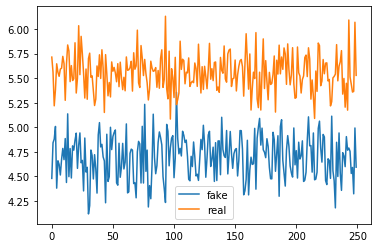

Epoch: 31 	 Discriminator Loss: [-0.3181, 0.0] 		 Generator Loss: -5.885619163513184
Epoch: 32 	 Discriminator Loss: [-0.64890724, 0.338] 		 Generator Loss: -0.7164586782455444
Epoch: 33 	 Discriminator Loss: [-0.62947315, 0.034] 		 Generator Loss: -0.8935448527336121
Epoch: 34 	 Discriminator Loss: [-0.64997965, 0.108] 		 Generator Loss: -0.4481261968612671
Epoch: 35 	 Discriminator Loss: [-0.6002859, 0.5] 		 Generator Loss: 0.03548387438058853


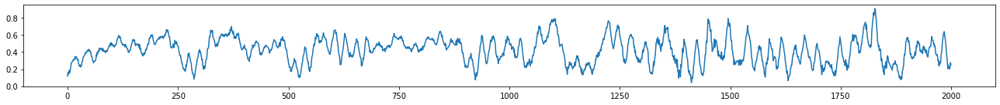

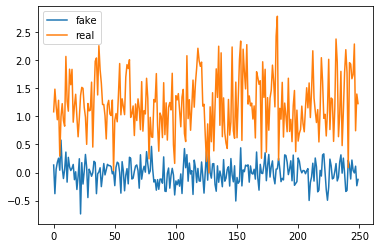

Epoch: 36 	 Discriminator Loss: [-0.70149505, 0.498] 		 Generator Loss: -1.2183879613876343
Epoch: 37 	 Discriminator Loss: [-0.655432, 0.366] 		 Generator Loss: -0.4687974750995636
Epoch: 38 	 Discriminator Loss: [-0.6115248, 0.168] 		 Generator Loss: -0.4913584589958191
Epoch: 39 	 Discriminator Loss: [-0.57711405, 0.074] 		 Generator Loss: -0.39268389344215393
Epoch: 40 	 Discriminator Loss: [-0.5368037, 0.124] 		 Generator Loss: -0.40988144278526306


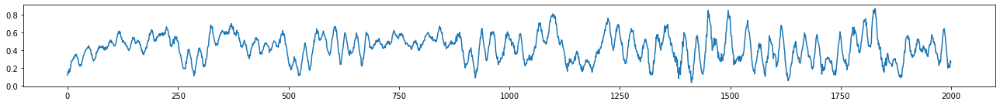

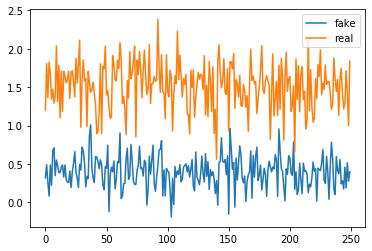

Epoch: 41 	 Discriminator Loss: [-0.5050582, 0.152] 		 Generator Loss: -0.4239904582500458
Epoch: 42 	 Discriminator Loss: [-0.35395136, 0.5] 		 Generator Loss: -2.711841583251953
Epoch: 43 	 Discriminator Loss: [-0.3484749, 0.5] 		 Generator Loss: -0.05740676075220108
Epoch: 44 	 Discriminator Loss: [-0.41155672, 0.11] 		 Generator Loss: -0.20143185555934906
Epoch: 45 	 Discriminator Loss: [-0.38225254, 0.486] 		 Generator Loss: -0.4999156594276428


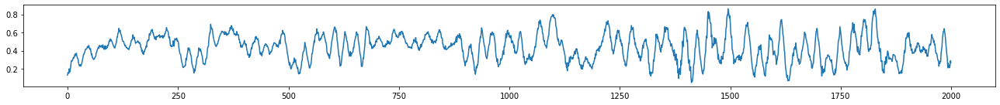

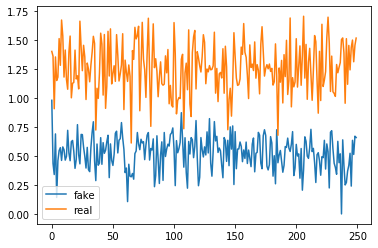

Epoch: 46 	 Discriminator Loss: [-0.28995445, 0.5] 		 Generator Loss: -2.151916742324829
Epoch: 47 	 Discriminator Loss: [-0.28428292, 0.5] 		 Generator Loss: -2.5540761947631836
Epoch: 48 	 Discriminator Loss: [-0.371672, 0.474] 		 Generator Loss: -0.3567492365837097
Epoch: 49 	 Discriminator Loss: [-0.33427683, 0.5] 		 Generator Loss: -0.12099052965641022
Epoch: 50 	 Discriminator Loss: [-0.08877901, 0.0] 		 Generator Loss: -3.4455080032348633


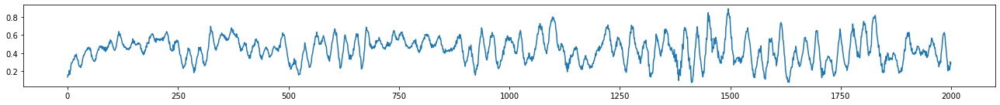

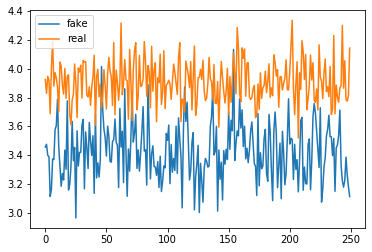

Epoch: 51 	 Discriminator Loss: [-0.33073688, 0.498] 		 Generator Loss: -1.0345765352249146
Epoch: 52 	 Discriminator Loss: [-0.24113396, 0.5] 		 Generator Loss: -3.146862506866455
Epoch: 53 	 Discriminator Loss: [-0.18492962, 0.5] 		 Generator Loss: -4.381627559661865
Epoch: 54 	 Discriminator Loss: [-0.20233402, 0.5] 		 Generator Loss: -3.3300113677978516
Epoch: 55 	 Discriminator Loss: [-0.21725467, 0.5] 		 Generator Loss: -3.8006885051727295


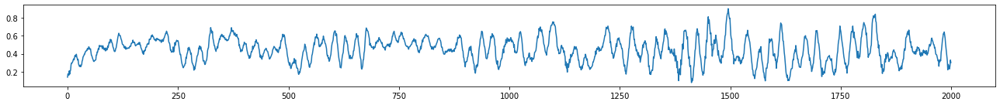

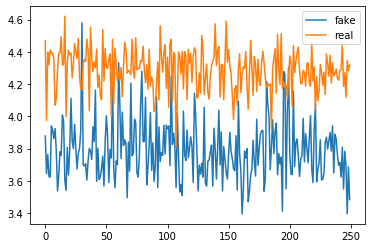

Epoch: 56 	 Discriminator Loss: [-0.3618709, 0.27] 		 Generator Loss: -0.26686495542526245
Epoch: 57 	 Discriminator Loss: [-0.31639487, 0.5] 		 Generator Loss: -3.497677803039551
Epoch: 58 	 Discriminator Loss: [-0.3219033, 0.5] 		 Generator Loss: -3.6645238399505615
Epoch: 59 	 Discriminator Loss: [-0.34372106, 0.5] 		 Generator Loss: -2.908050775527954
Epoch: 60 	 Discriminator Loss: [-0.46739435, 0.394] 		 Generator Loss: -1.1680407524108887


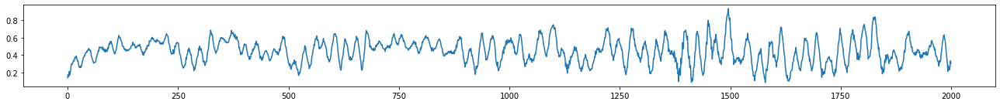

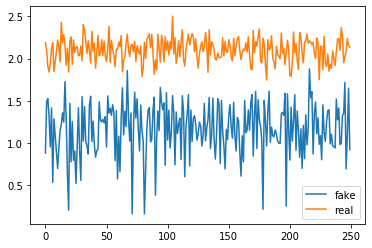

Epoch: 61 	 Discriminator Loss: [-0.37683442, 0.5] 		 Generator Loss: -4.849217891693115
Epoch: 62 	 Discriminator Loss: [-0.39015317, 0.5] 		 Generator Loss: -5.028904438018799
Epoch: 63 	 Discriminator Loss: [-0.5335094, 0.486] 		 Generator Loss: -0.8500010967254639
Epoch: 64 	 Discriminator Loss: [-0.41597694, 0.5] 		 Generator Loss: -3.96891188621521
Epoch: 65 	 Discriminator Loss: [-0.2582599, 0.5] 		 Generator Loss: -6.9834113121032715


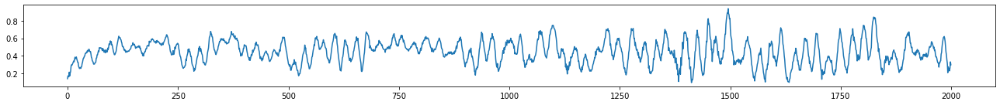

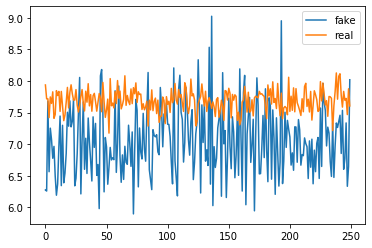

Epoch: 66 	 Discriminator Loss: [-0.53734, 0.362] 		 Generator Loss: -0.08907918632030487
Epoch: 67 	 Discriminator Loss: [-0.04104577, 0.0] 		 Generator Loss: 1.356054663658142
Epoch: 68 	 Discriminator Loss: [-0.2968229, 0.5] 		 Generator Loss: -6.630569934844971
Epoch: 69 	 Discriminator Loss: [-0.43334576, 0.5] 		 Generator Loss: -5.980345726013184
Epoch: 70 	 Discriminator Loss: [-0.582383, 0.494] 		 Generator Loss: -0.670612096786499


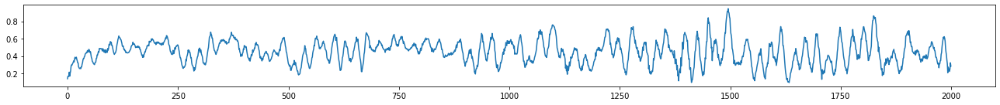

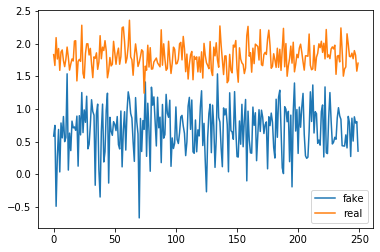

Epoch: 71 	 Discriminator Loss: [-0.5998737, 0.476] 		 Generator Loss: -0.10910629481077194
Epoch: 72 	 Discriminator Loss: [-0.46107635, 0.5] 		 Generator Loss: -5.936941623687744
Epoch: 73 	 Discriminator Loss: [-0.6171368, 0.488] 		 Generator Loss: -1.286048173904419
Epoch: 74 	 Discriminator Loss: [-0.6043279, 0.492] 		 Generator Loss: -1.2588618993759155
Epoch: 75 	 Discriminator Loss: [-0.496305, 0.5] 		 Generator Loss: -6.0315093994140625


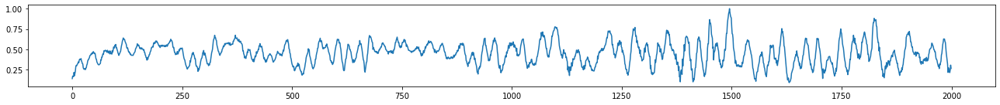

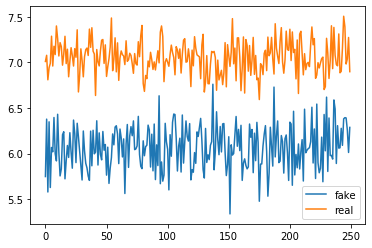

Epoch: 76 	 Discriminator Loss: [-0.64326835, 0.492] 		 Generator Loss: -1.1225569248199463
Epoch: 77 	 Discriminator Loss: [-0.50199044, 0.5] 		 Generator Loss: -6.2683186531066895
Epoch: 78 	 Discriminator Loss: [-0.3424034, 0.5] 		 Generator Loss: -8.793734550476074
Epoch: 79 	 Discriminator Loss: [-0.04915414, 0.0] 		 Generator Loss: 1.587206244468689
Epoch: 80 	 Discriminator Loss: [-0.050165404, 0.0] 		 Generator Loss: 1.574619174003601


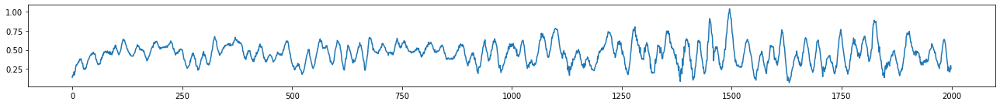

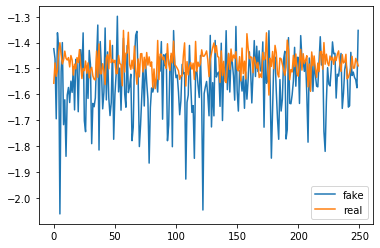

Epoch: 81 	 Discriminator Loss: [-0.6517111, 0.08] 		 Generator Loss: -2.342285633087158
Epoch: 82 	 Discriminator Loss: [-0.63024837, 0.5] 		 Generator Loss: 1.3549436330795288
Epoch: 83 	 Discriminator Loss: [-0.46506858, 0.5] 		 Generator Loss: -6.388387203216553
Epoch: 84 	 Discriminator Loss: [-0.6668803, 0.0] 		 Generator Loss: 0.49395743012428284
Epoch: 85 	 Discriminator Loss: [-0.7075046, 0.0] 		 Generator Loss: 0.29711759090423584


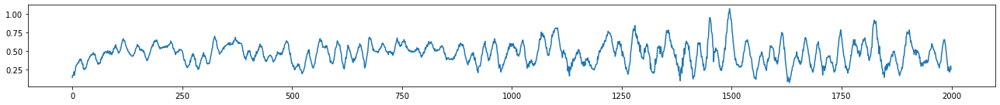

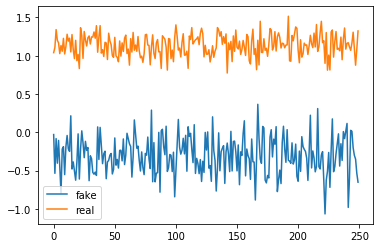

Epoch: 86 	 Discriminator Loss: [-0.7156396, 0.0] 		 Generator Loss: 1.3665646314620972
Epoch: 87 	 Discriminator Loss: [-0.72121984, 0.0] 		 Generator Loss: 0.18933330476284027
Epoch: 88 	 Discriminator Loss: [-0.6342836, 0.5] 		 Generator Loss: 0.22416259348392487
Epoch: 89 	 Discriminator Loss: [-0.50760406, 0.5] 		 Generator Loss: -4.260700225830078
Epoch: 90 	 Discriminator Loss: [-0.696084, 0.5] 		 Generator Loss: 0.9575203061103821


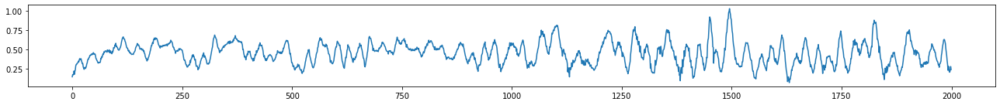

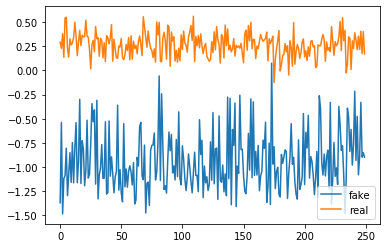

Epoch: 91 	 Discriminator Loss: [-0.50442713, 0.5] 		 Generator Loss: -5.478983402252197
Epoch: 92 	 Discriminator Loss: [-0.6645961, 0.0] 		 Generator Loss: -6.300246238708496
Epoch: 93 	 Discriminator Loss: [-0.26847625, 0.5] 		 Generator Loss: -7.443367958068848
Epoch: 94 	 Discriminator Loss: [-0.7192408, 0.344] 		 Generator Loss: -0.10476409643888474
Epoch: 95 	 Discriminator Loss: [-0.7059507, 0.5] 		 Generator Loss: -1.2375167608261108


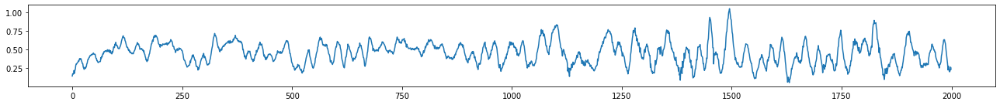

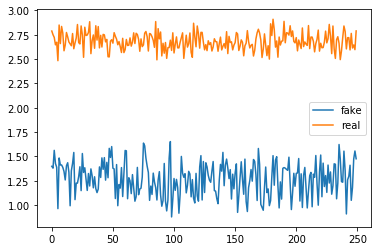

Epoch: 96 	 Discriminator Loss: [-0.4471254, 0.5] 		 Generator Loss: -5.819153785705566
Epoch: 97 	 Discriminator Loss: [-0.4009864, 0.5] 		 Generator Loss: -6.305436611175537
Epoch: 98 	 Discriminator Loss: [-0.29383403, 0.5] 		 Generator Loss: -7.8508124351501465
Epoch: 99 	 Discriminator Loss: [-0.536571, 0.5] 		 Generator Loss: -1.540400743484497
Epoch: 100 	 Discriminator Loss: [-0.7287349, 0.32] 		 Generator Loss: -0.6067929863929749


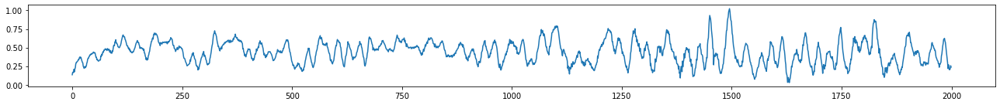

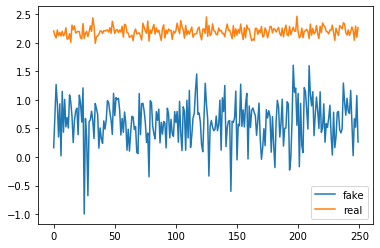

Epoch: 101 	 Discriminator Loss: [-0.44472182, 0.5] 		 Generator Loss: -7.162382125854492
Epoch: 102 	 Discriminator Loss: [-0.14223585, 0.0] 		 Generator Loss: -6.649928092956543
Epoch: 103 	 Discriminator Loss: [-0.7184345, 0.392] 		 Generator Loss: -0.7720291614532471
Epoch: 104 	 Discriminator Loss: [-0.6463595, 0.5] 		 Generator Loss: -2.9876961708068848
Epoch: 105 	 Discriminator Loss: [-0.36670163, 0.5] 		 Generator Loss: -7.668325424194336


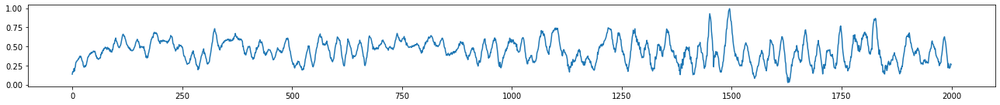

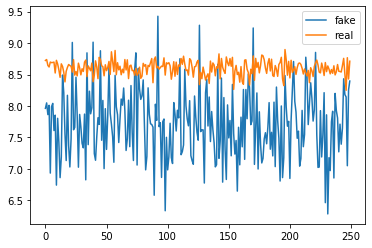

Epoch: 106 	 Discriminator Loss: [-0.58345187, 0.5] 		 Generator Loss: -2.535158634185791
Epoch: 107 	 Discriminator Loss: [-0.049035896, 0.0] 		 Generator Loss: 1.2898896932601929
Epoch: 108 	 Discriminator Loss: [-0.6746036, 0.0] 		 Generator Loss: 0.06309357285499573
Epoch: 109 	 Discriminator Loss: [-0.59829116, 0.396] 		 Generator Loss: -0.5072380304336548
Epoch: 110 	 Discriminator Loss: [-0.5827505, 0.048] 		 Generator Loss: -0.2837148904800415


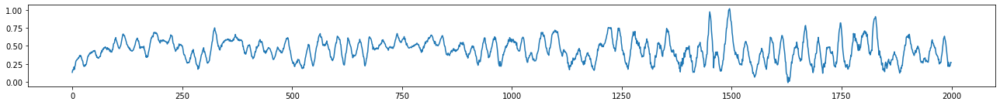

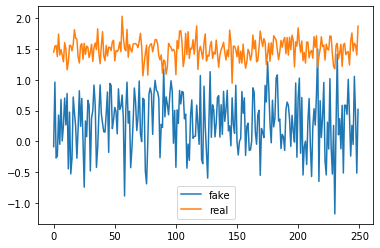

Epoch: 111 	 Discriminator Loss: [-0.61983347, 0.0] 		 Generator Loss: -7.145383834838867
Epoch: 112 	 Discriminator Loss: [-0.6577738, 0.0] 		 Generator Loss: -0.12872429192066193
Epoch: 113 	 Discriminator Loss: [-0.6741679, 0.434] 		 Generator Loss: -0.48479530215263367
Epoch: 114 	 Discriminator Loss: [-0.23485543, 0.5] 		 Generator Loss: -5.1641035079956055
Epoch: 115 	 Discriminator Loss: [-0.70166314, 0.008] 		 Generator Loss: -0.9322627186775208


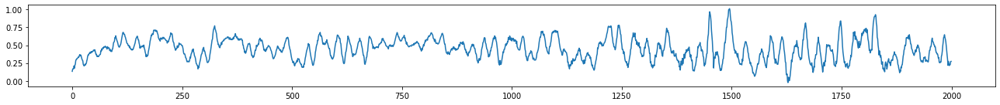

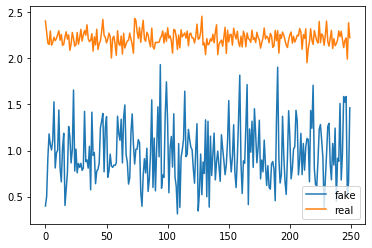

Epoch: 116 	 Discriminator Loss: [-0.620702, 0.0] 		 Generator Loss: -8.029324531555176
Epoch: 117 	 Discriminator Loss: [-0.6244331, 0.004] 		 Generator Loss: -6.617739677429199
Epoch: 118 	 Discriminator Loss: [-0.4763833, 0.5] 		 Generator Loss: -6.809712886810303
Epoch: 119 	 Discriminator Loss: [-0.739421, 0.496] 		 Generator Loss: -1.436648964881897
Epoch: 120 	 Discriminator Loss: [-0.7040288, 0.498] 		 Generator Loss: -1.8687916994094849


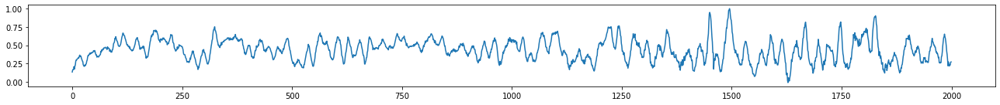

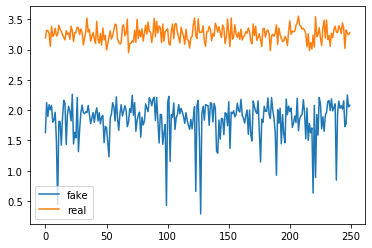

Epoch: 121 	 Discriminator Loss: [-0.68660814, 0.436] 		 Generator Loss: -0.8318208456039429
Epoch: 122 	 Discriminator Loss: [-0.3823727, 0.5] 		 Generator Loss: -6.83542013168335
Epoch: 123 	 Discriminator Loss: [-0.4844719, 0.5] 		 Generator Loss: -6.659419059753418
Epoch: 124 	 Discriminator Loss: [-0.27647454, 0.5] 		 Generator Loss: -8.56385326385498
Epoch: 125 	 Discriminator Loss: [-0.043954957, 0.0] 		 Generator Loss: 1.6124646663665771


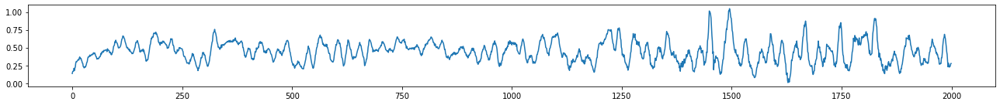

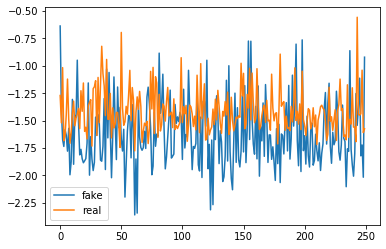

Epoch: 126 	 Discriminator Loss: [-0.5935146, 0.306] 		 Generator Loss: -6.099271774291992
Epoch: 127 	 Discriminator Loss: [-0.5981984, 0.5] 		 Generator Loss: -2.7857697010040283
Epoch: 128 	 Discriminator Loss: [-0.073570006, 0.0] 		 Generator Loss: -3.254112482070923
Epoch: 129 	 Discriminator Loss: [-0.60655004, 0.474] 		 Generator Loss: -2.8797900676727295
Epoch: 130 	 Discriminator Loss: [-0.4455325, 0.5] 		 Generator Loss: -7.4466986656188965


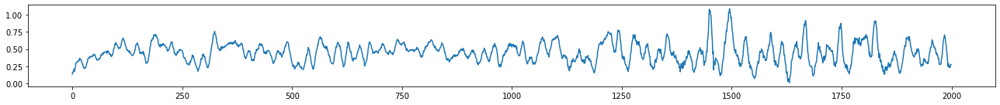

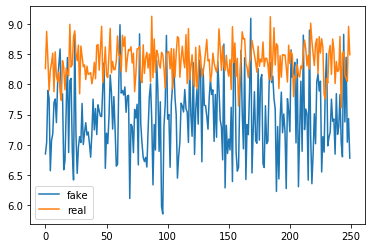

Epoch: 131 	 Discriminator Loss: [-0.59540534, 0.5] 		 Generator Loss: -3.4784297943115234
Epoch: 132 	 Discriminator Loss: [-0.5837373, 0.396] 		 Generator Loss: -4.362247943878174
Epoch: 133 	 Discriminator Loss: [-0.58787566, 0.5] 		 Generator Loss: -2.0581820011138916
Epoch: 134 	 Discriminator Loss: [-0.5783044, 0.408] 		 Generator Loss: -2.281235694885254
Epoch: 135 	 Discriminator Loss: [-0.4440124, 0.5] 		 Generator Loss: -0.7735978960990906


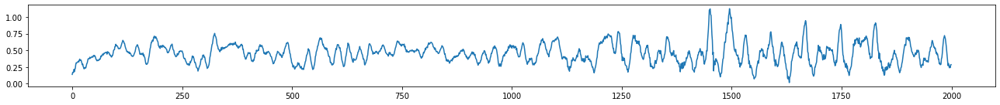

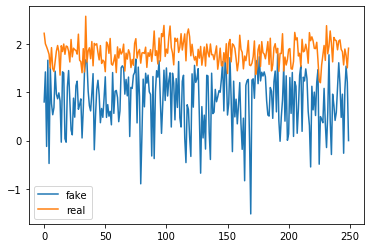

Epoch: 136 	 Discriminator Loss: [-0.032398935, 0.0] 		 Generator Loss: 1.6915812492370605
Epoch: 137 	 Discriminator Loss: [-0.53662837, 0.496] 		 Generator Loss: -2.1877098083496094
Epoch: 138 	 Discriminator Loss: [-0.322348, 0.5] 		 Generator Loss: -3.9104878902435303
Epoch: 139 	 Discriminator Loss: [-0.5173121, 0.5] 		 Generator Loss: 0.8104518055915833
Epoch: 140 	 Discriminator Loss: [-0.551372, 0.0] 		 Generator Loss: -7.638972282409668


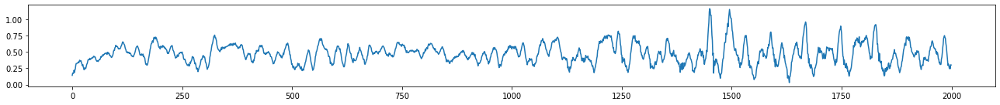

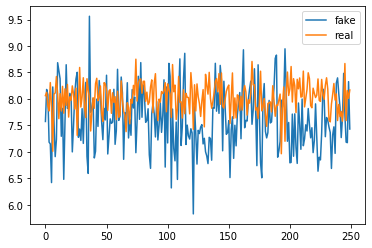

KeyboardInterrupt: 

In [69]:
batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=5, disc_losses=disc_losses, gen_losses=gen_losses)

Epoch: 0 	 Discriminator Loss: [-0.6766901, 0.002] 		 Generator Loss: -0.26817449927330017


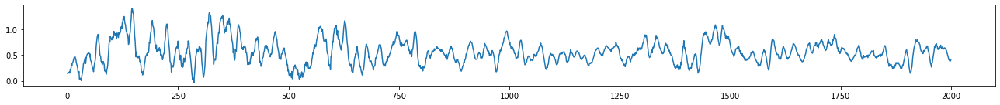

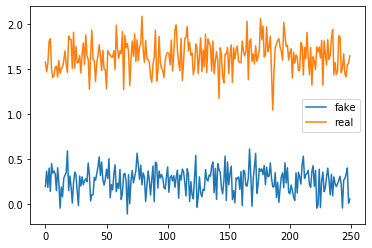

Epoch: 1 	 Discriminator Loss: [-0.68977845, 0.0] 		 Generator Loss: -0.061041440814733505
Epoch: 2 	 Discriminator Loss: [-0.4564782, 0.5] 		 Generator Loss: -2.4428298473358154
Epoch: 3 	 Discriminator Loss: [-0.077258095, 0.0] 		 Generator Loss: 1.1965975761413574
Epoch: 4 	 Discriminator Loss: [-0.6747597, 0.0] 		 Generator Loss: -0.4455103874206543
Epoch: 5 	 Discriminator Loss: [-0.646597, 0.41] 		 Generator Loss: 1.1479499340057373


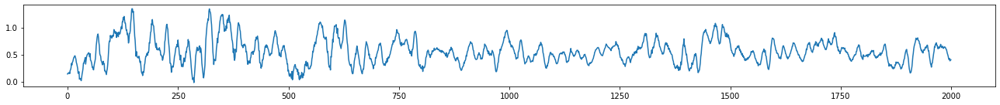

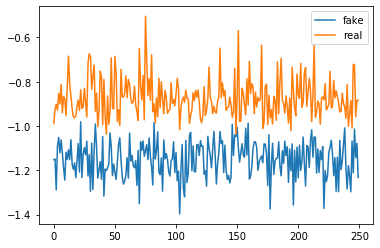

Epoch: 6 	 Discriminator Loss: [-0.62793505, 0.488] 		 Generator Loss: 1.2698484659194946
Epoch: 7 	 Discriminator Loss: [-0.66781557, 0.0] 		 Generator Loss: -0.39476215839385986
Epoch: 8 	 Discriminator Loss: [-0.48074946, 0.5] 		 Generator Loss: -0.43003472685813904
Epoch: 9 	 Discriminator Loss: [-0.43671346, 0.5] 		 Generator Loss: -2.2279534339904785
Epoch: 10 	 Discriminator Loss: [-0.46086678, 0.5] 		 Generator Loss: -2.3519582748413086


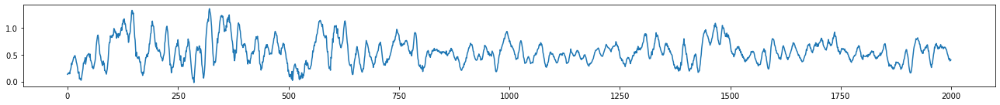

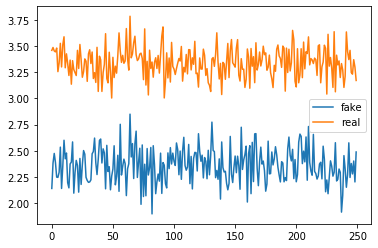

Epoch: 11 	 Discriminator Loss: [-0.44808555, 0.5] 		 Generator Loss: -2.720536947250366
Epoch: 12 	 Discriminator Loss: [-0.6844593, 0.0] 		 Generator Loss: 0.22963522374629974
Epoch: 13 	 Discriminator Loss: [-0.68044347, 0.006] 		 Generator Loss: 0.19751116633415222
Epoch: 14 	 Discriminator Loss: [-0.7021913, 0.004] 		 Generator Loss: 0.25185611844062805
Epoch: 15 	 Discriminator Loss: [-0.7006762, 0.002] 		 Generator Loss: 0.16022811830043793


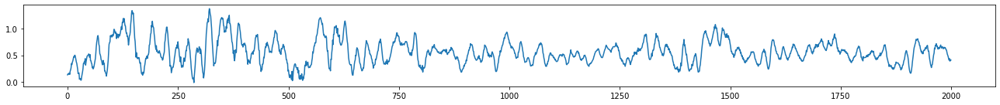

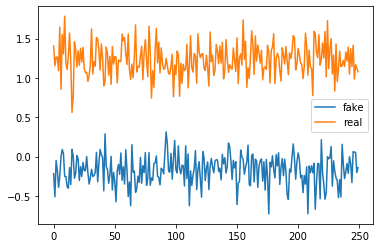

Epoch: 16 	 Discriminator Loss: [-0.6920458, 0.002] 		 Generator Loss: -0.03525381162762642
Epoch: 17 	 Discriminator Loss: [-0.70123565, 0.0] 		 Generator Loss: 0.28999829292297363
Epoch: 18 	 Discriminator Loss: [-0.70059377, 0.0] 		 Generator Loss: 0.20633378624916077
Epoch: 19 	 Discriminator Loss: [-0.6815078, 0.0] 		 Generator Loss: 0.06443528831005096
Epoch: 20 	 Discriminator Loss: [-0.4186262, 0.5] 		 Generator Loss: -2.741703748703003


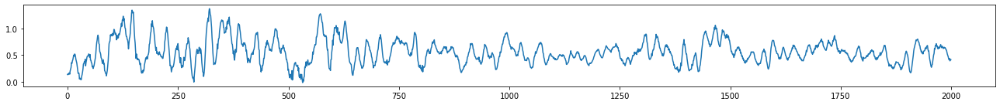

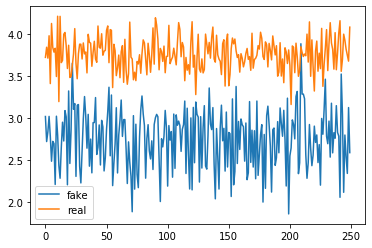

Epoch: 21 	 Discriminator Loss: [-0.6629146, 0.0] 		 Generator Loss: 0.04488104581832886
Epoch: 22 	 Discriminator Loss: [-0.6738915, 0.008] 		 Generator Loss: 0.2310970574617386
Epoch: 23 	 Discriminator Loss: [-0.66779345, 0.05] 		 Generator Loss: 0.21439990401268005
Epoch: 24 	 Discriminator Loss: [-0.6674341, 0.098] 		 Generator Loss: -0.21313101053237915
Epoch: 25 	 Discriminator Loss: [-0.66171485, 0.026] 		 Generator Loss: -0.41486498713493347


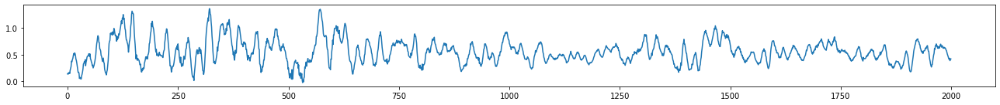

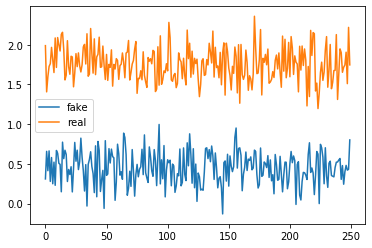

Epoch: 26 	 Discriminator Loss: [-0.67283875, 0.006] 		 Generator Loss: -0.03182784467935562
Epoch: 27 	 Discriminator Loss: [-0.66969544, 0.0] 		 Generator Loss: -0.06993693858385086
Epoch: 28 	 Discriminator Loss: [-0.6721006, 0.0] 		 Generator Loss: 0.12069602310657501
Epoch: 29 	 Discriminator Loss: [-0.6365093, 0.004] 		 Generator Loss: -0.2287137508392334
Epoch: 30 	 Discriminator Loss: [-0.54336554, 0.0] 		 Generator Loss: -3.495277166366577


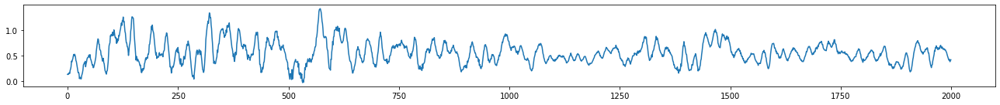

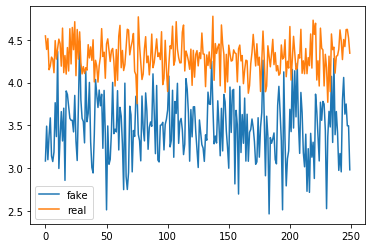

Epoch: 31 	 Discriminator Loss: [-0.6341118, 0.012] 		 Generator Loss: 0.15245085954666138
Epoch: 32 	 Discriminator Loss: [-0.4273981, 0.5] 		 Generator Loss: -2.729766607284546
Epoch: 33 	 Discriminator Loss: [-0.6148995, 0.0] 		 Generator Loss: -0.1508703976869583
Epoch: 34 	 Discriminator Loss: [-0.60224944, 0.01] 		 Generator Loss: -0.1714312881231308
Epoch: 35 	 Discriminator Loss: [-0.59484124, 0.24] 		 Generator Loss: -0.3705736994743347


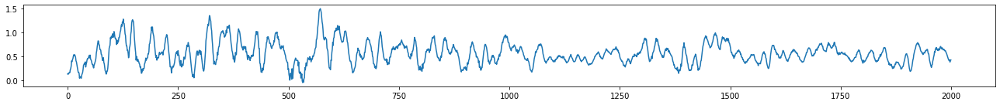

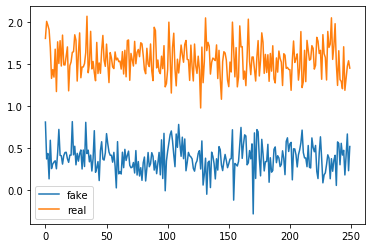

Epoch: 36 	 Discriminator Loss: [-0.42968732, 0.5] 		 Generator Loss: -2.2740931510925293
Epoch: 37 	 Discriminator Loss: [-0.58360595, 0.008] 		 Generator Loss: -0.3655751943588257
Epoch: 38 	 Discriminator Loss: [-0.5802985, 0.07] 		 Generator Loss: -0.2897711396217346
Epoch: 39 	 Discriminator Loss: [-0.45656937, 0.5] 		 Generator Loss: -0.44245585799217224
Epoch: 40 	 Discriminator Loss: [-0.43083698, 0.5] 		 Generator Loss: -0.5260465741157532


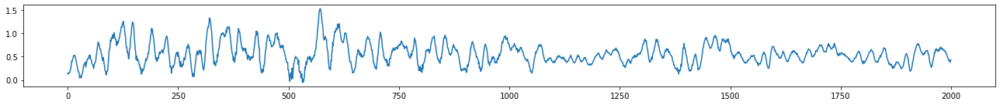

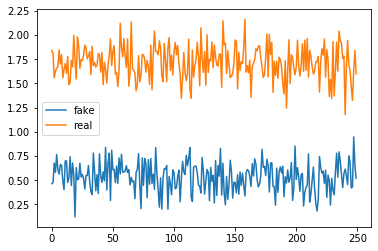

Epoch: 41 	 Discriminator Loss: [-0.5895641, 0.004] 		 Generator Loss: -0.12228989601135254
Epoch: 42 	 Discriminator Loss: [-0.5882964, 0.0] 		 Generator Loss: 0.20258276164531708
Epoch: 43 	 Discriminator Loss: [-0.58480644, 0.0] 		 Generator Loss: 0.5387299060821533
Epoch: 44 	 Discriminator Loss: [-0.3904064, 0.5] 		 Generator Loss: -1.9286481142044067
Epoch: 45 	 Discriminator Loss: [-0.2707431, 0.5] 		 Generator Loss: -3.0027735233306885


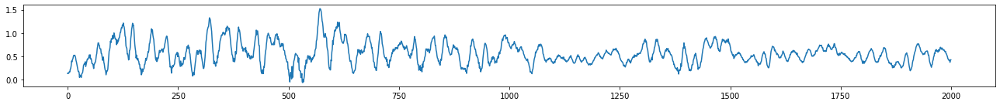

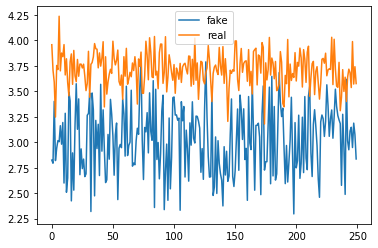

Epoch: 46 	 Discriminator Loss: [-0.395571, 0.0] 		 Generator Loss: -3.3437414169311523
Epoch: 47 	 Discriminator Loss: [-0.56299, 0.008] 		 Generator Loss: -0.08757256716489792
Epoch: 48 	 Discriminator Loss: [-0.5655554, 0.0] 		 Generator Loss: 0.3569989502429962
Epoch: 49 	 Discriminator Loss: [-0.53356814, 0.208] 		 Generator Loss: -0.2774518132209778
Epoch: 50 	 Discriminator Loss: [-0.5431184, 0.0] 		 Generator Loss: 0.12811177968978882


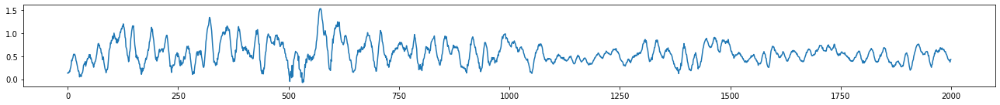

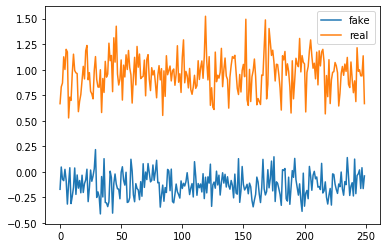

Epoch: 51 	 Discriminator Loss: [-0.5252029, 0.036] 		 Generator Loss: -0.23660366237163544
Epoch: 52 	 Discriminator Loss: [-0.54089975, 0.0] 		 Generator Loss: -0.9628381133079529
Epoch: 53 	 Discriminator Loss: [-0.540239, 0.0] 		 Generator Loss: 0.26797449588775635
Epoch: 54 	 Discriminator Loss: [-0.5400419, 0.0] 		 Generator Loss: 0.5794031620025635
Epoch: 55 	 Discriminator Loss: [-0.5342894, 0.0] 		 Generator Loss: -1.4213906526565552


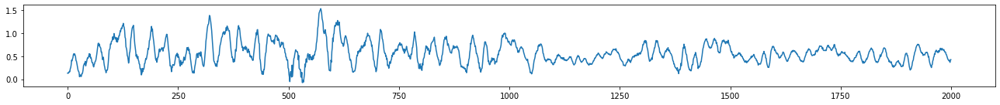

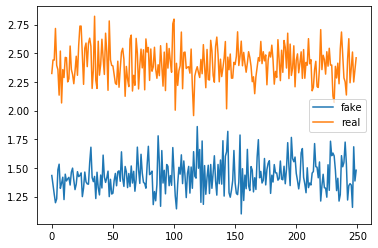

Epoch: 56 	 Discriminator Loss: [-0.24354693, 0.5] 		 Generator Loss: -2.787220001220703
Epoch: 57 	 Discriminator Loss: [-0.5378054, 0.0] 		 Generator Loss: 0.1322430968284607
Epoch: 58 	 Discriminator Loss: [-0.5262303, 0.0] 		 Generator Loss: 0.30771490931510925
Epoch: 59 	 Discriminator Loss: [-0.48190492, 0.5] 		 Generator Loss: 1.0703833103179932
Epoch: 60 	 Discriminator Loss: [-0.4579222, 0.5] 		 Generator Loss: 1.0919395685195923


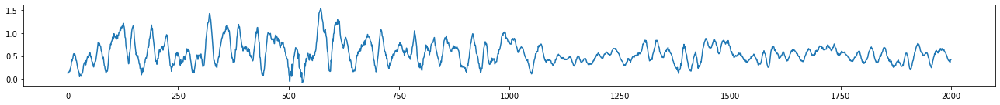

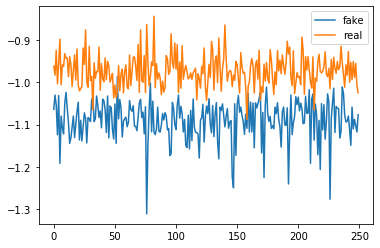

Epoch: 61 	 Discriminator Loss: [-0.52575535, 0.0] 		 Generator Loss: 0.019346056506037712
Epoch: 62 	 Discriminator Loss: [-0.5219477, 0.0] 		 Generator Loss: -0.02843436412513256
Epoch: 63 	 Discriminator Loss: [-0.5364206, 0.0] 		 Generator Loss: -0.10989965498447418
Epoch: 64 	 Discriminator Loss: [-0.555063, 0.0] 		 Generator Loss: 0.06489042937755585
Epoch: 65 	 Discriminator Loss: [-0.5931657, 0.0] 		 Generator Loss: 0.32702597975730896


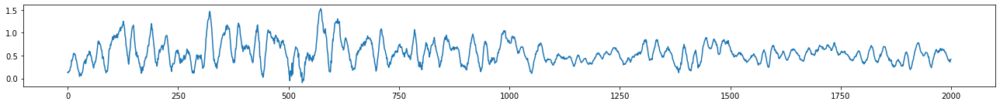

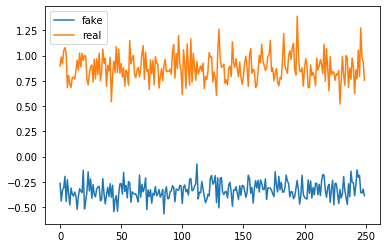

Epoch: 66 	 Discriminator Loss: [-0.60780126, 0.0] 		 Generator Loss: 0.1272854059934616
Epoch: 67 	 Discriminator Loss: [-0.62106997, 0.002] 		 Generator Loss: 0.021448785439133644
Epoch: 68 	 Discriminator Loss: [-0.6132683, 0.336] 		 Generator Loss: -0.6328960061073303
Epoch: 69 	 Discriminator Loss: [-0.61816317, 0.5] 		 Generator Loss: 0.5519763827323914
Epoch: 70 	 Discriminator Loss: [-0.62826806, 0.026] 		 Generator Loss: -0.5364413857460022


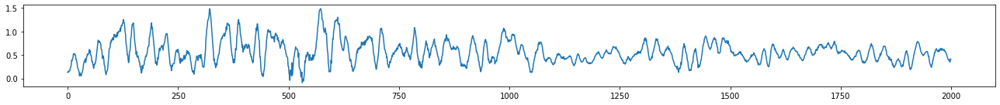

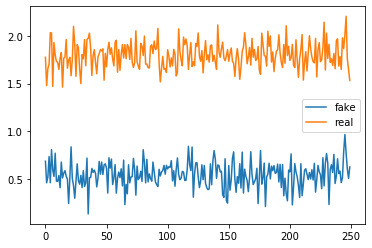

Epoch: 71 	 Discriminator Loss: [-0.6231237, 0.094] 		 Generator Loss: 0.2054668515920639
Epoch: 72 	 Discriminator Loss: [-0.6081056, 0.034] 		 Generator Loss: -0.4227844774723053
Epoch: 73 	 Discriminator Loss: [-0.61277723, 0.002] 		 Generator Loss: -0.2810622751712799
Epoch: 74 	 Discriminator Loss: [-0.60461414, 0.008] 		 Generator Loss: -0.1749991476535797
Epoch: 75 	 Discriminator Loss: [-0.28927916, 0.5] 		 Generator Loss: -1.97336745262146


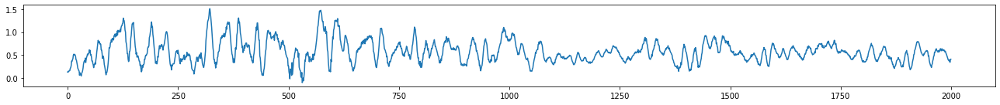

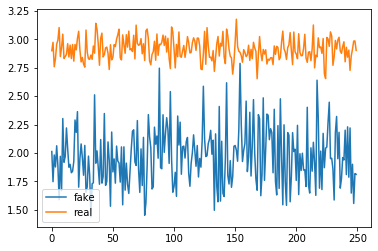

Epoch: 76 	 Discriminator Loss: [-0.60911816, 0.0] 		 Generator Loss: 0.3202487528324127
Epoch: 77 	 Discriminator Loss: [-0.6164027, 0.06] 		 Generator Loss: 0.019587870687246323
Epoch: 78 	 Discriminator Loss: [-0.60456675, 0.062] 		 Generator Loss: 0.06933903694152832
Epoch: 79 	 Discriminator Loss: [-0.22643921, 0.5] 		 Generator Loss: -3.588331699371338
Epoch: 80 	 Discriminator Loss: [-0.60238004, 0.0] 		 Generator Loss: -1.019809603691101


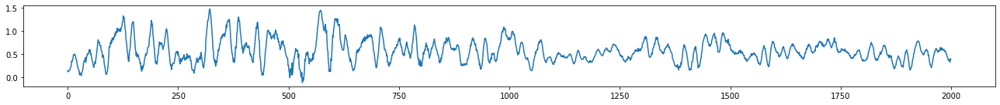

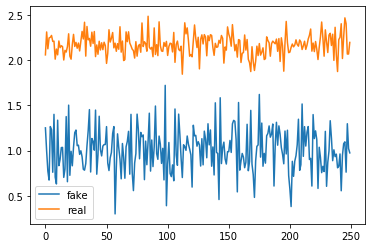

Epoch: 81 	 Discriminator Loss: [-0.22484562, 0.5] 		 Generator Loss: -3.909980535507202
Epoch: 82 	 Discriminator Loss: [-0.59035766, 0.0] 		 Generator Loss: -0.5662270784378052
Epoch: 83 	 Discriminator Loss: [-0.56700104, 0.5] 		 Generator Loss: -1.3711323738098145
Epoch: 84 	 Discriminator Loss: [-0.5899245, 0.02] 		 Generator Loss: 0.00875601451843977
Epoch: 85 	 Discriminator Loss: [-0.57457453, 0.264] 		 Generator Loss: -0.4334622025489807


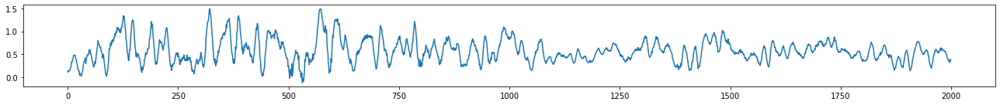

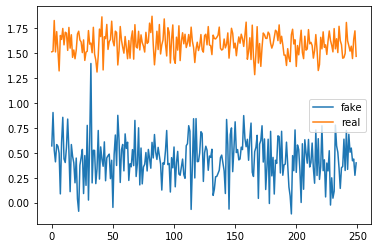

Epoch: 86 	 Discriminator Loss: [-0.56187576, 0.136] 		 Generator Loss: 0.35619843006134033
Epoch: 87 	 Discriminator Loss: [-0.09029988, 0.0] 		 Generator Loss: -0.7355175614356995
Epoch: 88 	 Discriminator Loss: [-0.44015497, 0.5] 		 Generator Loss: 0.5736397504806519
Epoch: 89 	 Discriminator Loss: [-0.5335902, 0.5] 		 Generator Loss: 0.8085980415344238
Epoch: 90 	 Discriminator Loss: [-0.53207165, 0.0] 		 Generator Loss: -2.395571231842041


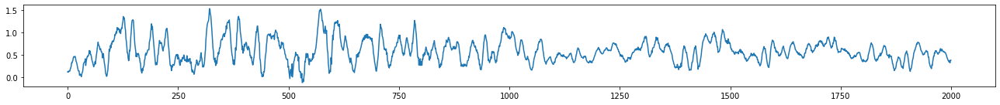

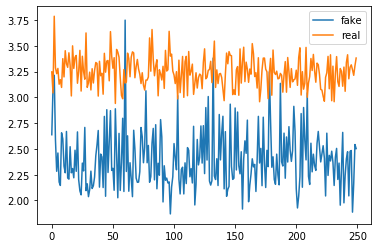

Epoch: 91 	 Discriminator Loss: [-0.5344414, 0.0] 		 Generator Loss: -0.7248426079750061
Epoch: 92 	 Discriminator Loss: [-0.35111862, 0.5] 		 Generator Loss: -1.7610305547714233
Epoch: 93 	 Discriminator Loss: [-0.53456557, 0.5] 		 Generator Loss: -0.7422063946723938
Epoch: 94 	 Discriminator Loss: [-0.52063143, 0.498] 		 Generator Loss: 0.3513220250606537
Epoch: 95 	 Discriminator Loss: [-0.35556704, 0.5] 		 Generator Loss: -2.748971462249756


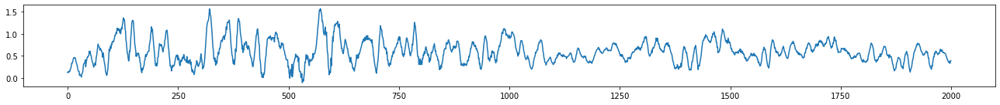

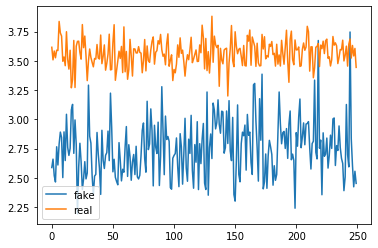

Epoch: 96 	 Discriminator Loss: [-0.5433482, 0.07] 		 Generator Loss: -0.6813256144523621
Epoch: 97 	 Discriminator Loss: [-0.5368262, 0.36] 		 Generator Loss: -0.8867992758750916
Epoch: 98 	 Discriminator Loss: [-0.4702273, 0.5] 		 Generator Loss: 0.875167727470398
Epoch: 99 	 Discriminator Loss: [-0.53091186, 0.276] 		 Generator Loss: -0.19468826055526733
Epoch: 100 	 Discriminator Loss: [-0.52923197, 0.11] 		 Generator Loss: -0.503510594367981


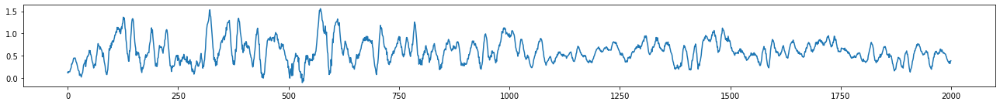

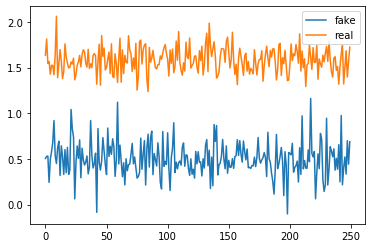

Epoch: 101 	 Discriminator Loss: [-0.51188123, 0.494] 		 Generator Loss: 0.656326174736023
Epoch: 102 	 Discriminator Loss: [-0.52412593, 0.24] 		 Generator Loss: 0.35758012533187866
Epoch: 103 	 Discriminator Loss: [-0.5099687, 0.5] 		 Generator Loss: 0.5816976428031921
Epoch: 104 	 Discriminator Loss: [-0.22835612, 0.5] 		 Generator Loss: -3.6115920543670654
Epoch: 105 	 Discriminator Loss: [-0.5139552, 0.048] 		 Generator Loss: -0.08115237206220627


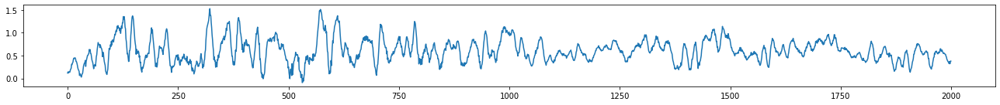

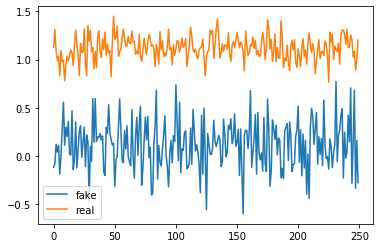

Epoch: 106 	 Discriminator Loss: [-0.49330974, 0.17] 		 Generator Loss: -0.24384289979934692
Epoch: 107 	 Discriminator Loss: [-0.4705598, 0.494] 		 Generator Loss: 0.17198127508163452
Epoch: 108 	 Discriminator Loss: [-0.48948956, 0.092] 		 Generator Loss: -0.21443124115467072
Epoch: 109 	 Discriminator Loss: [-0.5068847, 0.01] 		 Generator Loss: -0.27712661027908325
Epoch: 110 	 Discriminator Loss: [-0.28546342, 0.5] 		 Generator Loss: -2.3971173763275146


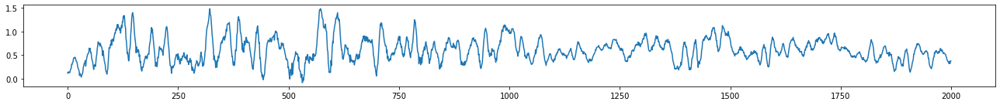

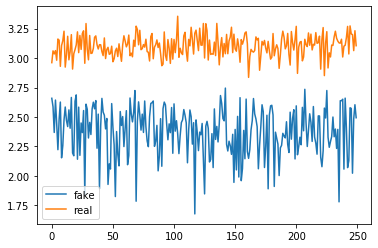

Epoch: 111 	 Discriminator Loss: [-0.52478653, 0.098] 		 Generator Loss: -0.3746618330478668
Epoch: 112 	 Discriminator Loss: [-0.55469716, 0.066] 		 Generator Loss: -0.0010959322098642588
Epoch: 113 	 Discriminator Loss: [-0.5623954, 0.016] 		 Generator Loss: -0.18803347647190094
Epoch: 114 	 Discriminator Loss: [-0.56766325, 0.016] 		 Generator Loss: 0.011585788801312447
Epoch: 115 	 Discriminator Loss: [-0.5718963, 0.0] 		 Generator Loss: -0.10016068071126938


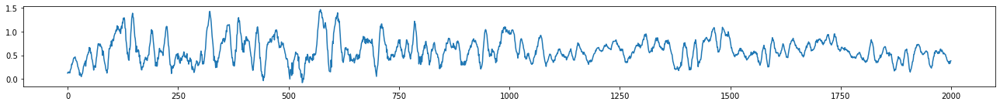

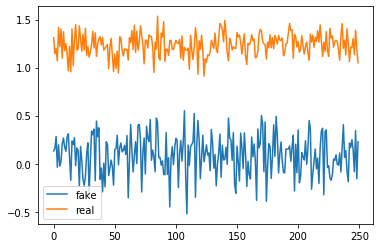

Epoch: 116 	 Discriminator Loss: [-0.3836071, 0.5] 		 Generator Loss: -1.262502670288086
Epoch: 117 	 Discriminator Loss: [-0.37296197, 0.0] 		 Generator Loss: -3.728027582168579
Epoch: 118 	 Discriminator Loss: [-0.586385, 0.006] 		 Generator Loss: -0.01771588623523712
Epoch: 119 	 Discriminator Loss: [-0.59944516, 0.014] 		 Generator Loss: -0.1663495898246765
Epoch: 120 	 Discriminator Loss: [-0.5586771, 0.5] 		 Generator Loss: 0.4257383644580841


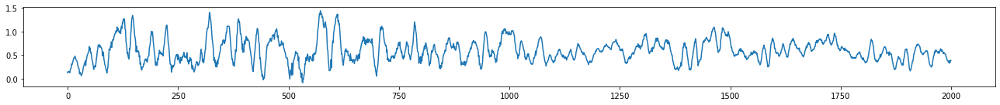

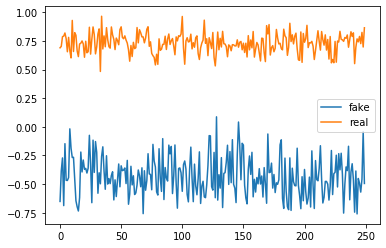

Epoch: 121 	 Discriminator Loss: [-0.6153709, 0.0] 		 Generator Loss: -0.7804307341575623
Epoch: 122 	 Discriminator Loss: [-0.6282266, 0.002] 		 Generator Loss: -0.060576844960451126
Epoch: 123 	 Discriminator Loss: [-0.48565054, 0.5] 		 Generator Loss: -0.8852278590202332
Epoch: 124 	 Discriminator Loss: [-0.61992663, 0.028] 		 Generator Loss: -0.14281754195690155
Epoch: 125 	 Discriminator Loss: [-0.1880902, 0.0] 		 Generator Loss: -5.113351821899414


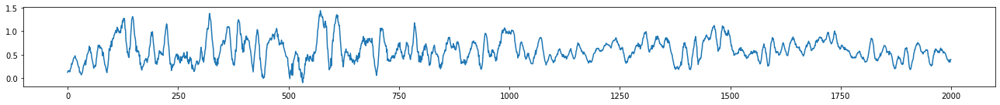

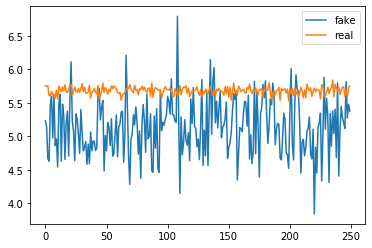

Epoch: 126 	 Discriminator Loss: [-0.61294013, 0.044] 		 Generator Loss: -0.19298629462718964
Epoch: 127 	 Discriminator Loss: [-0.5919974, 0.006] 		 Generator Loss: -0.4058527648448944
Epoch: 128 	 Discriminator Loss: [-0.59642506, 0.064] 		 Generator Loss: -0.37979990243911743
Epoch: 129 	 Discriminator Loss: [-0.51184475, 0.0] 		 Generator Loss: -4.899023056030273
Epoch: 130 	 Discriminator Loss: [-0.6489954, 0.034] 		 Generator Loss: -0.06768613308668137


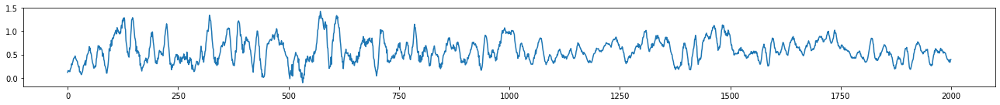

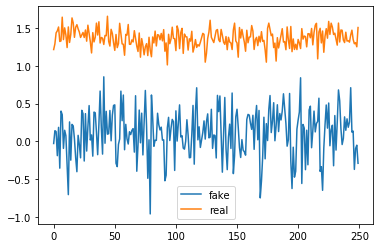

Epoch: 131 	 Discriminator Loss: [-0.5717937, 0.5] 		 Generator Loss: 0.22178180515766144
Epoch: 132 	 Discriminator Loss: [-0.45583415, 0.5] 		 Generator Loss: -3.1071808338165283
Epoch: 133 	 Discriminator Loss: [-0.6220152, 0.082] 		 Generator Loss: -0.3466556668281555
Epoch: 134 	 Discriminator Loss: [-0.46876085, 0.5] 		 Generator Loss: -2.8827881813049316
Epoch: 135 	 Discriminator Loss: [-0.5198873, 0.5] 		 Generator Loss: 0.736526608467102


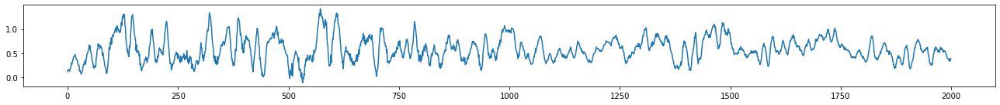

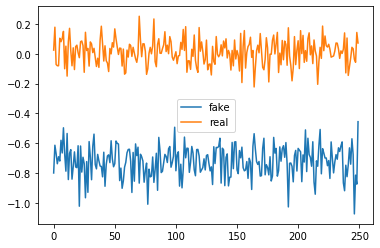

Epoch: 136 	 Discriminator Loss: [-0.64247227, 0.006] 		 Generator Loss: -0.39504703879356384
Epoch: 137 	 Discriminator Loss: [-0.58537203, 0.0] 		 Generator Loss: -2.7946534156799316
Epoch: 138 	 Discriminator Loss: [-0.53873855, 0.5] 		 Generator Loss: 0.8270055651664734
Epoch: 139 	 Discriminator Loss: [-0.5876943, 0.0] 		 Generator Loss: -0.4048491418361664
Epoch: 140 	 Discriminator Loss: [-0.36777863, 0.5] 		 Generator Loss: -3.3212995529174805


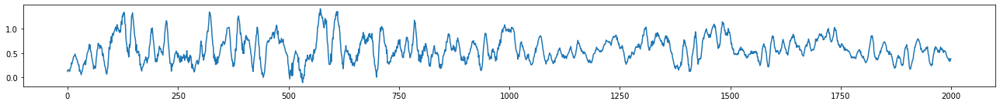

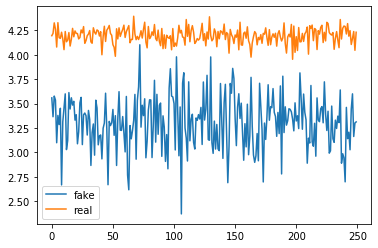

Epoch: 141 	 Discriminator Loss: [-0.596202, 0.3] 		 Generator Loss: -0.3943631649017334
Epoch: 142 	 Discriminator Loss: [-0.5946454, 0.134] 		 Generator Loss: -0.146280899643898
Epoch: 143 	 Discriminator Loss: [-0.58052766, 0.394] 		 Generator Loss: 0.5179650783538818
Epoch: 144 	 Discriminator Loss: [-0.46622777, 0.5] 		 Generator Loss: -1.1564806699752808
Epoch: 145 	 Discriminator Loss: [-0.60785156, 0.002] 		 Generator Loss: -0.515385091304779


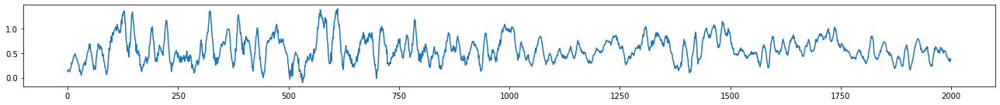

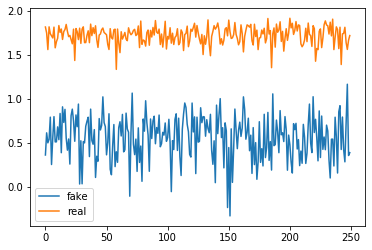

Epoch: 146 	 Discriminator Loss: [-0.4247914, 0.5] 		 Generator Loss: -2.358077049255371
Epoch: 147 	 Discriminator Loss: [-0.3775008, 0.5] 		 Generator Loss: -3.3062260150909424
Epoch: 148 	 Discriminator Loss: [-0.5741954, 0.444] 		 Generator Loss: 0.47443750500679016
Epoch: 149 	 Discriminator Loss: [-0.2974668, 0.5] 		 Generator Loss: -4.027149677276611
Epoch: 150 	 Discriminator Loss: [-0.40964034, 0.5] 		 Generator Loss: -3.1934022903442383


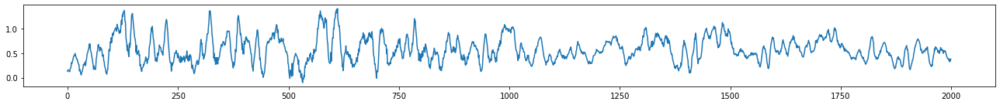

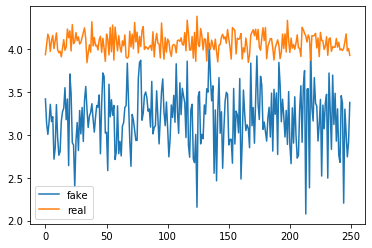

Epoch: 151 	 Discriminator Loss: [-0.5867661, 0.056] 		 Generator Loss: -0.26860564947128296
Epoch: 152 	 Discriminator Loss: [-0.57947165, 0.126] 		 Generator Loss: -0.1691647320985794
Epoch: 153 	 Discriminator Loss: [-0.57473826, 0.134] 		 Generator Loss: -0.02086096629500389
Epoch: 154 	 Discriminator Loss: [-0.56860316, 0.06] 		 Generator Loss: -0.07825526595115662
Epoch: 155 	 Discriminator Loss: [-0.56642765, 0.022] 		 Generator Loss: -0.26430267095565796


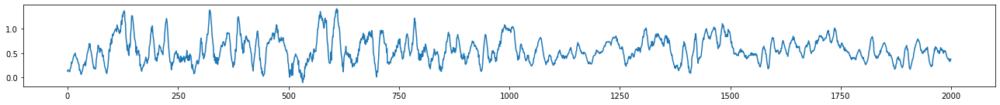

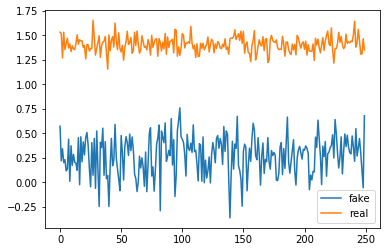

Epoch: 156 	 Discriminator Loss: [-0.56401867, 0.058] 		 Generator Loss: -0.1486879140138626
Epoch: 157 	 Discriminator Loss: [-0.5511485, 0.288] 		 Generator Loss: 0.644631564617157
Epoch: 158 	 Discriminator Loss: [-0.54306006, 0.026] 		 Generator Loss: -0.21116138994693756
Epoch: 159 	 Discriminator Loss: [-0.3512738, 0.5] 		 Generator Loss: -2.8098666667938232
Epoch: 160 	 Discriminator Loss: [-0.050193112, 0.0] 		 Generator Loss: -0.3911970257759094


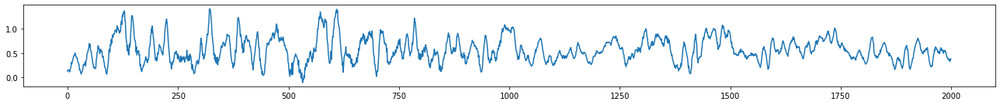

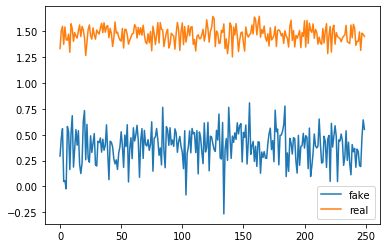

Epoch: 161 	 Discriminator Loss: [-0.12328521, 0.0] 		 Generator Loss: -4.509044170379639
Epoch: 162 	 Discriminator Loss: [-0.5226588, 0.472] 		 Generator Loss: 0.6058042049407959
Epoch: 163 	 Discriminator Loss: [-0.36077207, 0.5] 		 Generator Loss: -2.7074475288391113
Epoch: 164 	 Discriminator Loss: [-0.5242364, 0.472] 		 Generator Loss: -0.1398075968027115
Epoch: 165 	 Discriminator Loss: [-0.34040815, 0.5] 		 Generator Loss: -2.861480474472046


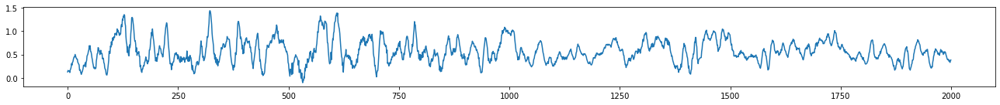

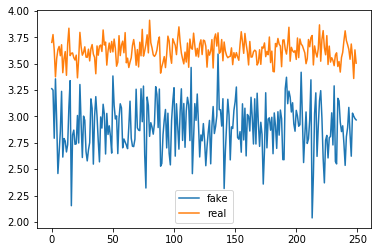

Epoch: 166 	 Discriminator Loss: [-0.49733284, 0.5] 		 Generator Loss: 0.7119332551956177
Epoch: 167 	 Discriminator Loss: [-0.129888, 0.0] 		 Generator Loss: -4.290560245513916
Epoch: 168 	 Discriminator Loss: [-0.39341882, 0.5] 		 Generator Loss: 0.4505654275417328
Epoch: 169 	 Discriminator Loss: [-0.50854784, 0.0] 		 Generator Loss: -0.9977027773857117
Epoch: 170 	 Discriminator Loss: [-0.52657413, 0.118] 		 Generator Loss: 0.25093457102775574


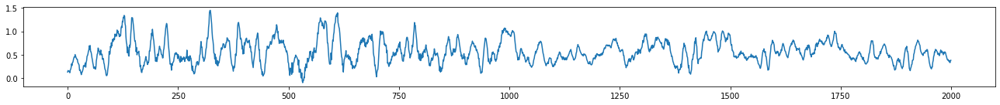

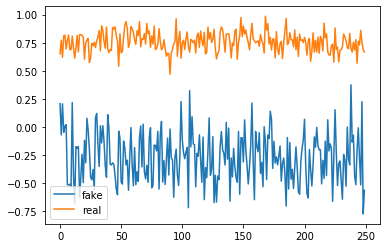

Epoch: 171 	 Discriminator Loss: [-0.46557194, 0.5] 		 Generator Loss: 0.7080904245376587
Epoch: 172 	 Discriminator Loss: [-0.027517583, 0.0] 		 Generator Loss: 0.7345086932182312
Epoch: 173 	 Discriminator Loss: [-0.29707447, 0.5] 		 Generator Loss: -3.2633986473083496
Epoch: 174 	 Discriminator Loss: [-0.5404357, 0.002] 		 Generator Loss: -0.17746011912822723
Epoch: 175 	 Discriminator Loss: [-0.5149443, 0.0] 		 Generator Loss: -0.49106255173683167


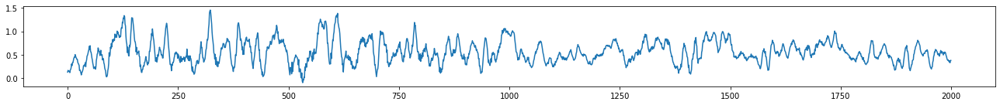

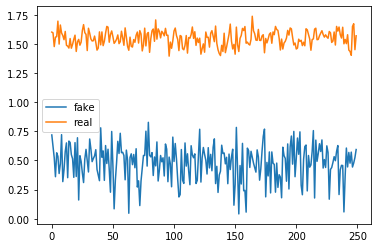

Epoch: 176 	 Discriminator Loss: [-0.534369, 0.156] 		 Generator Loss: -0.15857847034931183
Epoch: 177 	 Discriminator Loss: [-0.52072877, 0.49] 		 Generator Loss: 0.63737553358078
Epoch: 178 	 Discriminator Loss: [-0.5520737, 0.0] 		 Generator Loss: -1.6864862442016602
Epoch: 179 	 Discriminator Loss: [-0.5276216, 0.0] 		 Generator Loss: -0.47273948788642883
Epoch: 180 	 Discriminator Loss: [-0.43768108, 0.5] 		 Generator Loss: 0.3465079963207245


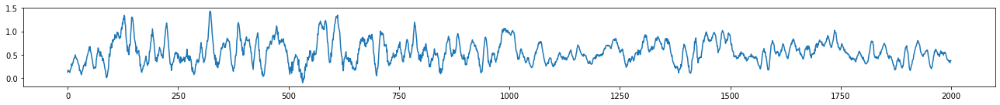

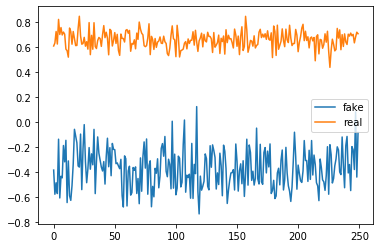

Epoch: 181 	 Discriminator Loss: [-0.5404254, 0.0] 		 Generator Loss: -0.04565364494919777
Epoch: 182 	 Discriminator Loss: [-0.5030307, 0.0] 		 Generator Loss: -0.3847517669200897
Epoch: 183 	 Discriminator Loss: [-0.4351358, 0.5] 		 Generator Loss: -0.1721535623073578
Epoch: 184 	 Discriminator Loss: [-0.36884767, 0.5] 		 Generator Loss: -1.7363440990447998
Epoch: 185 	 Discriminator Loss: [-0.51425153, 0.482] 		 Generator Loss: 0.6412370204925537


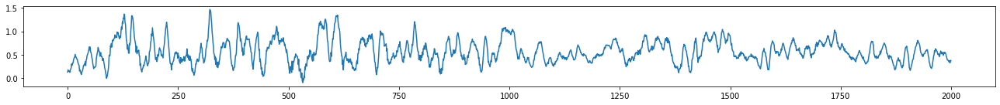

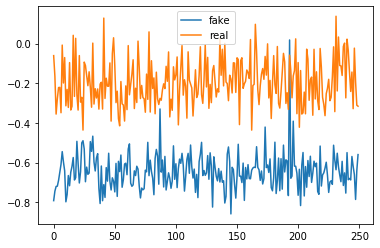

Epoch: 186 	 Discriminator Loss: [-0.5245271, 0.0] 		 Generator Loss: -0.37517595291137695
Epoch: 187 	 Discriminator Loss: [-0.41659817, 0.5] 		 Generator Loss: 0.05882241949439049
Epoch: 188 	 Discriminator Loss: [-0.27807528, 0.5] 		 Generator Loss: -2.9154906272888184
Epoch: 189 	 Discriminator Loss: [-0.43774846, 0.5] 		 Generator Loss: -0.0127461738884449
Epoch: 190 	 Discriminator Loss: [-0.47418824, 0.5] 		 Generator Loss: 0.34135234355926514


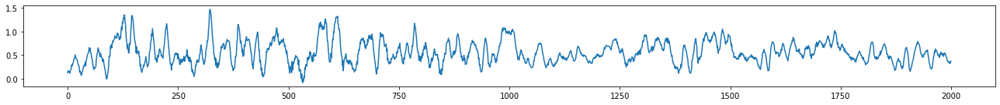

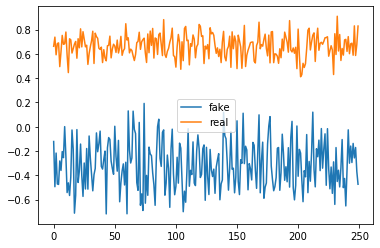

Epoch: 191 	 Discriminator Loss: [-0.51095885, 0.482] 		 Generator Loss: -0.7652868032455444
Epoch: 192 	 Discriminator Loss: [-0.51210916, 0.496] 		 Generator Loss: 0.5629454851150513
Epoch: 193 	 Discriminator Loss: [-0.513983, 0.5] 		 Generator Loss: 0.5374475121498108
Epoch: 194 	 Discriminator Loss: [-0.5304299, 0.478] 		 Generator Loss: 0.4303496778011322
Epoch: 195 	 Discriminator Loss: [-0.53190917, 0.332] 		 Generator Loss: -0.19589756429195404


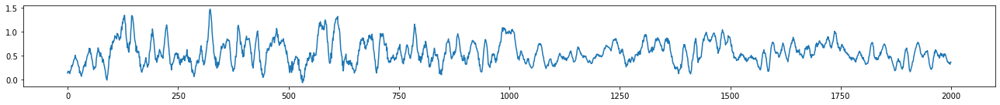

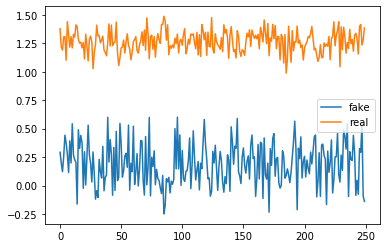

Epoch: 196 	 Discriminator Loss: [-0.5284863, 0.348] 		 Generator Loss: -0.4367828369140625
Epoch: 197 	 Discriminator Loss: [-0.48986742, 0.5] 		 Generator Loss: 0.19748833775520325
Epoch: 198 	 Discriminator Loss: [-0.5382033, 0.258] 		 Generator Loss: -0.4844318628311157
Epoch: 199 	 Discriminator Loss: [-0.5469182, 0.404] 		 Generator Loss: -0.2545289099216461
Epoch: 200 	 Discriminator Loss: [-0.55964625, 0.094] 		 Generator Loss: 0.05937192961573601


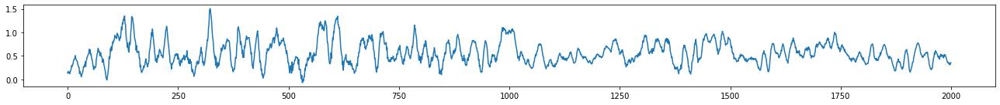

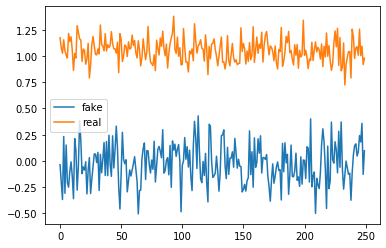

Epoch: 201 	 Discriminator Loss: [-0.54421335, 0.082] 		 Generator Loss: -0.3387516736984253
Epoch: 202 	 Discriminator Loss: [-0.5473161, 0.054] 		 Generator Loss: -0.381291002035141
Epoch: 203 	 Discriminator Loss: [-0.5496299, 0.018] 		 Generator Loss: -0.21091479063034058
Epoch: 204 	 Discriminator Loss: [-0.5401251, 0.008] 		 Generator Loss: -0.5296620726585388
Epoch: 205 	 Discriminator Loss: [-0.4522269, 0.5] 		 Generator Loss: 0.4421655535697937


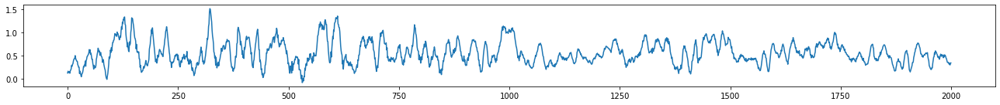

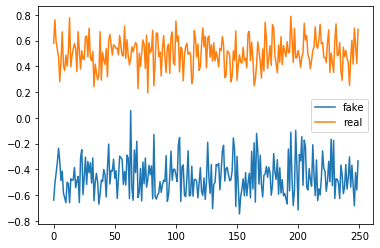

Epoch: 206 	 Discriminator Loss: [-0.40001434, 0.0] 		 Generator Loss: -4.163349628448486
Epoch: 207 	 Discriminator Loss: [-0.49941772, 0.5] 		 Generator Loss: -0.5417957901954651
Epoch: 208 	 Discriminator Loss: [-0.2045176, 0.5] 		 Generator Loss: -3.4746477603912354
Epoch: 209 	 Discriminator Loss: [-0.22174567, 0.5] 		 Generator Loss: -3.519826650619507
Epoch: 210 	 Discriminator Loss: [-0.39025638, 0.5] 		 Generator Loss: -0.03943299874663353


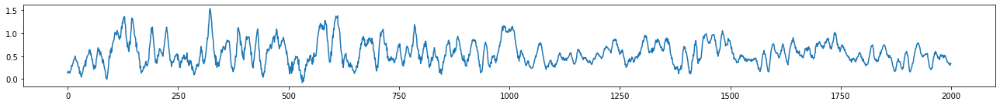

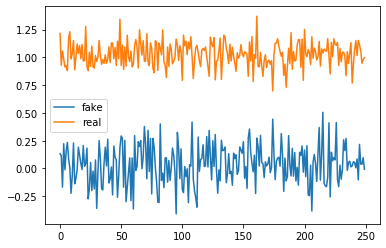

Epoch: 211 	 Discriminator Loss: [-0.32863972, 0.5] 		 Generator Loss: -1.7487807273864746
Epoch: 212 	 Discriminator Loss: [-0.48641834, 0.012] 		 Generator Loss: -0.2990249991416931
Epoch: 213 	 Discriminator Loss: [-0.49608266, 0.0] 		 Generator Loss: -0.2710447311401367
Epoch: 214 	 Discriminator Loss: [-0.33379376, 0.5] 		 Generator Loss: 0.6052346229553223
Epoch: 215 	 Discriminator Loss: [-0.48082107, 0.002] 		 Generator Loss: -0.4526517987251282


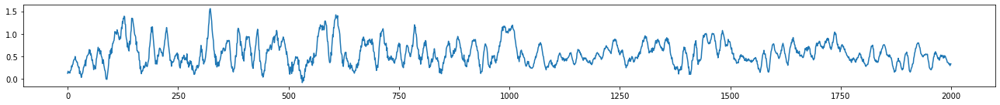

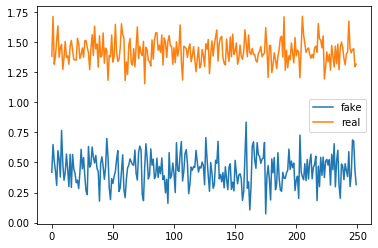

Epoch: 216 	 Discriminator Loss: [-0.4356476, 0.5] 		 Generator Loss: 0.6696915030479431
Epoch: 217 	 Discriminator Loss: [-0.47079262, 0.0] 		 Generator Loss: -0.06861204653978348
Epoch: 218 	 Discriminator Loss: [-0.15418763, 0.5] 		 Generator Loss: -3.4326744079589844
Epoch: 219 	 Discriminator Loss: [-0.3061348, 0.5] 		 Generator Loss: -1.36049485206604
Epoch: 220 	 Discriminator Loss: [-0.486148, 0.008] 		 Generator Loss: 0.0914190337061882


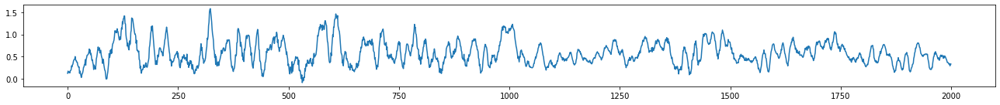

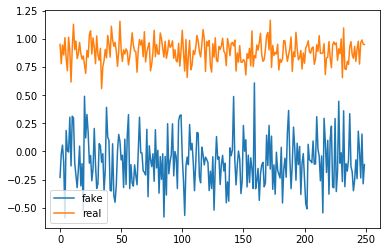

Epoch: 221 	 Discriminator Loss: [-0.47417673, 0.128] 		 Generator Loss: -0.6477051973342896
Epoch: 222 	 Discriminator Loss: [-0.49458608, 0.406] 		 Generator Loss: -0.47941699624061584
Epoch: 223 	 Discriminator Loss: [-0.5206321, 0.464] 		 Generator Loss: -1.0704905986785889
Epoch: 224 	 Discriminator Loss: [-0.49460438, 0.408] 		 Generator Loss: -1.3334647417068481
Epoch: 225 	 Discriminator Loss: [-0.527296, 0.5] 		 Generator Loss: -1.771360993385315


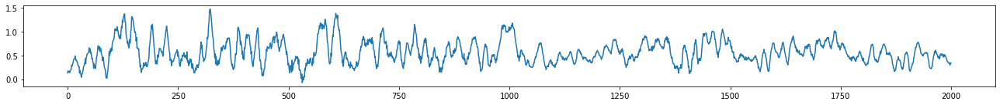

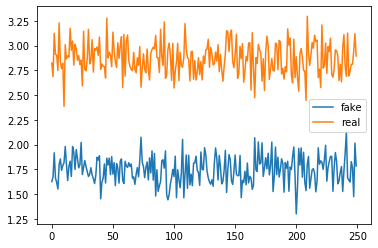

Epoch: 226 	 Discriminator Loss: [-0.55227524, 0.5] 		 Generator Loss: -0.9693173766136169
Epoch: 227 	 Discriminator Loss: [-0.54583716, 0.5] 		 Generator Loss: -1.5346101522445679
Epoch: 228 	 Discriminator Loss: [-0.37656873, 0.5] 		 Generator Loss: -3.134998321533203
Epoch: 229 	 Discriminator Loss: [-0.532577, 0.484] 		 Generator Loss: -1.5114890336990356
Epoch: 230 	 Discriminator Loss: [-0.54118687, 0.5] 		 Generator Loss: -1.3637372255325317


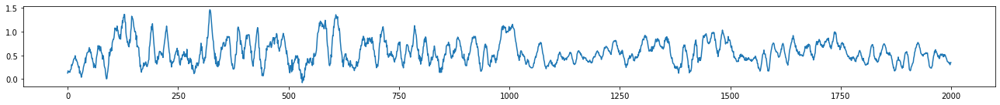

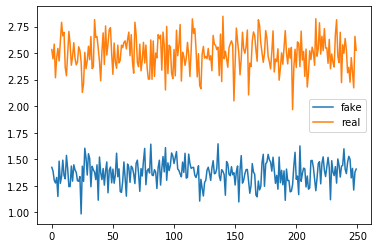

Epoch: 231 	 Discriminator Loss: [-0.53343064, 0.354] 		 Generator Loss: -1.293283462524414
Epoch: 232 	 Discriminator Loss: [-0.53610885, 0.498] 		 Generator Loss: -1.0777071714401245
Epoch: 233 	 Discriminator Loss: [-0.04145239, 0.0] 		 Generator Loss: -0.3654329180717468
Epoch: 234 	 Discriminator Loss: [-0.53208727, 0.492] 		 Generator Loss: -0.9944517612457275
Epoch: 235 	 Discriminator Loss: [-0.52028716, 0.5] 		 Generator Loss: -1.6467398405075073


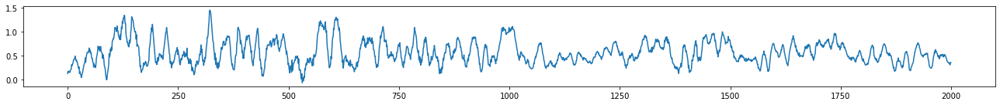

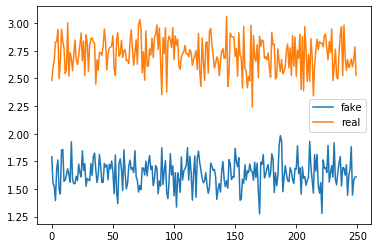

Epoch: 236 	 Discriminator Loss: [-0.23180036, 0.5] 		 Generator Loss: -4.789608478546143
Epoch: 237 	 Discriminator Loss: [-0.51806825, 0.5] 		 Generator Loss: -1.3051692247390747
Epoch: 238 	 Discriminator Loss: [-0.5226605, 0.498] 		 Generator Loss: -0.9455901980400085
Epoch: 239 	 Discriminator Loss: [-0.5141351, 0.5] 		 Generator Loss: -1.4034734964370728
Epoch: 240 	 Discriminator Loss: [-0.45336005, 0.5] 		 Generator Loss: 1.024267315864563


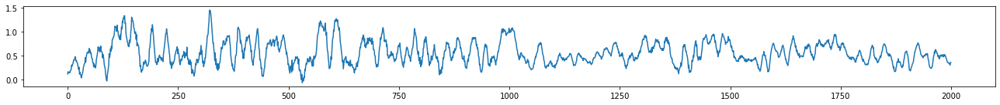

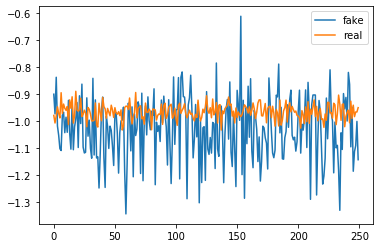

Epoch: 241 	 Discriminator Loss: [-0.3540857, 0.5] 		 Generator Loss: -3.9881813526153564
Epoch: 242 	 Discriminator Loss: [-0.5147317, 0.5] 		 Generator Loss: -0.651154637336731
Epoch: 243 	 Discriminator Loss: [-0.3619338, 0.5] 		 Generator Loss: -1.3599902391433716
Epoch: 244 	 Discriminator Loss: [-0.541179, 0.5] 		 Generator Loss: -2.812586784362793
Epoch: 245 	 Discriminator Loss: [-0.44913748, 0.016] 		 Generator Loss: -4.611037254333496


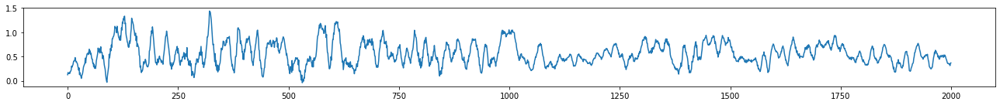

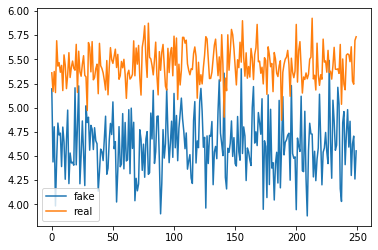

Epoch: 246 	 Discriminator Loss: [-0.5737383, 0.5] 		 Generator Loss: -2.0704729557037354
Epoch: 247 	 Discriminator Loss: [-0.5712283, 0.5] 		 Generator Loss: -1.884024739265442
Epoch: 248 	 Discriminator Loss: [-0.5445928, 0.5] 		 Generator Loss: 1.019849181175232
Epoch: 249 	 Discriminator Loss: [-0.5690507, 0.5] 		 Generator Loss: -2.3824212551116943
Epoch: 250 	 Discriminator Loss: [-0.5895204, 0.5] 		 Generator Loss: -2.1355767250061035


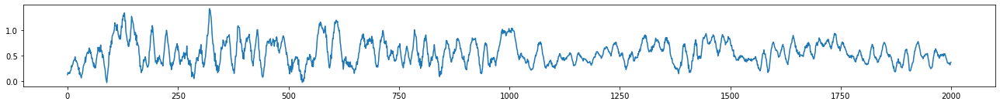

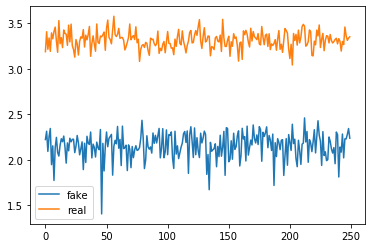

Epoch: 251 	 Discriminator Loss: [-0.59032613, 0.5] 		 Generator Loss: -2.6459014415740967
Epoch: 252 	 Discriminator Loss: [-0.56362045, 0.5] 		 Generator Loss: -2.231642007827759
Epoch: 253 	 Discriminator Loss: [-0.58124745, 0.5] 		 Generator Loss: -2.500300884246826
Epoch: 254 	 Discriminator Loss: [-0.5707597, 0.5] 		 Generator Loss: -0.9428224563598633
Epoch: 255 	 Discriminator Loss: [-0.31960437, 0.5] 		 Generator Loss: -3.9083669185638428


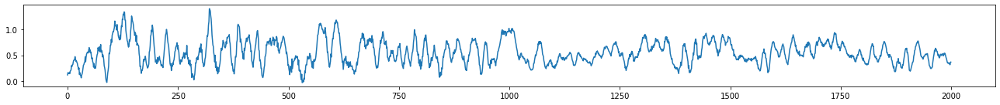

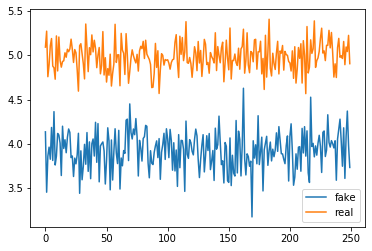

Epoch: 256 	 Discriminator Loss: [-0.55289114, 0.45] 		 Generator Loss: -2.8346221446990967
Epoch: 257 	 Discriminator Loss: [-0.5809203, 0.5] 		 Generator Loss: -2.8765366077423096
Epoch: 258 	 Discriminator Loss: [-0.048265688, 0.0] 		 Generator Loss: -4.2648725509643555
Epoch: 259 	 Discriminator Loss: [-0.56566155, 0.5] 		 Generator Loss: -2.962360143661499
Epoch: 260 	 Discriminator Loss: [-0.58769196, 0.5] 		 Generator Loss: -2.615633249282837


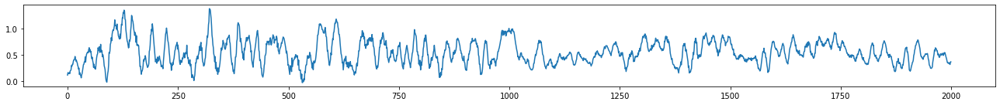

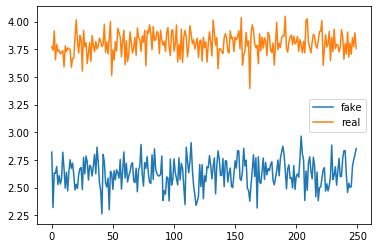

Epoch: 261 	 Discriminator Loss: [-0.58260804, 0.5] 		 Generator Loss: -3.4717304706573486
Epoch: 262 	 Discriminator Loss: [-0.58859205, 0.5] 		 Generator Loss: -2.2627615928649902
Epoch: 263 	 Discriminator Loss: [-0.57477015, 0.5] 		 Generator Loss: -2.210675001144409
Epoch: 264 	 Discriminator Loss: [-0.4094473, 0.5] 		 Generator Loss: -4.634995937347412
Epoch: 265 	 Discriminator Loss: [-0.48235968, 0.0] 		 Generator Loss: -5.678161144256592


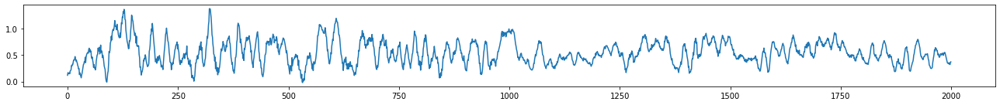

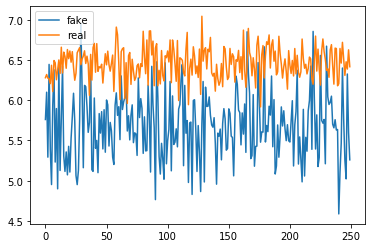

Epoch: 266 	 Discriminator Loss: [-0.45914084, 0.5] 		 Generator Loss: -4.49998664855957
Epoch: 267 	 Discriminator Loss: [-0.591406, 0.5] 		 Generator Loss: -2.159858226776123
Epoch: 268 	 Discriminator Loss: [-0.5779956, 0.5] 		 Generator Loss: -0.6609918475151062
Epoch: 269 	 Discriminator Loss: [-0.57570475, 0.5] 		 Generator Loss: -2.78379487991333
Epoch: 270 	 Discriminator Loss: [-0.547929, 0.5] 		 Generator Loss: 1.0316716432571411


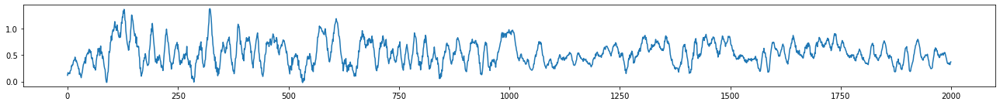

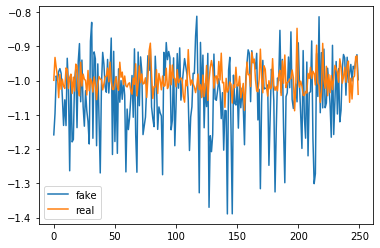

Epoch: 271 	 Discriminator Loss: [-0.6039679, 0.5] 		 Generator Loss: -2.197188138961792
Epoch: 272 	 Discriminator Loss: [-0.59232944, 0.5] 		 Generator Loss: -2.0572609901428223
Epoch: 273 	 Discriminator Loss: [-0.58794177, 0.5] 		 Generator Loss: -1.6901261806488037
Epoch: 274 	 Discriminator Loss: [-0.5811153, 0.5] 		 Generator Loss: -1.530444860458374
Epoch: 275 	 Discriminator Loss: [-0.57534283, 0.5] 		 Generator Loss: -1.4999901056289673


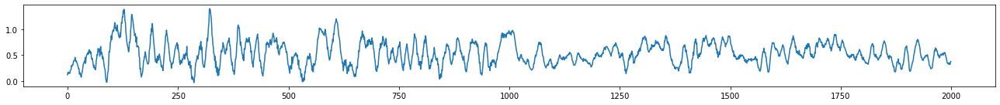

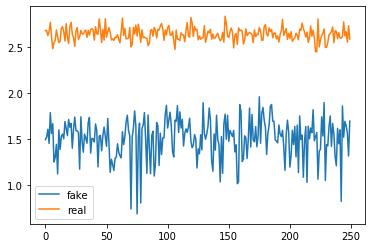

Epoch: 276 	 Discriminator Loss: [-0.5684621, 0.496] 		 Generator Loss: -2.6232645511627197
Epoch: 277 	 Discriminator Loss: [-0.42585596, 0.5] 		 Generator Loss: -5.229856967926025
Epoch: 278 	 Discriminator Loss: [-0.5800188, 0.5] 		 Generator Loss: -3.1529860496520996
Epoch: 279 	 Discriminator Loss: [-0.5661451, 0.5] 		 Generator Loss: -1.6600385904312134
Epoch: 280 	 Discriminator Loss: [-0.54838616, 0.5] 		 Generator Loss: -2.8770318031311035


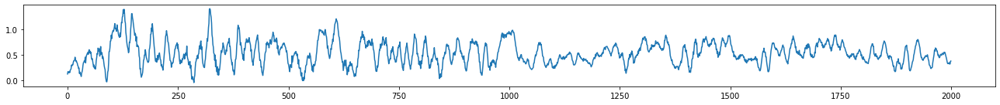

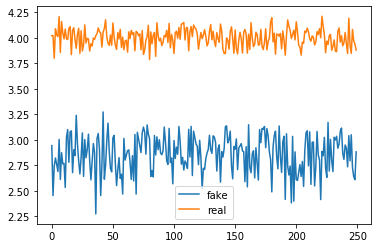

Epoch: 281 	 Discriminator Loss: [-0.4970635, 0.5] 		 Generator Loss: -0.32700467109680176
Epoch: 282 	 Discriminator Loss: [-0.45941156, 0.0] 		 Generator Loss: -5.848331928253174
Epoch: 283 	 Discriminator Loss: [-0.562532, 0.5] 		 Generator Loss: -2.1511166095733643
Epoch: 284 	 Discriminator Loss: [-0.55833757, 0.464] 		 Generator Loss: -2.1128175258636475
Epoch: 285 	 Discriminator Loss: [-0.39615571, 0.5] 		 Generator Loss: -5.604030132293701


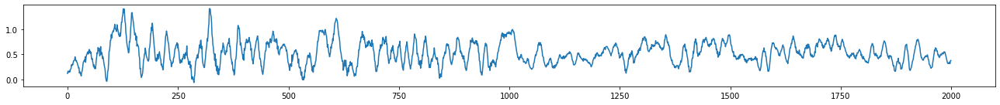

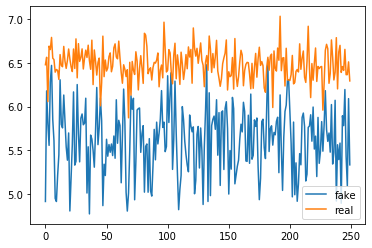

Epoch: 286 	 Discriminator Loss: [-0.5503645, 0.5] 		 Generator Loss: -1.3853201866149902
Epoch: 287 	 Discriminator Loss: [-0.5284389, 0.5] 		 Generator Loss: -2.338799476623535
Epoch: 288 	 Discriminator Loss: [-0.24645218, 0.5] 		 Generator Loss: -6.381948947906494
Epoch: 289 	 Discriminator Loss: [-0.53881735, 0.5] 		 Generator Loss: -2.5341360569000244
Epoch: 290 	 Discriminator Loss: [-0.2278013, 0.5] 		 Generator Loss: -6.402249813079834


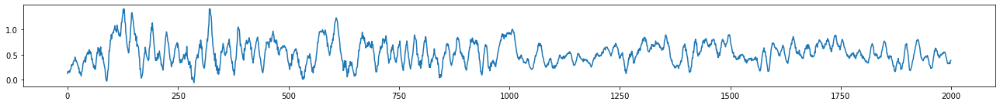

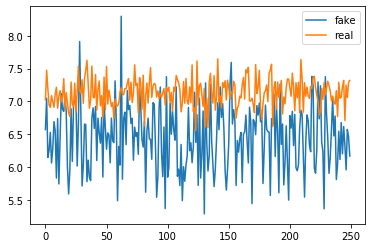

Epoch: 291 	 Discriminator Loss: [-0.54742163, 0.5] 		 Generator Loss: -2.126567840576172
Epoch: 292 	 Discriminator Loss: [-0.50385994, 0.366] 		 Generator Loss: -2.1796231269836426
Epoch: 293 	 Discriminator Loss: [-0.5417624, 0.5] 		 Generator Loss: -1.659665584564209
Epoch: 294 	 Discriminator Loss: [-0.3956639, 0.5] 		 Generator Loss: -4.206155300140381
Epoch: 295 	 Discriminator Loss: [-0.5296227, 0.5] 		 Generator Loss: -2.1246681213378906


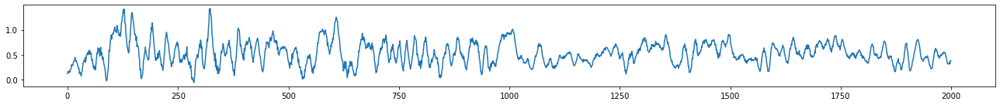

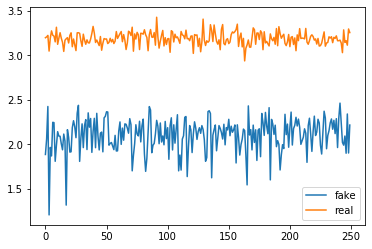

Epoch: 296 	 Discriminator Loss: [-0.52203214, 0.5] 		 Generator Loss: -0.394323468208313
Epoch: 297 	 Discriminator Loss: [-0.50929624, 0.498] 		 Generator Loss: -2.307270050048828
Epoch: 298 	 Discriminator Loss: [-0.52122355, 0.5] 		 Generator Loss: -2.253950834274292
Epoch: 299 	 Discriminator Loss: [-0.476013, 0.474] 		 Generator Loss: -2.473712682723999
Epoch: 300 	 Discriminator Loss: [-0.5321002, 0.5] 		 Generator Loss: -1.7830950021743774


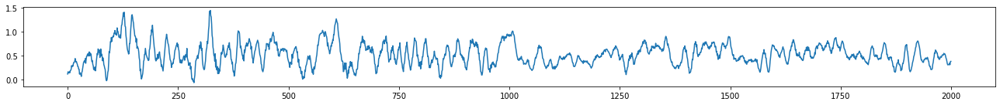

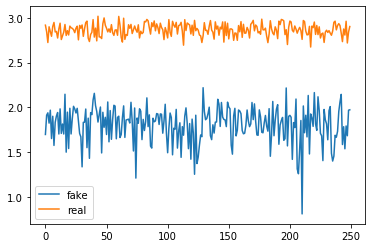

Epoch: 301 	 Discriminator Loss: [-0.51497483, 0.5] 		 Generator Loss: -0.9867755174636841
Epoch: 302 	 Discriminator Loss: [-0.5297773, 0.5] 		 Generator Loss: -1.8109031915664673
Epoch: 303 	 Discriminator Loss: [-0.51898295, 0.5] 		 Generator Loss: -1.6373549699783325
Epoch: 304 	 Discriminator Loss: [-0.53366774, 0.5] 		 Generator Loss: -1.77048921585083
Epoch: 305 	 Discriminator Loss: [-0.42474142, 0.5] 		 Generator Loss: -3.009016513824463


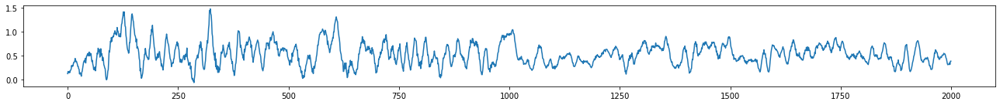

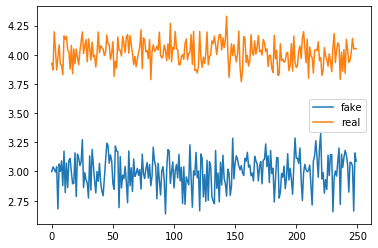

Epoch: 306 	 Discriminator Loss: [-0.5240749, 0.5] 		 Generator Loss: -1.4475291967391968
Epoch: 307 	 Discriminator Loss: [-0.55246127, 0.466] 		 Generator Loss: -0.9783282279968262
Epoch: 308 	 Discriminator Loss: [-0.43965754, 0.5] 		 Generator Loss: -3.1552059650421143
Epoch: 309 	 Discriminator Loss: [-0.4835826, 0.5] 		 Generator Loss: -1.6654237508773804
Epoch: 310 	 Discriminator Loss: [-0.3928034, 0.5] 		 Generator Loss: -4.982333660125732


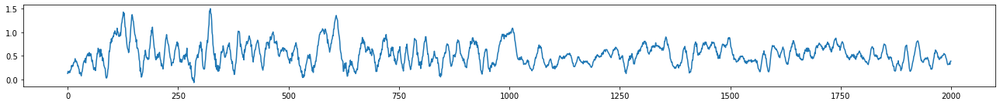

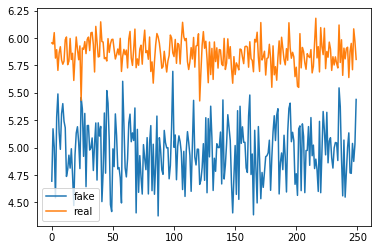

Epoch: 311 	 Discriminator Loss: [-0.50438416, 0.5] 		 Generator Loss: 0.9081852436065674
Epoch: 312 	 Discriminator Loss: [-0.46072093, 0.5] 		 Generator Loss: -4.195321559906006
Epoch: 313 	 Discriminator Loss: [-0.56978333, 0.5] 		 Generator Loss: -0.07645981013774872
Epoch: 314 	 Discriminator Loss: [-0.56774664, 0.488] 		 Generator Loss: -0.5881825089454651
Epoch: 315 	 Discriminator Loss: [-0.43575698, 0.5] 		 Generator Loss: -3.116208791732788


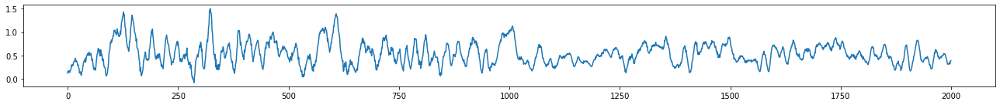

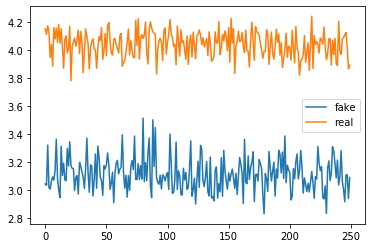

Epoch: 316 	 Discriminator Loss: [-0.3786473, 0.5] 		 Generator Loss: -4.606794357299805
Epoch: 317 	 Discriminator Loss: [-0.53311735, 0.008] 		 Generator Loss: -1.4098396301269531
Epoch: 318 	 Discriminator Loss: [-0.53128743, 0.47] 		 Generator Loss: -0.05918125435709953
Epoch: 319 	 Discriminator Loss: [-0.5280655, 0.5] 		 Generator Loss: -0.706506609916687
Epoch: 320 	 Discriminator Loss: [-0.3337905, 0.5] 		 Generator Loss: -4.256232738494873


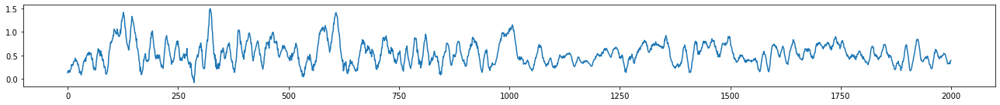

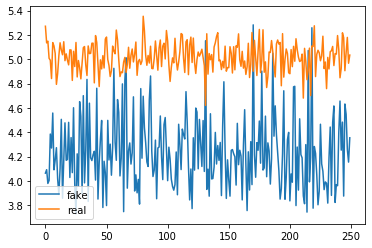

Epoch: 321 	 Discriminator Loss: [-0.024743246, 0.0] 		 Generator Loss: 0.8467380404472351
Epoch: 322 	 Discriminator Loss: [-0.50203276, 0.108] 		 Generator Loss: -0.9036682844161987
Epoch: 323 	 Discriminator Loss: [-0.4284597, 0.5] 		 Generator Loss: 0.46184200048446655
Epoch: 324 	 Discriminator Loss: [-0.39567032, 0.0] 		 Generator Loss: -7.051957130432129
Epoch: 325 	 Discriminator Loss: [-0.480428, 0.5] 		 Generator Loss: 0.867039144039154


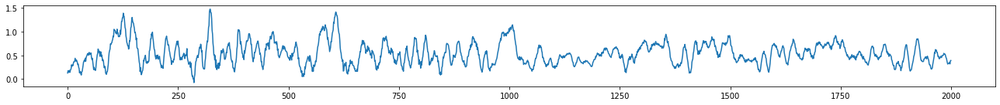

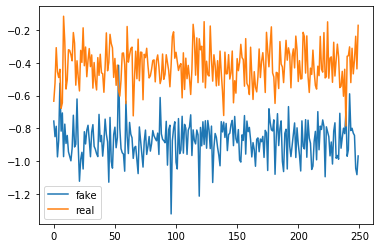

Epoch: 326 	 Discriminator Loss: [-0.52691543, 0.5] 		 Generator Loss: -2.2867703437805176
Epoch: 327 	 Discriminator Loss: [-0.36354446, 0.5] 		 Generator Loss: -5.024816513061523
Epoch: 328 	 Discriminator Loss: [-0.5646032, 0.5] 		 Generator Loss: -1.8410618305206299
Epoch: 329 	 Discriminator Loss: [-0.56919336, 0.5] 		 Generator Loss: -1.8418813943862915
Epoch: 330 	 Discriminator Loss: [-0.5250697, 0.0] 		 Generator Loss: -3.489414930343628


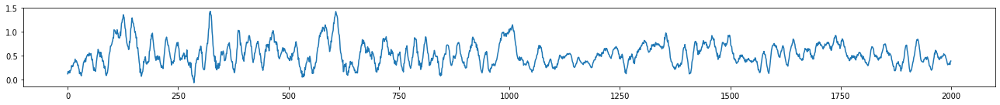

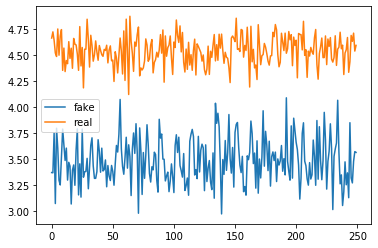

Epoch: 331 	 Discriminator Loss: [-0.56769925, 0.5] 		 Generator Loss: -1.6867986917495728
Epoch: 332 	 Discriminator Loss: [-0.57118815, 0.5] 		 Generator Loss: -1.5328369140625
Epoch: 333 	 Discriminator Loss: [-0.40715528, 0.5] 		 Generator Loss: -4.233260154724121
Epoch: 334 	 Discriminator Loss: [-0.5613357, 0.5] 		 Generator Loss: 0.06104341149330139
Epoch: 335 	 Discriminator Loss: [-0.54549336, 0.5] 		 Generator Loss: -2.2101991176605225


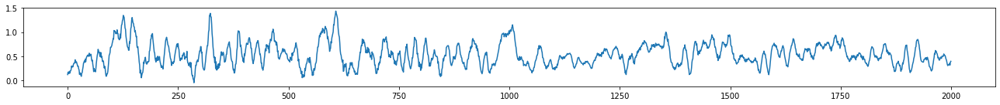

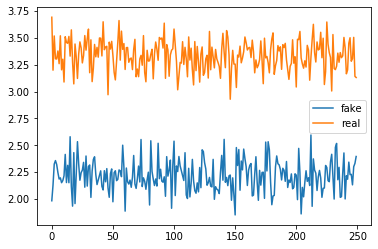

Epoch: 336 	 Discriminator Loss: [-0.25710332, 0.0] 		 Generator Loss: -7.264179229736328
Epoch: 337 	 Discriminator Loss: [-0.5446634, 0.27] 		 Generator Loss: -1.9010940790176392
Epoch: 338 	 Discriminator Loss: [-0.24367331, 0.0] 		 Generator Loss: -7.094947338104248
Epoch: 339 	 Discriminator Loss: [-0.45883426, 0.5] 		 Generator Loss: -0.725841224193573
Epoch: 340 	 Discriminator Loss: [-0.25559592, 0.5] 		 Generator Loss: -6.134323596954346


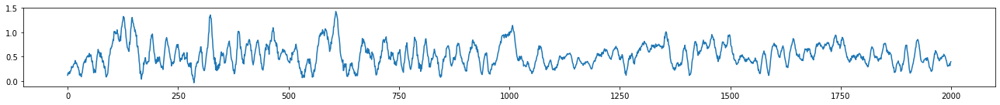

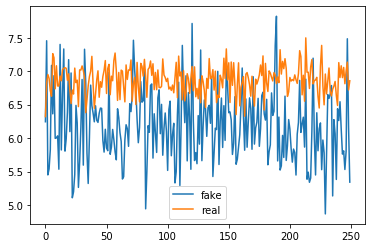

Epoch: 341 	 Discriminator Loss: [-0.5231697, 0.5] 		 Generator Loss: -1.799436092376709
Epoch: 342 	 Discriminator Loss: [-0.42821985, 0.0] 		 Generator Loss: -6.296180248260498
Epoch: 343 	 Discriminator Loss: [-0.37528345, 0.5] 		 Generator Loss: -3.974916458129883
Epoch: 344 	 Discriminator Loss: [-0.50362676, 0.5] 		 Generator Loss: -1.4582775831222534
Epoch: 345 	 Discriminator Loss: [-0.031460654, 0.0] 		 Generator Loss: -4.130339622497559


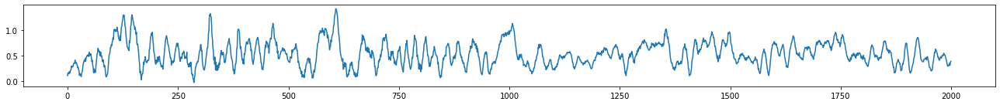

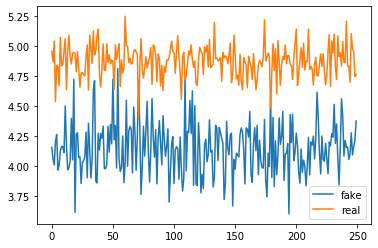

Epoch: 346 	 Discriminator Loss: [-0.39092222, 0.5] 		 Generator Loss: -3.011847972869873
Epoch: 347 	 Discriminator Loss: [-0.50608456, 0.498] 		 Generator Loss: -1.099719524383545
Epoch: 348 	 Discriminator Loss: [-0.49137974, 0.5] 		 Generator Loss: 0.8307710886001587
Epoch: 349 	 Discriminator Loss: [-0.51443595, 0.498] 		 Generator Loss: -1.2244364023208618
Epoch: 350 	 Discriminator Loss: [-0.48883814, 0.5] 		 Generator Loss: -1.076176404953003


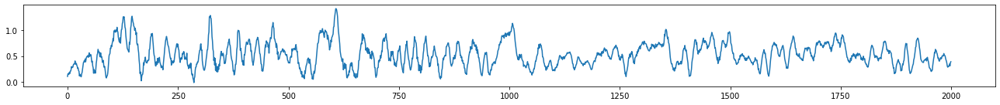

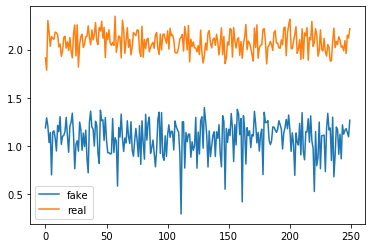

Epoch: 351 	 Discriminator Loss: [-0.49581572, 0.5] 		 Generator Loss: -1.5497980117797852
Epoch: 352 	 Discriminator Loss: [-0.4867521, 0.5] 		 Generator Loss: -2.256176710128784
Epoch: 353 	 Discriminator Loss: [-0.49109674, 0.5] 		 Generator Loss: -2.2024898529052734
Epoch: 354 	 Discriminator Loss: [-0.5008255, 0.5] 		 Generator Loss: -1.8837615251541138
Epoch: 355 	 Discriminator Loss: [-0.4055932, 0.5] 		 Generator Loss: -0.35524070262908936


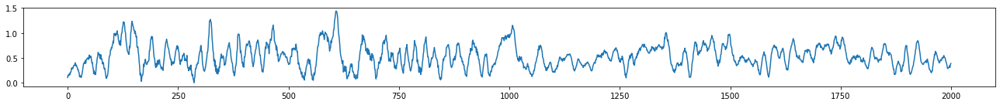

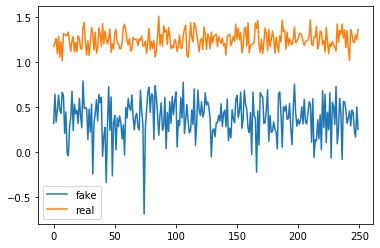

Epoch: 356 	 Discriminator Loss: [-0.49712288, 0.5] 		 Generator Loss: -1.8580172061920166
Epoch: 357 	 Discriminator Loss: [-0.49870262, 0.5] 		 Generator Loss: -2.622809410095215
Epoch: 358 	 Discriminator Loss: [-0.3801232, 0.5] 		 Generator Loss: -1.063514232635498
Epoch: 359 	 Discriminator Loss: [-0.49775413, 0.5] 		 Generator Loss: -1.7293416261672974
Epoch: 360 	 Discriminator Loss: [-0.501079, 0.5] 		 Generator Loss: -2.3848931789398193


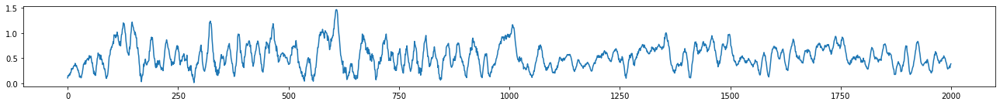

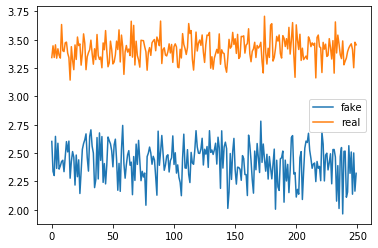

Epoch: 361 	 Discriminator Loss: [-0.50120467, 0.5] 		 Generator Loss: -2.06015944480896
Epoch: 362 	 Discriminator Loss: [-0.42192724, 0.5] 		 Generator Loss: 0.8127381801605225
Epoch: 363 	 Discriminator Loss: [-0.49577996, 0.5] 		 Generator Loss: -2.4818203449249268
Epoch: 364 	 Discriminator Loss: [-0.45080614, 0.5] 		 Generator Loss: 0.2329697161912918
Epoch: 365 	 Discriminator Loss: [-0.01648372, 0.0] 		 Generator Loss: 0.8620650172233582


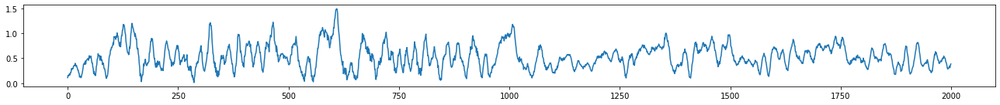

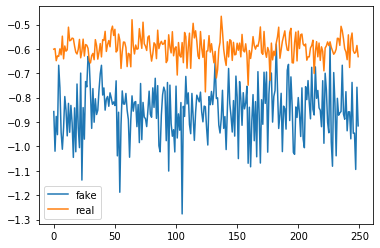

Epoch: 366 	 Discriminator Loss: [-0.50834566, 0.5] 		 Generator Loss: -1.5703935623168945
Epoch: 367 	 Discriminator Loss: [-0.51014024, 0.496] 		 Generator Loss: -1.7215790748596191
Epoch: 368 	 Discriminator Loss: [-0.41396117, 0.5] 		 Generator Loss: -0.240526020526886
Epoch: 369 	 Discriminator Loss: [-0.4816659, 0.112] 		 Generator Loss: -3.094935417175293
Epoch: 370 	 Discriminator Loss: [-0.4926532, 0.5] 		 Generator Loss: -1.026091456413269


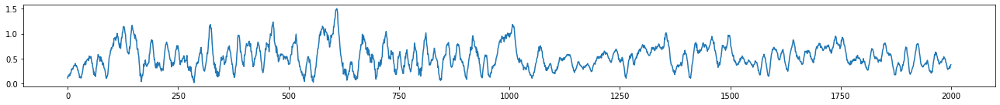

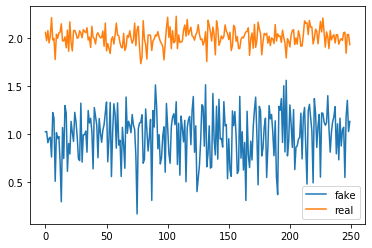

Epoch: 371 	 Discriminator Loss: [-0.5067499, 0.486] 		 Generator Loss: -1.8175934553146362
Epoch: 372 	 Discriminator Loss: [-0.5001334, 0.5] 		 Generator Loss: -1.0983226299285889
Epoch: 373 	 Discriminator Loss: [-0.4979568, 0.5] 		 Generator Loss: -1.5753215551376343
Epoch: 374 	 Discriminator Loss: [-0.49472868, 0.488] 		 Generator Loss: -2.295316219329834
Epoch: 375 	 Discriminator Loss: [-0.5004012, 0.5] 		 Generator Loss: -0.8059442639350891


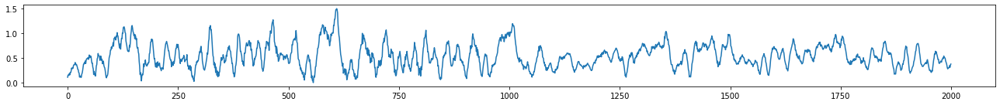

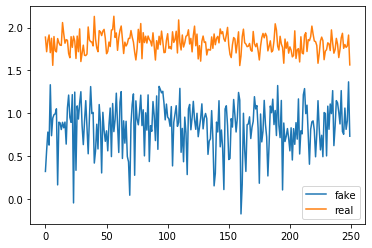

Epoch: 376 	 Discriminator Loss: [-0.5043757, 0.498] 		 Generator Loss: -0.8481580018997192
Epoch: 377 	 Discriminator Loss: [-0.50673306, 0.49] 		 Generator Loss: -0.9400294423103333
Epoch: 378 	 Discriminator Loss: [-0.50812453, 0.468] 		 Generator Loss: -1.257869839668274
Epoch: 379 	 Discriminator Loss: [-0.40597686, 0.0] 		 Generator Loss: -3.7874598503112793
Epoch: 380 	 Discriminator Loss: [-0.508815, 0.168] 		 Generator Loss: -1.629980444908142


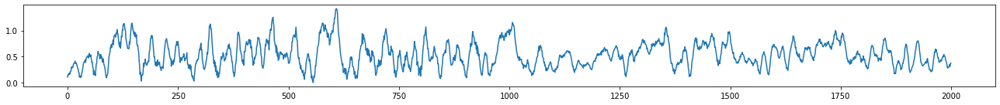

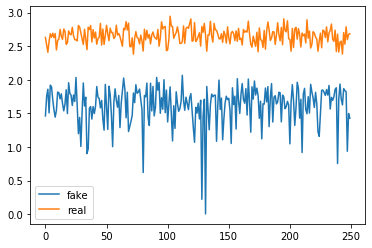

Epoch: 381 	 Discriminator Loss: [-0.49605185, 0.496] 		 Generator Loss: -0.9164748191833496
Epoch: 382 	 Discriminator Loss: [-0.4188014, 0.0] 		 Generator Loss: -3.3087308406829834
Epoch: 383 	 Discriminator Loss: [-0.50594884, 0.496] 		 Generator Loss: 0.04666401445865631
Epoch: 384 	 Discriminator Loss: [-0.501776, 0.426] 		 Generator Loss: -1.2222281694412231
Epoch: 385 	 Discriminator Loss: [-0.28967318, 0.5] 		 Generator Loss: -2.426086187362671


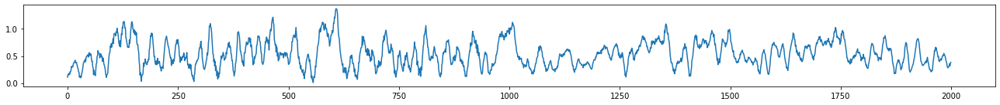

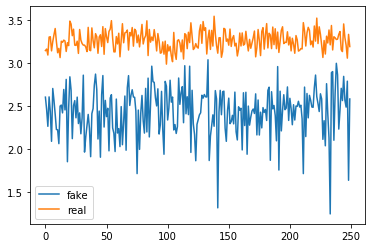

Epoch: 386 	 Discriminator Loss: [-0.523867, 0.344] 		 Generator Loss: -0.5807522535324097
Epoch: 387 	 Discriminator Loss: [-0.5315354, 0.06] 		 Generator Loss: -1.472214937210083
Epoch: 388 	 Discriminator Loss: [-0.47606033, 0.0] 		 Generator Loss: -2.4244794845581055
Epoch: 389 	 Discriminator Loss: [-0.38736302, 0.0] 		 Generator Loss: -3.6602652072906494
Epoch: 390 	 Discriminator Loss: [-0.50421405, 0.356] 		 Generator Loss: -0.9258996844291687


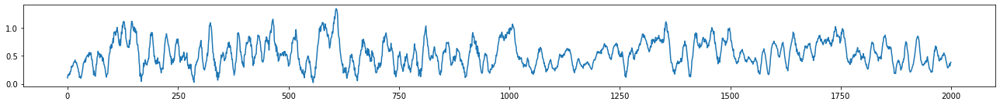

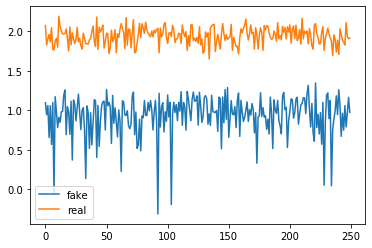

Epoch: 391 	 Discriminator Loss: [-0.49996677, 0.434] 		 Generator Loss: -0.8463516235351562
Epoch: 392 	 Discriminator Loss: [-0.49207124, 0.482] 		 Generator Loss: -0.8413791060447693
Epoch: 393 	 Discriminator Loss: [-0.4899254, 0.482] 		 Generator Loss: -0.37940412759780884
Epoch: 394 	 Discriminator Loss: [-0.497469, 0.47] 		 Generator Loss: -0.8580505847930908
Epoch: 395 	 Discriminator Loss: [-0.4728982, 0.006] 		 Generator Loss: -1.5736761093139648


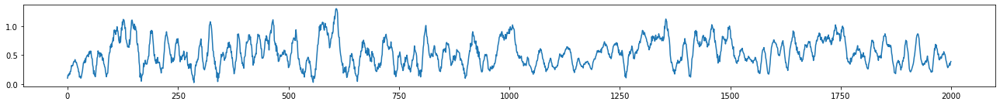

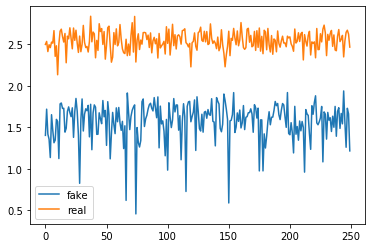

Epoch: 396 	 Discriminator Loss: [-0.50057596, 0.47] 		 Generator Loss: -0.7777629494667053
Epoch: 397 	 Discriminator Loss: [-0.50436485, 0.412] 		 Generator Loss: -0.8075320720672607
Epoch: 398 	 Discriminator Loss: [-0.51129556, 0.472] 		 Generator Loss: -0.6129736304283142
Epoch: 399 	 Discriminator Loss: [-0.48886317, 0.496] 		 Generator Loss: 0.3245643079280853


In [73]:
batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=10, disc_losses=disc_losses, gen_losses=gen_losses)

In [ ]:
valid = -np.ones((batch_size, 1))
fake = np.ones((batch_size, 1))
disc_labels = np.concatenate((valid, fake))
fake

# Testing

In [58]:
noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
disc.evaluate(gen.predict(noise),np.array([-1.]*batch_size))
disc.evaluate(db_train[np.random.randint(len(db_train[:,0,0]),size=batch_size)],np.ones(batch_size))

250/250 [==============================] - 0s 86us/sample - loss: -0.0096 - acc: 0.0000e+00


[-0.009590114757418633, 0.0]

In [59]:
#disc.predict(gen.predict(noise))
#disc.predict(db_train[np.random.randint(50000*(1-validation_split),size=batch_size)])

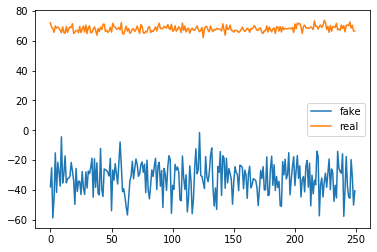

In [30]:
noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
plt.plot(disc.predict(gen.predict(noise)), label='fake')
plt.plot(disc.predict(db_train[np.random.randint(50000*(1-validation_split),size=batch_size)]), label='real')
plt.legend()
plt.show()

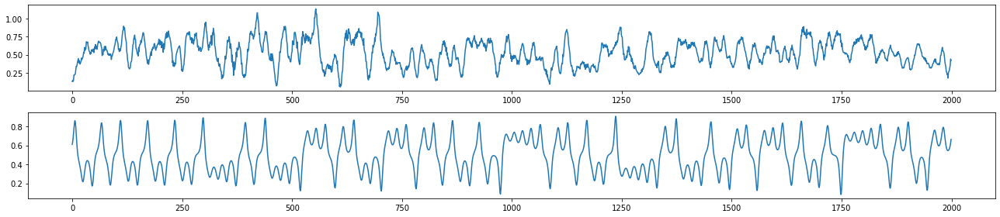

In [75]:
static_noise = np.random.normal(0, 1, size=(1, noise_dim))
plot_trajs(static_noise, db_train)

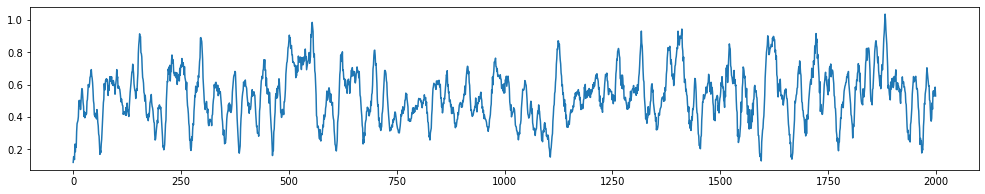

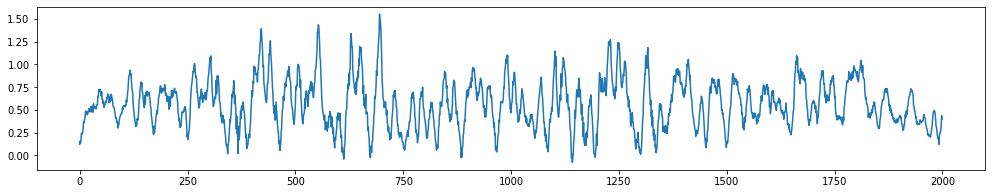

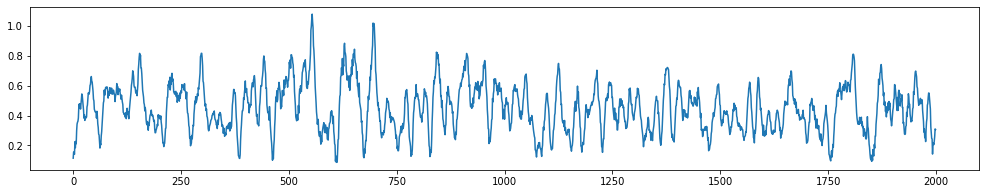

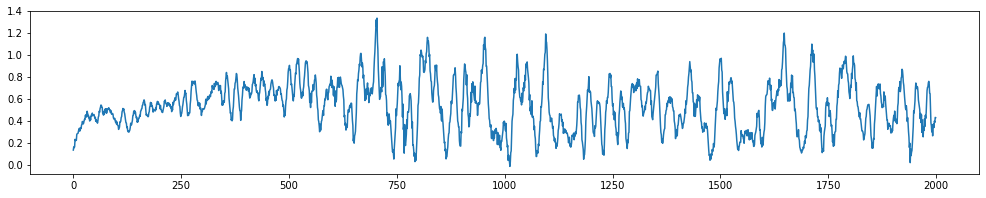

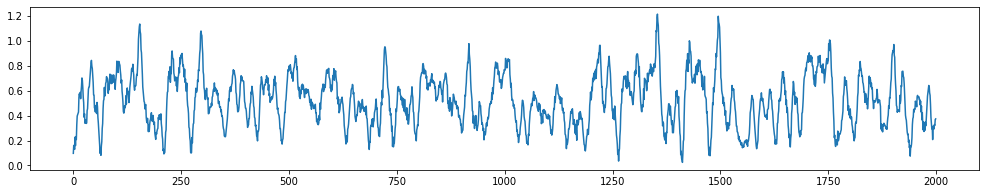

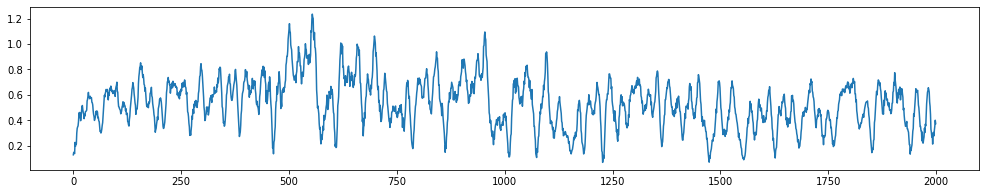

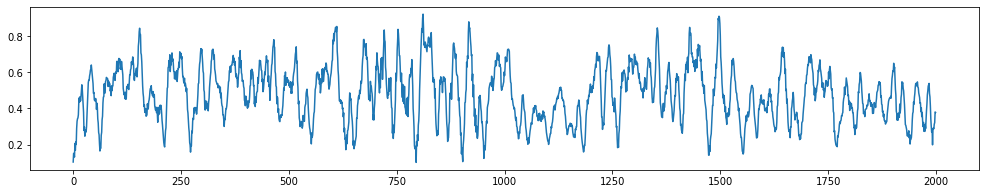

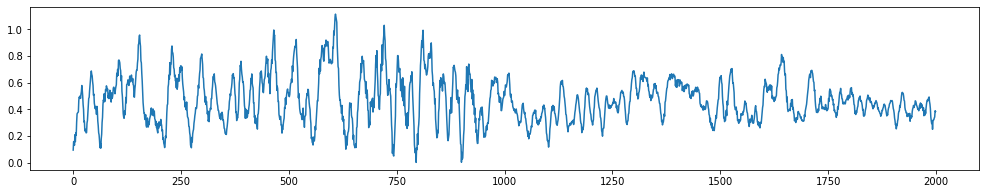

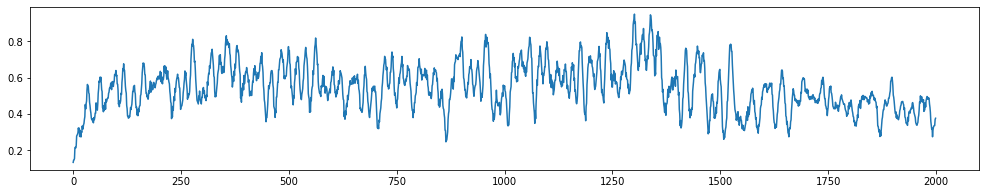

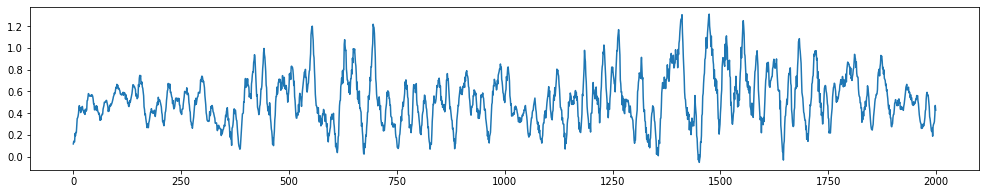

In [84]:
noise = np.random.normal(0, 1, size=(10,100))

for traj in gen.predict(noise):
    plt.figure(figsize=(17,3))
    plt.plot(traj)
    plt.show()

# Saving

In [74]:
#disc.save('wgan_disc.h5')
#gen.save('wgan_gen.0.h5')
#from tensorflow.keras.models import load_model
#gen = load_model('gan_gen_2.0.h5')